In [1]:
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.dates import (YEARLY, DateFormatter,
                              rrulewrapper, RRuleLocator, drange)
import datetime   # package that helps manipulate dates
import matplotlib.dates as mdates
import calendar

from dateutil.parser import parse     # package for date parsing
from prophet import Prophet
from pmdarima import auto_arima




# Aqicn data

If you are working with data from aqicn.org, then you need to run this code before using rolling_prophet_forcast_CI_with arima.

In [2]:
def change_df (df):
    data = df.copy()
    data.date = pd.to_datetime(data.date)
    data = data.sort_values(by ='date', ascending= False)

    data.columns = ['date','PM25','PM10','O3','NO2','SO2','CO']

    for col in data.columns:
        if col != 'date':
            data[col] = pd.to_numeric(data[col], errors ='coerce')
    data = data.dropna()
    data = data.sort_values('date', ascending =False)
    return data




# Nasa data

If you are working with data from NASA, then you need to run this code before using rolling_prophet_forcast_CI_with_arima.

In [3]:
def cleaning_NASA_data(a, pollutant):
    """
    Cleans NASA CSV data: renames columns, drops metadata rows, converts types, sorts by date,
    and filters for positive values of the pollutant.
    """
    a.columns = ['date', pollutant]
    a.drop(list(range(0, 7)), inplace=True)  # drops first 7 rows, adjust if necessary
    a[pollutant] = pd.to_numeric(a[pollutant], errors='coerce')
    a['date'] = pd.to_datetime(a['date'])
    a = a.sort_values('date')
    a = a[a[pollutant] > 0]
    a = a.reset_index(drop=True)
    return a


In [4]:
def make_agg(df, freq='D', pollutant='SO2'):
    df_agg = df.copy()
    df_agg['date'] = pd.to_datetime(df_agg['date'])
    if freq == 'D':
        df_agg = df_agg[['date', pollutant]]
        return df_agg.rename(columns={pollutant:  pollutant})
    elif freq == 'W':
        df_agg['date'] = df_agg['date'].dt.to_period('W').dt.start_time
        result = df_agg.groupby('date')[pollutant].mean().reset_index()
        return result.rename(columns={pollutant:  pollutant})
    elif freq == 'M':
        df_agg['date'] = df_agg['date'].dt.to_period('M').dt.start_time
        result = df_agg.groupby('date')[pollutant].mean().reset_index()
        return result.rename(columns={pollutant:  pollutant })
    else:
        raise ValueError("freq must be 'D', 'W', or 'M'")

In [5]:
from pmdarima import auto_arima

def rolling_prophet_forecast_CI_with_arima(
    df, pollutant='SO2', train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
):
    # Prophet rolling
    df = df.sort_values('date').reset_index(drop=True)
    df_prophet = df.rename(columns={'date':'ds', pollutant:'y'})[['ds','y']].dropna()
    results = []
    for train_end in range(train_steps, len(df_prophet)-test_steps+1, step):
        train = df_prophet.iloc[:train_end]
        test  = df_prophet.iloc[train_end:train_end+test_steps]
        m = Prophet(yearly_seasonality=True, weekly_seasonality=(freq!='M'), daily_seasonality=(freq=='D'), interval_width=0.95)
        m.fit(train)
        fcst = m.predict(test[['ds']])
        pred = fcst['yhat'].values
        lower = fcst['yhat_lower'].values
        upper = fcst['yhat_upper'].values
        y_true = test['y'].values
        for i in range(len(pred)):
            results.append({
                'ds': test['ds'].values[i],
                'real': y_true[i],
                'prophet_pred': pred[i],
                'lower_CI': lower[i],
                'upper_CI': upper[i]
            })
        del m

    results_df = pd.DataFrame(results)
    results_df = results_df.drop_duplicates(subset=['ds'])
    # Prophet residual
    results_df['residual'] = results_df['real'] - results_df['prophet_pred']
    # ARIMA modification
    arima_mod = auto_arima(results_df['residual'].values, seasonal=False, suppress_warnings=True, stepwise=True, error_action='ignore')
    arima_pred = arima_mod.predict_in_sample()
    results_df['arima_correction'] = arima_pred
    results_df['final_pred'] = results_df['prophet_pred'] + arima_pred
    results_df['arima_residual'] = results_df['real'] - results_df['final_pred']
    sigma = results_df['arima_residual'].std()
    results_df['zscore'] = results_df['arima_residual'] / sigma if sigma > 0 else 0
    results_df['outlier'] = np.abs(results_df['zscore']) > z_thresh

    if plot:
        plt.figure(figsize=(15,5))
        plt.plot(results_df['ds'], results_df['real'], color='gray', alpha=0.4, label='Observed')
        plt.plot(results_df['ds'], results_df['final_pred'], color='blue', label='Prophet(rolling)+ARIMA')
        plt.fill_between(results_df['ds'], results_df['lower_CI'], results_df['upper_CI'], color='skyblue', alpha=0.18, label='Prophet 95% CI')
        plt.scatter(results_df.loc[results_df['outlier'], 'ds'],
                    results_df.loc[results_df['outlier'], 'real'],
                    color='red', s=32, label=f'Anomaly (|z|>{z_thresh})')
        plt.xlabel('Date'); plt.ylabel(pollutant.upper())
        plt.title(f'Prophet(rolling)+ARIMA: Prediction, CI, Residual, Anomaly [{freq}]')
        plt.legend(); plt.tight_layout(); plt.show()

    return results_df



In [6]:
def plot_arima_anomaly_band(results_df, pollutant='SO2', shading_k=3, z_thresh=3, freq='D'):
    """
    results_df: DataFrame with columns ['ds', 'real', 'final_pred', 'arima_residual', 'outlier']
    """
    sigma = results_df['arima_residual'].std()
    # 신뢰구간 계산
    lower = results_df['final_pred'] - shading_k * sigma
    upper = results_df['final_pred'] + shading_k * sigma

    plt.figure(figsize=(15,5))
    plt.plot(results_df['ds'], results_df['real'], color='gray', alpha=0.4, label='Observed')
    plt.plot(results_df['ds'], results_df['final_pred'], color='blue', label='Prophet(rolling)+ARIMA')
    plt.fill_between(results_df['ds'], lower, upper, color='skyblue', alpha=0.18, label=f'Prophet+ARIMA ±{shading_k}σ')
    plt.scatter(results_df.loc[results_df['outlier'], 'ds'],
                results_df.loc[results_df['outlier'], 'real'],
                color='red', s=32, label=f'Anomaly (|z|>{z_thresh})')
    plt.xlabel('Date'); plt.ylabel(pollutant.upper())
    plt.title(f'Prophet(rolling)+ARIMA: Prediction, Anomaly Band, Outlier [{freq}]')
    plt.legend(); plt.tight_layout(); plt.show()

In [7]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
import matplotlib.pyplot as plt

def residual_diagnostics(res_df, lags=[10, 20, 30], title=''):
    resid = res_df['arima_residual'].values
    max_lags = min(max(lags), len(resid)//2 - 1)  # 데이터 길이에 맞춰 최대 lags 제한
    lags_to_use = [lag for lag in lags if lag <= max_lags]
    
    import matplotlib.pyplot as plt
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
    from statsmodels.stats.diagnostic import acorr_ljungbox

    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    plot_acf(resid, lags=max_lags, zero=False, ax=plt.gca())
    plt.title(f'ACF {title}')
    plt.subplot(1,2,2)
    plot_pacf(resid, lags=max_lags, zero=False, ax=plt.gca())
    plt.title(f'PACF {title}')
    plt.tight_layout()
    plt.show()

    lb = acorr_ljungbox(resid, lags=lags_to_use, return_df=True)
    print(f'Ljung-Box Test {title} (using lags {lags_to_use}):\n{lb}\n')


# Cangzhou Plant

In [8]:
df_czh_NASA = pd.read_csv('Huaneng_SO2/Huaneng_cangzhou.csv')
df_czh_NASA = cleaning_NASA_data(df_czh_NASA,'SO2')
df_czh_NASA

,date,SO2
0,2014-01-01,0.325
1,2014-01-03,0.220
2,2014-01-04,0.910
3,2014-01-15,0.100
4,2014-01-19,0.050
...,...,...
577,2025-05-24,0.075
578,2025-05-25,0.360
579,2025-06-04,0.130
580,2025-06-09,0.450


01:19:48 - cmdstanpy - INFO - Chain [1] start processing
01:19:48 - cmdstanpy - INFO - Chain [1] done processing
01:19:48 - cmdstanpy - INFO - Chain [1] start processing
01:19:48 - cmdstanpy - INFO - Chain [1] done processing
01:19:48 - cmdstanpy - INFO - Chain [1] start processing
01:19:48 - cmdstanpy - INFO - Chain [1] done processing
01:19:48 - cmdstanpy - INFO - Chain [1] start processing
01:19:48 - cmdstanpy - INFO - Chain [1] done processing
01:19:48 - cmdstanpy - INFO - Chain [1] start processing
01:19:48 - cmdstanpy - INFO - Chain [1] done processing
01:19:49 - cmdstanpy - INFO - Chain [1] start processing
01:19:49 - cmdstanpy - INFO - Chain [1] done processing
01:19:49 - cmdstanpy - INFO - Chain [1] start processing
01:19:49 - cmdstanpy - INFO - Chain [1] done processing
01:19:49 - cmdstanpy - INFO - Chain [1] start processing
01:19:49 - cmdstanpy - INFO - Chain [1] done processing
01:19:49 - cmdstanpy - INFO - Chain [1] start processing
01:19:49 - cmdstanpy - INFO - Chain [1]

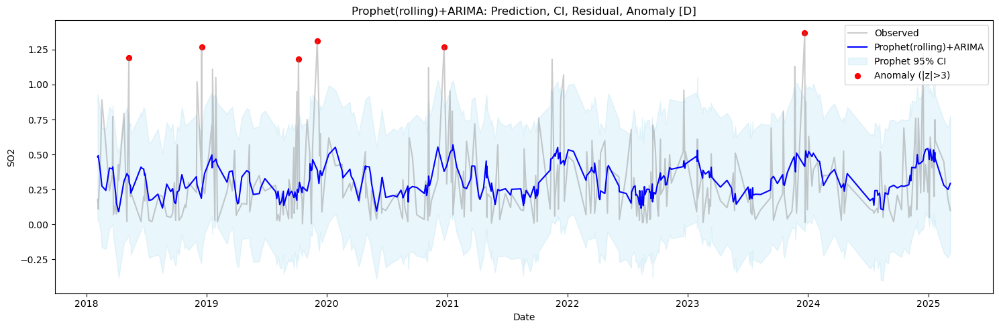

01:19:50 - cmdstanpy - INFO - Chain [1] start processing
01:19:51 - cmdstanpy - INFO - Chain [1] done processing
01:19:51 - cmdstanpy - INFO - Chain [1] start processing
01:19:51 - cmdstanpy - INFO - Chain [1] done processing
01:19:51 - cmdstanpy - INFO - Chain [1] start processing
01:19:51 - cmdstanpy - INFO - Chain [1] done processing
01:19:51 - cmdstanpy - INFO - Chain [1] start processing
01:19:51 - cmdstanpy - INFO - Chain [1] done processing
01:19:51 - cmdstanpy - INFO - Chain [1] start processing
01:19:52 - cmdstanpy - INFO - Chain [1] done processing
01:19:52 - cmdstanpy - INFO - Chain [1] start processing
01:19:52 - cmdstanpy - INFO - Chain [1] done processing
01:19:52 - cmdstanpy - INFO - Chain [1] start processing
01:19:52 - cmdstanpy - INFO - Chain [1] done processing
01:19:52 - cmdstanpy - INFO - Chain [1] start processing
01:19:52 - cmdstanpy - INFO - Chain [1] done processing
01:19:53 - cmdstanpy - INFO - Chain [1] start processing
01:19:53 - cmdstanpy - INFO - Chain [1]

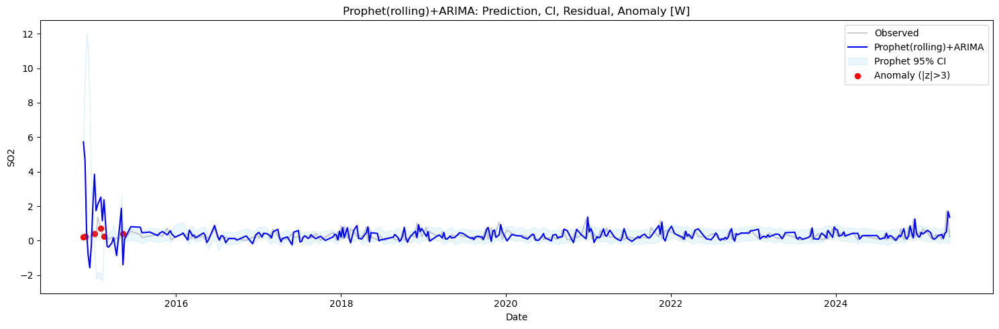

01:20:10 - cmdstanpy - INFO - Chain [1] start processing
01:20:11 - cmdstanpy - INFO - Chain [1] done processing
01:20:11 - cmdstanpy - INFO - Chain [1] start processing
01:20:11 - cmdstanpy - INFO - Chain [1] done processing
01:20:11 - cmdstanpy - INFO - Chain [1] start processing
01:20:11 - cmdstanpy - INFO - Chain [1] done processing
01:20:11 - cmdstanpy - INFO - Chain [1] start processing
01:20:14 - cmdstanpy - INFO - Chain [1] done processing
01:20:14 - cmdstanpy - INFO - Chain [1] start processing
01:20:20 - cmdstanpy - INFO - Chain [1] done processing
01:20:20 - cmdstanpy - INFO - Chain [1] start processing
01:20:21 - cmdstanpy - INFO - Chain [1] done processing
01:20:22 - cmdstanpy - INFO - Chain [1] start processing
01:20:22 - cmdstanpy - INFO - Chain [1] done processing
01:20:22 - cmdstanpy - INFO - Chain [1] start processing
01:20:29 - cmdstanpy - INFO - Chain [1] done processing
01:20:29 - cmdstanpy - INFO - Chain [1] start processing
01:20:29 - cmdstanpy - INFO - Chain [1]

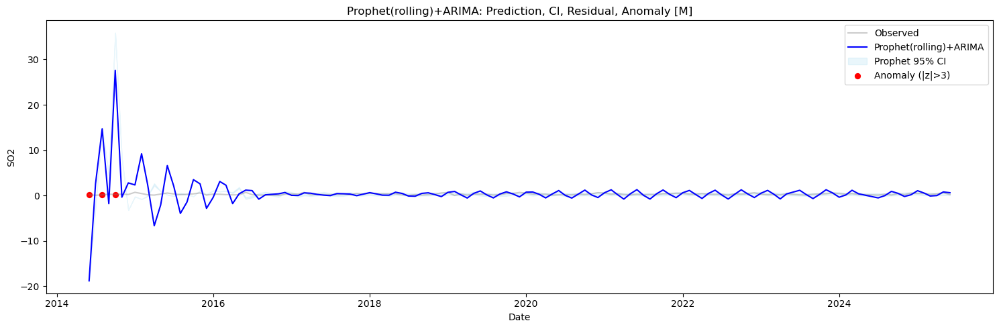

In [9]:
df_czh_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_czh_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=200, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_czh_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_czh_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=25, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_czh_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_czh_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=5, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

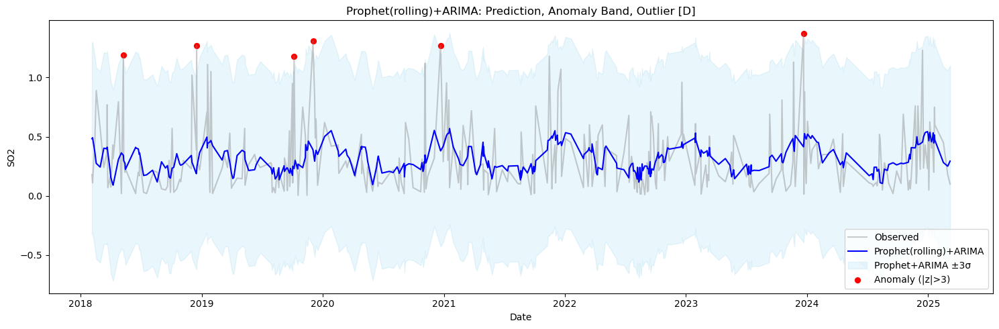

In [10]:
plot_arima_anomaly_band(df_czh_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


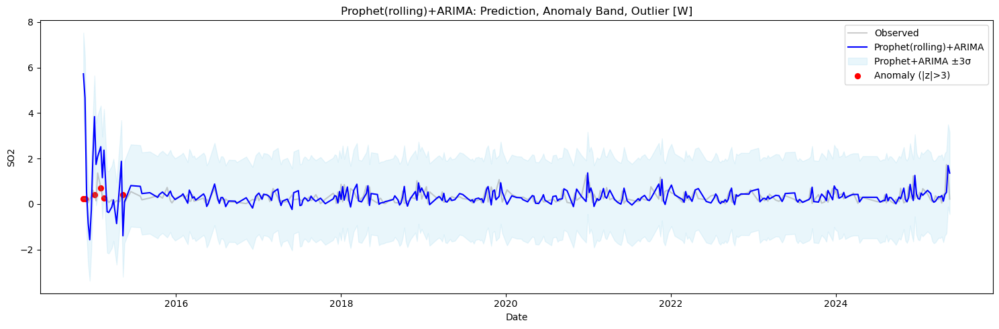

In [11]:
plot_arima_anomaly_band(df_czh_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


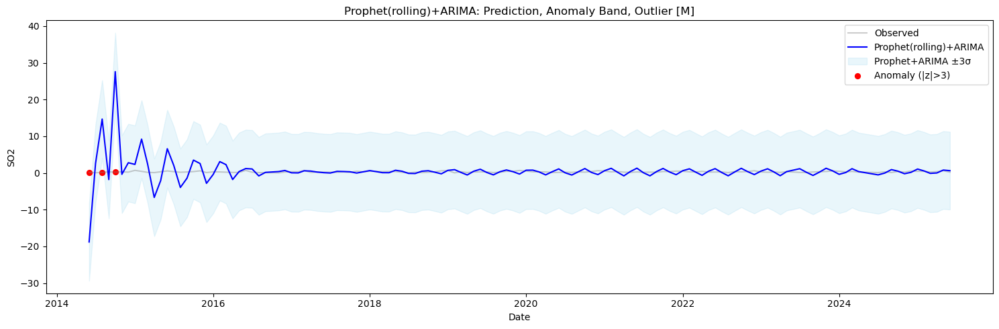

In [12]:
plot_arima_anomaly_band(df_czh_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


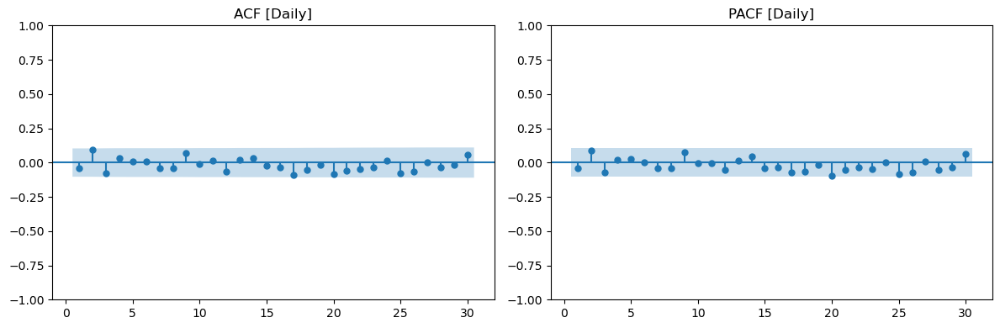

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   9.387110   0.495801
20  19.435637   0.493693
30  27.721102   0.585213



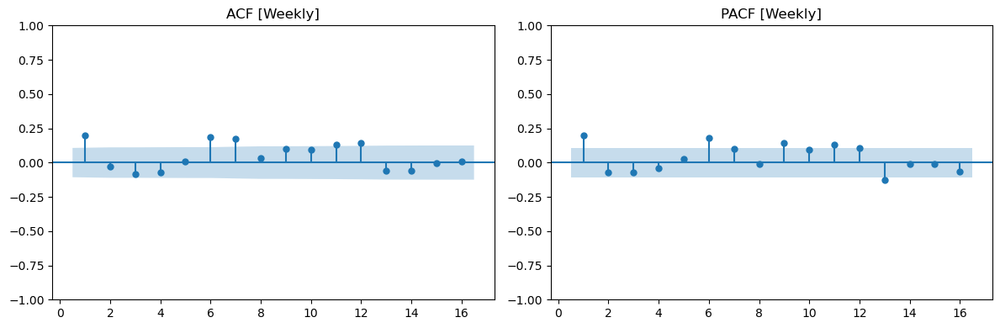

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   40.547245  2.532851e-06
12  59.769138  2.486944e-08
16  62.429503  2.029017e-07



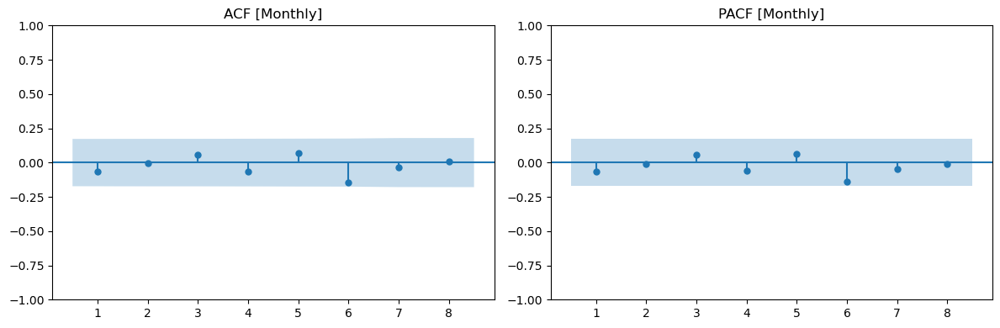

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  1.605766   0.807755
8  5.304462   0.724594



In [13]:
# Daily residual
residual_diagnostics(df_czh_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_czh_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_czh_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Dezhou Plant

In [14]:
df_dzu_NASA = pd.read_csv('Huaneng_SO2/Huaneng_Dezhou.csv')
df_dzu_NASA = cleaning_NASA_data(df_dzu_NASA,'SO2')
df_dzu_NASA

,date,SO2
0,2014-01-04,1.60
1,2014-01-05,0.27
2,2014-01-13,1.99
3,2014-01-20,0.32
4,2014-01-22,1.67
...,...,...
688,2025-06-15,0.12
689,2025-06-17,0.03
690,2025-06-18,0.24
691,2025-06-20,0.03


01:21:45 - cmdstanpy - INFO - Chain [1] start processing
01:21:45 - cmdstanpy - INFO - Chain [1] done processing
01:21:45 - cmdstanpy - INFO - Chain [1] start processing
01:21:45 - cmdstanpy - INFO - Chain [1] done processing
01:21:45 - cmdstanpy - INFO - Chain [1] start processing
01:21:45 - cmdstanpy - INFO - Chain [1] done processing
01:21:45 - cmdstanpy - INFO - Chain [1] start processing
01:21:45 - cmdstanpy - INFO - Chain [1] done processing
01:21:45 - cmdstanpy - INFO - Chain [1] start processing
01:21:45 - cmdstanpy - INFO - Chain [1] done processing
01:21:46 - cmdstanpy - INFO - Chain [1] start processing
01:21:46 - cmdstanpy - INFO - Chain [1] done processing
01:21:46 - cmdstanpy - INFO - Chain [1] start processing
01:21:46 - cmdstanpy - INFO - Chain [1] done processing
01:21:46 - cmdstanpy - INFO - Chain [1] start processing
01:21:46 - cmdstanpy - INFO - Chain [1] done processing
01:21:46 - cmdstanpy - INFO - Chain [1] start processing
01:21:46 - cmdstanpy - INFO - Chain [1]

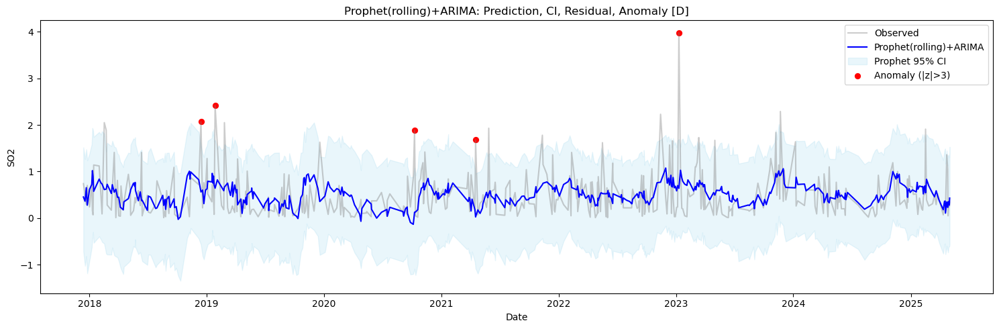

01:21:52 - cmdstanpy - INFO - Chain [1] start processing
01:21:52 - cmdstanpy - INFO - Chain [1] done processing
01:21:52 - cmdstanpy - INFO - Chain [1] start processing
01:21:52 - cmdstanpy - INFO - Chain [1] done processing
01:21:52 - cmdstanpy - INFO - Chain [1] start processing
01:21:52 - cmdstanpy - INFO - Chain [1] done processing
01:21:53 - cmdstanpy - INFO - Chain [1] start processing
01:21:53 - cmdstanpy - INFO - Chain [1] done processing
01:21:53 - cmdstanpy - INFO - Chain [1] start processing
01:21:53 - cmdstanpy - INFO - Chain [1] done processing
01:21:53 - cmdstanpy - INFO - Chain [1] start processing
01:21:53 - cmdstanpy - INFO - Chain [1] done processing
01:21:54 - cmdstanpy - INFO - Chain [1] start processing
01:21:54 - cmdstanpy - INFO - Chain [1] done processing
01:21:54 - cmdstanpy - INFO - Chain [1] start processing
01:21:54 - cmdstanpy - INFO - Chain [1] done processing
01:21:54 - cmdstanpy - INFO - Chain [1] start processing
01:21:54 - cmdstanpy - INFO - Chain [1]

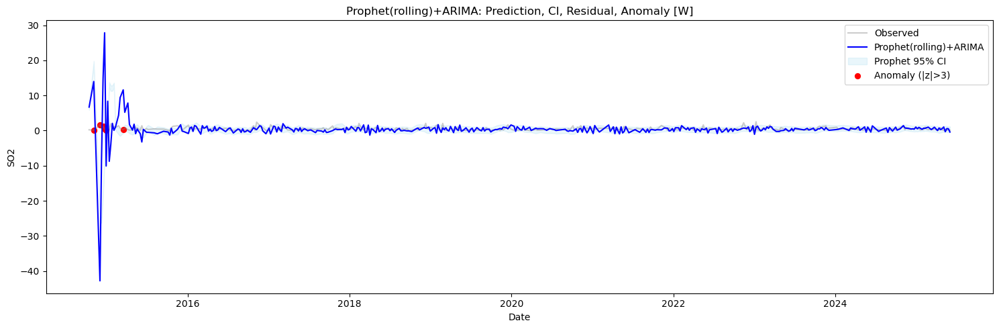

01:22:18 - cmdstanpy - INFO - Chain [1] start processing
01:22:18 - cmdstanpy - INFO - Chain [1] done processing
01:22:19 - cmdstanpy - INFO - Chain [1] start processing
01:22:21 - cmdstanpy - INFO - Chain [1] done processing
01:22:21 - cmdstanpy - INFO - Chain [1] start processing
01:22:21 - cmdstanpy - INFO - Chain [1] done processing
01:22:21 - cmdstanpy - INFO - Chain [1] start processing
01:22:21 - cmdstanpy - INFO - Chain [1] done processing
01:22:22 - cmdstanpy - INFO - Chain [1] start processing
01:22:22 - cmdstanpy - INFO - Chain [1] done processing
01:22:22 - cmdstanpy - INFO - Chain [1] start processing
01:22:22 - cmdstanpy - INFO - Chain [1] done processing
01:22:22 - cmdstanpy - INFO - Chain [1] start processing
01:22:24 - cmdstanpy - INFO - Chain [1] done processing
01:22:24 - cmdstanpy - INFO - Chain [1] start processing
01:22:25 - cmdstanpy - INFO - Chain [1] done processing
01:22:25 - cmdstanpy - INFO - Chain [1] start processing
01:22:25 - cmdstanpy - INFO - Chain [1]

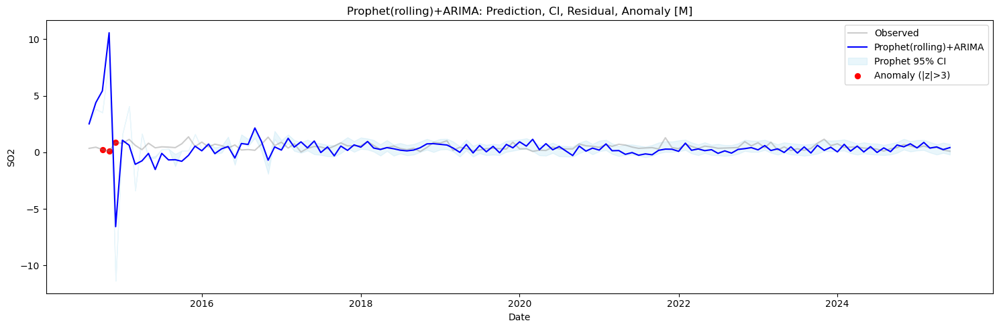

In [15]:
df_dzu_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_dzu_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=230, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_dzu_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_dzu_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=30, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_dzu_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_dzu_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=7, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

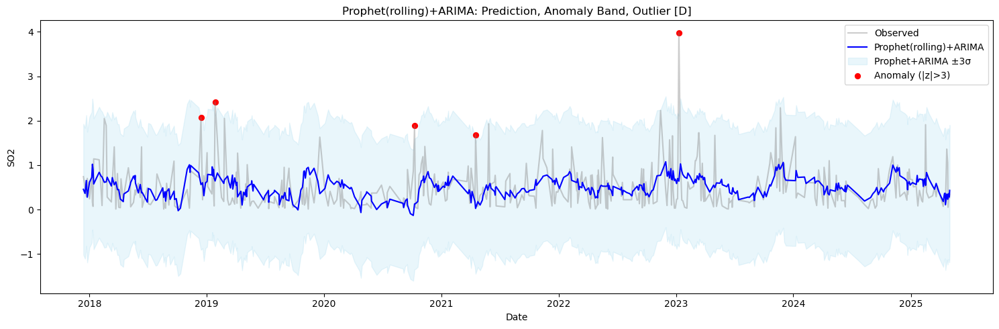

In [16]:
plot_arima_anomaly_band(df_dzu_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


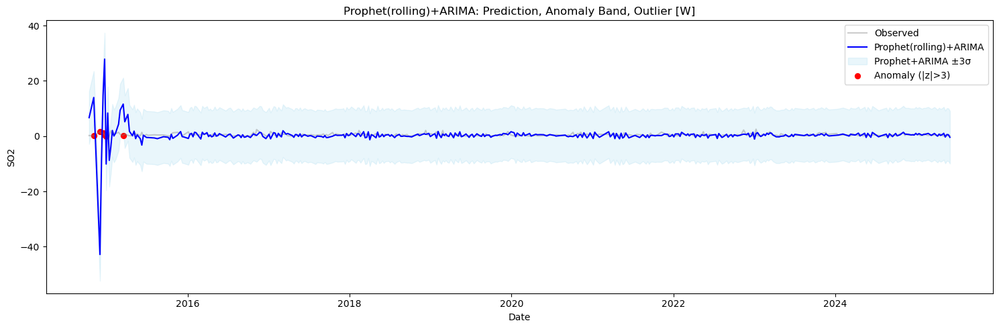

In [17]:
plot_arima_anomaly_band(df_dzu_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


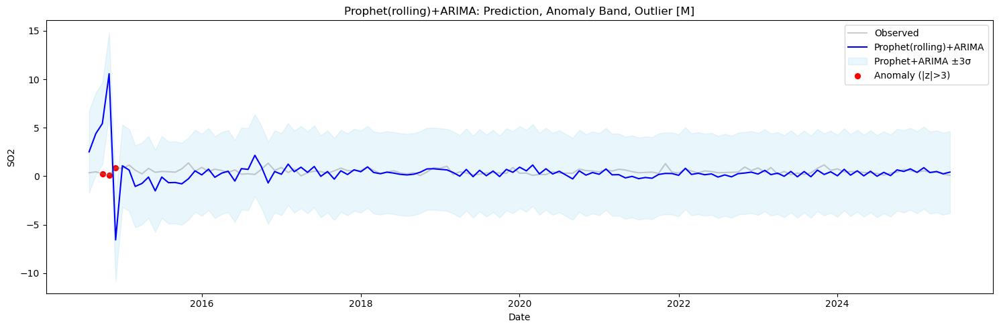

In [18]:
plot_arima_anomaly_band(df_dzu_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


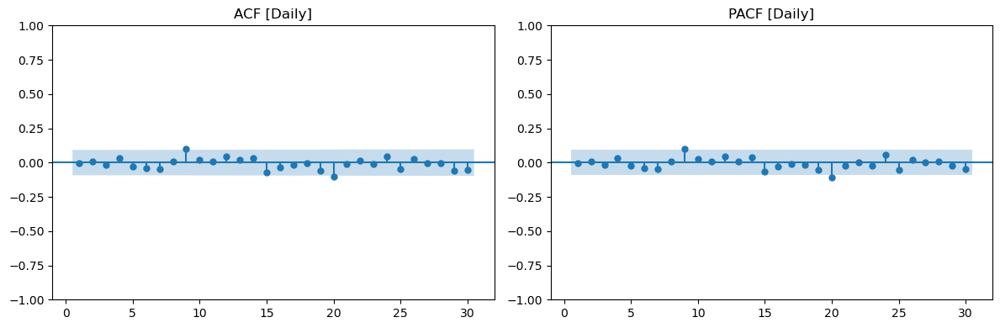

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   7.240486   0.702563
20  18.694306   0.541769
30  24.627018   0.742948



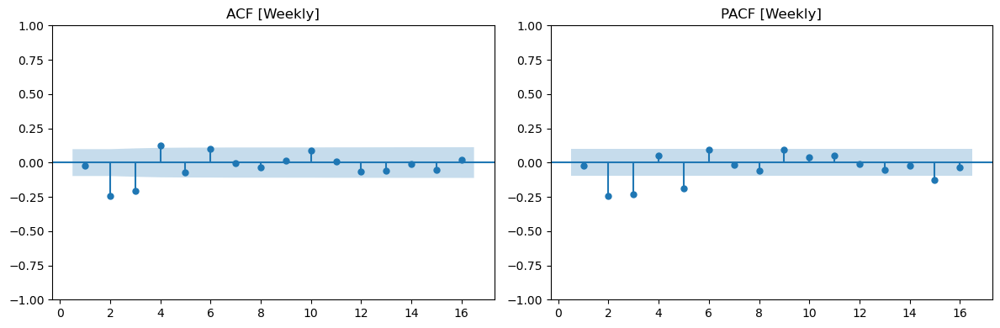

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   54.700912  5.046994e-09
12  59.638664  2.626804e-08
16  62.682350  1.837419e-07



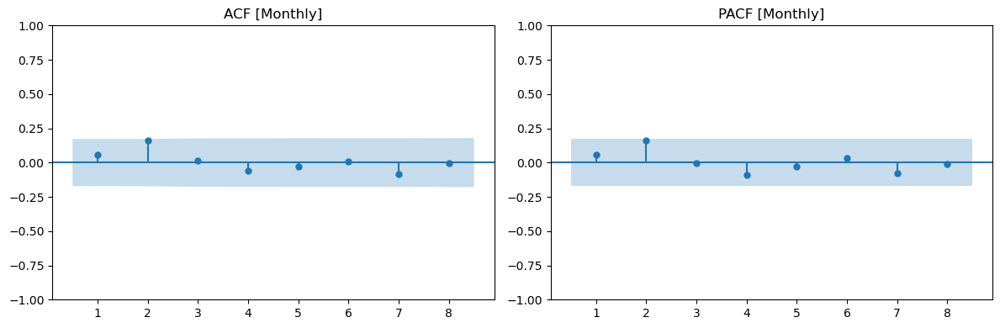

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  4.501770   0.342338
8  5.613257   0.690462



In [19]:
# Daily residual
residual_diagnostics(df_dzu_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_dzu_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_dzu_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Fuzhou Plant

In [20]:
df_fzu_NASA = pd.read_csv('Huaneng_SO2/Huaneng_Fuzhou.csv')
df_fzu_NASA = cleaning_NASA_data(df_fzu_NASA,'SO2')
df_fzu_NASA

,date,SO2
0,2014-01-01,0.06
1,2014-01-04,1.74
2,2014-01-05,0.31
3,2014-01-13,2.15
4,2014-01-20,0.39
...,...,...
627,2025-06-10,0.72
628,2025-06-12,0.30
629,2025-06-14,0.29
630,2025-06-17,0.32


01:23:26 - cmdstanpy - INFO - Chain [1] start processing
01:23:26 - cmdstanpy - INFO - Chain [1] done processing
01:23:27 - cmdstanpy - INFO - Chain [1] start processing
01:23:27 - cmdstanpy - INFO - Chain [1] done processing
01:23:27 - cmdstanpy - INFO - Chain [1] start processing
01:23:27 - cmdstanpy - INFO - Chain [1] done processing
01:23:27 - cmdstanpy - INFO - Chain [1] start processing
01:23:27 - cmdstanpy - INFO - Chain [1] done processing
01:23:27 - cmdstanpy - INFO - Chain [1] start processing
01:23:27 - cmdstanpy - INFO - Chain [1] done processing
01:23:27 - cmdstanpy - INFO - Chain [1] start processing
01:23:27 - cmdstanpy - INFO - Chain [1] done processing
01:23:27 - cmdstanpy - INFO - Chain [1] start processing
01:23:28 - cmdstanpy - INFO - Chain [1] done processing
01:23:28 - cmdstanpy - INFO - Chain [1] start processing
01:23:28 - cmdstanpy - INFO - Chain [1] done processing
01:23:28 - cmdstanpy - INFO - Chain [1] start processing
01:23:28 - cmdstanpy - INFO - Chain [1]

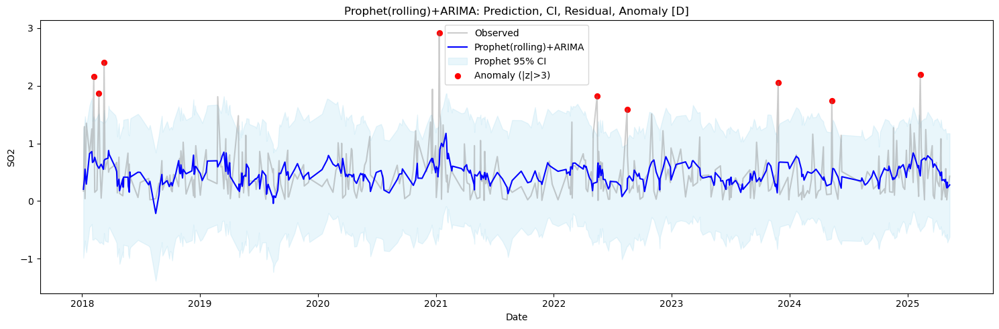

01:23:31 - cmdstanpy - INFO - Chain [1] start processing
01:23:31 - cmdstanpy - INFO - Chain [1] done processing
01:23:31 - cmdstanpy - INFO - Chain [1] start processing
01:23:31 - cmdstanpy - INFO - Chain [1] done processing
01:23:31 - cmdstanpy - INFO - Chain [1] start processing
01:23:31 - cmdstanpy - INFO - Chain [1] done processing
01:23:32 - cmdstanpy - INFO - Chain [1] start processing
01:23:32 - cmdstanpy - INFO - Chain [1] done processing
01:23:32 - cmdstanpy - INFO - Chain [1] start processing
01:23:32 - cmdstanpy - INFO - Chain [1] done processing
01:23:32 - cmdstanpy - INFO - Chain [1] start processing
01:23:32 - cmdstanpy - INFO - Chain [1] done processing
01:23:32 - cmdstanpy - INFO - Chain [1] start processing
01:23:32 - cmdstanpy - INFO - Chain [1] done processing
01:23:33 - cmdstanpy - INFO - Chain [1] start processing
01:23:33 - cmdstanpy - INFO - Chain [1] done processing
01:23:33 - cmdstanpy - INFO - Chain [1] start processing
01:23:33 - cmdstanpy - INFO - Chain [1]

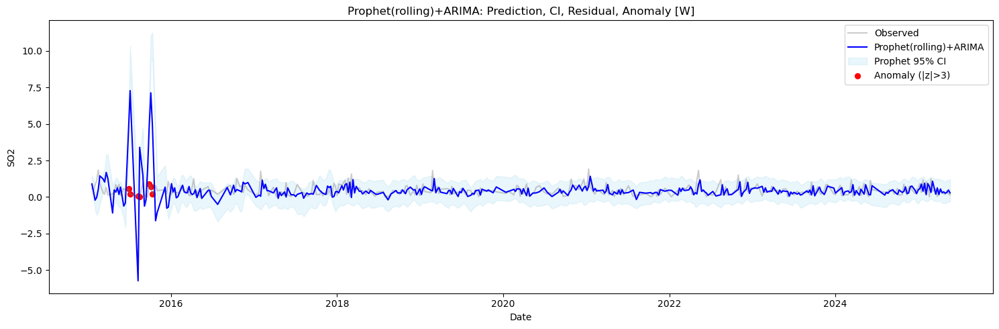

01:23:49 - cmdstanpy - INFO - Chain [1] start processing
01:23:49 - cmdstanpy - INFO - Chain [1] done processing
01:23:49 - cmdstanpy - INFO - Chain [1] start processing
01:23:49 - cmdstanpy - INFO - Chain [1] done processing
01:23:49 - cmdstanpy - INFO - Chain [1] start processing
01:23:53 - cmdstanpy - INFO - Chain [1] done processing
01:23:53 - cmdstanpy - INFO - Chain [1] start processing
01:23:57 - cmdstanpy - INFO - Chain [1] done processing
01:23:57 - cmdstanpy - INFO - Chain [1] start processing
01:23:59 - cmdstanpy - INFO - Chain [1] done processing
01:23:59 - cmdstanpy - INFO - Chain [1] start processing
01:23:59 - cmdstanpy - INFO - Chain [1] done processing
01:23:59 - cmdstanpy - INFO - Chain [1] start processing
01:24:06 - cmdstanpy - INFO - Chain [1] done processing
01:24:06 - cmdstanpy - INFO - Chain [1] start processing
01:24:12 - cmdstanpy - INFO - Chain [1] done processing
01:24:13 - cmdstanpy - INFO - Chain [1] start processing
01:24:14 - cmdstanpy - INFO - Chain [1]

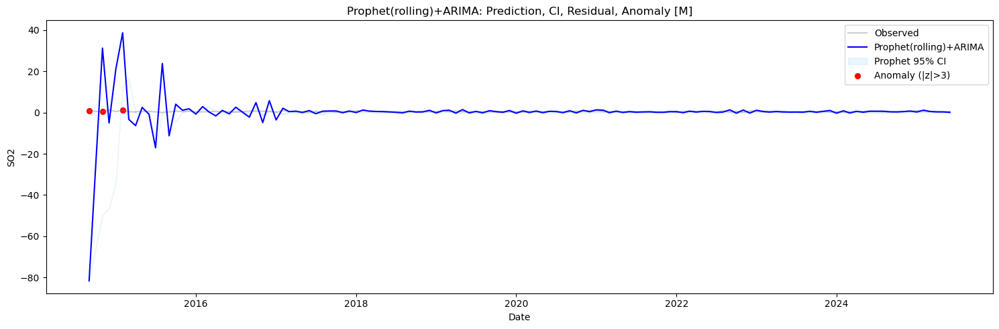

In [21]:
df_fzu_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_fzu_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=200, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_fzu_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_fzu_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=30, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_fzu_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_fzu_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=7, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

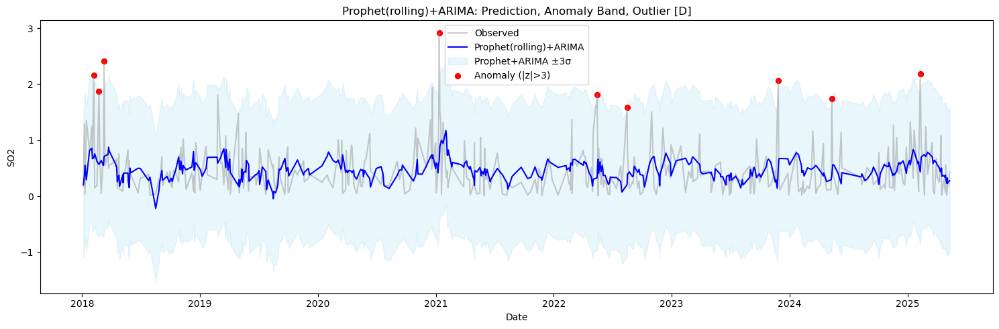

In [22]:
plot_arima_anomaly_band(df_fzu_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


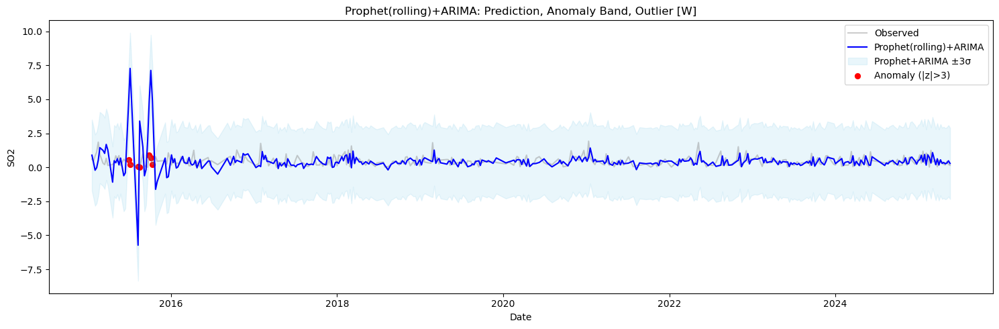

In [23]:
plot_arima_anomaly_band(df_fzu_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


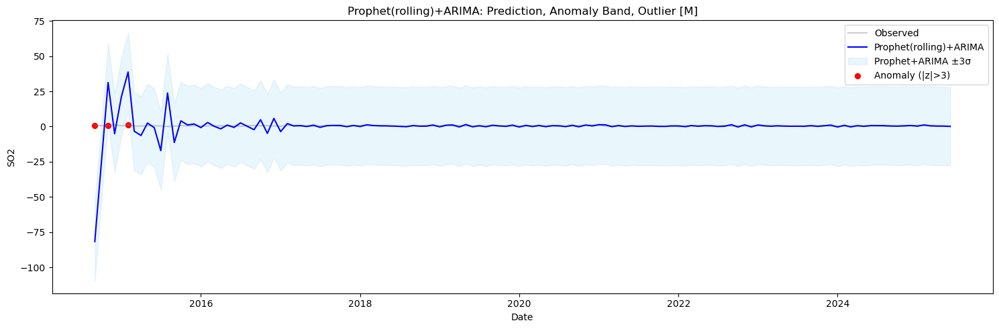

In [24]:
plot_arima_anomaly_band(df_fzu_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


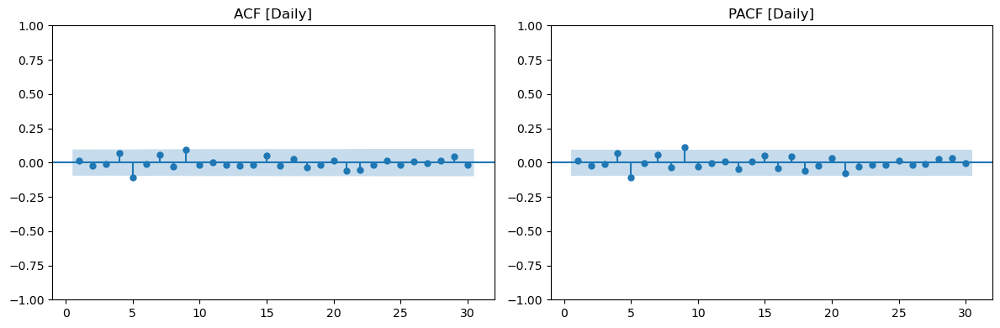

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  12.775570   0.236492
20  15.540279   0.744704
30  19.627347   0.925885



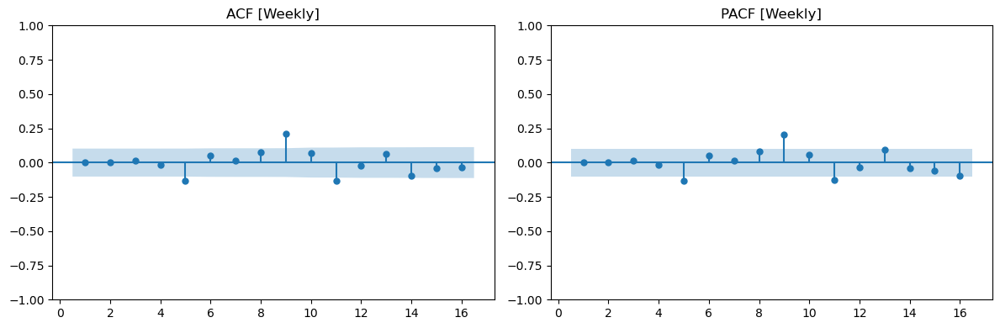

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   10.330386   0.242599
12  35.253507   0.000427
16  41.526452   0.000464



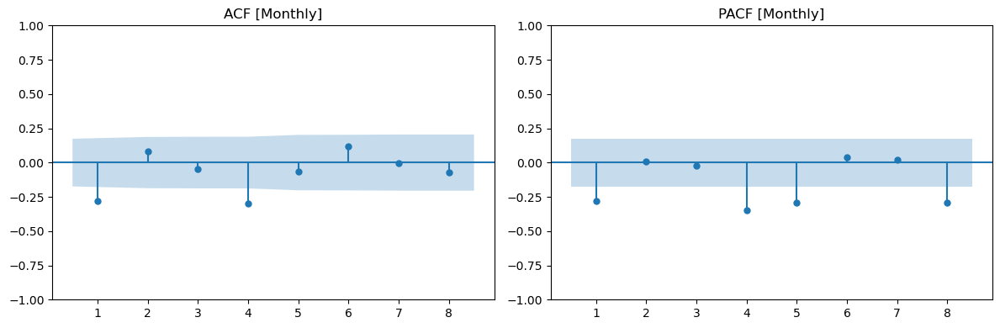

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  23.180918   0.000117
8  26.306491   0.000931



In [25]:
# Daily residual
residual_diagnostics(df_fzu_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_fzu_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_fzu_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Haimen Plant

In [26]:
df_hin_NASA = pd.read_csv('Huaneng_SO2/Huaneng_haimen.csv')
df_hin_NASA = cleaning_NASA_data(df_hin_NASA,'SO2')
df_hin_NASA

,date,SO2
0,2014-01-01,1.51
1,2014-01-04,0.64
2,2014-01-05,0.43
3,2014-01-11,0.09
4,2014-01-15,0.75
...,...,...
543,2025-06-10,0.68
544,2025-06-19,0.17
545,2025-06-20,0.05
546,2025-06-23,0.58


01:25:36 - cmdstanpy - INFO - Chain [1] start processing
01:25:36 - cmdstanpy - INFO - Chain [1] done processing
01:25:36 - cmdstanpy - INFO - Chain [1] start processing
01:25:36 - cmdstanpy - INFO - Chain [1] done processing
01:25:37 - cmdstanpy - INFO - Chain [1] start processing
01:25:37 - cmdstanpy - INFO - Chain [1] done processing
01:25:37 - cmdstanpy - INFO - Chain [1] start processing
01:25:37 - cmdstanpy - INFO - Chain [1] done processing
01:25:37 - cmdstanpy - INFO - Chain [1] start processing
01:25:37 - cmdstanpy - INFO - Chain [1] done processing
01:25:37 - cmdstanpy - INFO - Chain [1] start processing
01:25:37 - cmdstanpy - INFO - Chain [1] done processing
01:25:37 - cmdstanpy - INFO - Chain [1] start processing
01:25:37 - cmdstanpy - INFO - Chain [1] done processing
01:25:37 - cmdstanpy - INFO - Chain [1] start processing
01:25:37 - cmdstanpy - INFO - Chain [1] done processing
01:25:38 - cmdstanpy - INFO - Chain [1] start processing
01:25:38 - cmdstanpy - INFO - Chain [1]

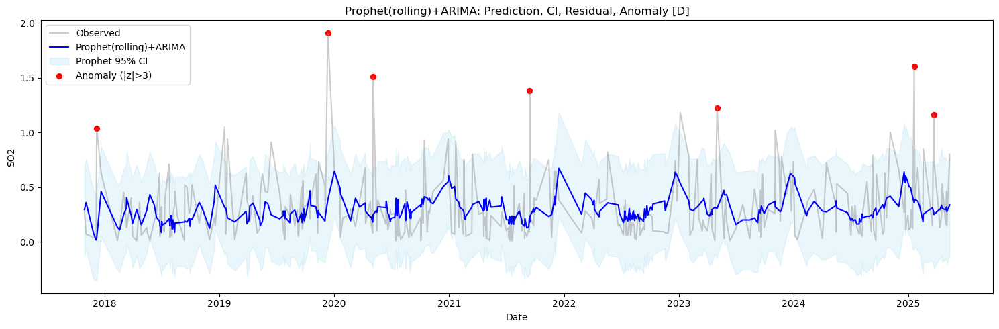

01:25:39 - cmdstanpy - INFO - Chain [1] start processing
01:25:39 - cmdstanpy - INFO - Chain [1] done processing
01:25:39 - cmdstanpy - INFO - Chain [1] start processing
01:25:39 - cmdstanpy - INFO - Chain [1] done processing
01:25:40 - cmdstanpy - INFO - Chain [1] start processing
01:25:40 - cmdstanpy - INFO - Chain [1] done processing
01:25:40 - cmdstanpy - INFO - Chain [1] start processing
01:25:40 - cmdstanpy - INFO - Chain [1] done processing
01:25:40 - cmdstanpy - INFO - Chain [1] start processing
01:25:40 - cmdstanpy - INFO - Chain [1] done processing
01:25:40 - cmdstanpy - INFO - Chain [1] start processing
01:25:40 - cmdstanpy - INFO - Chain [1] done processing
01:25:40 - cmdstanpy - INFO - Chain [1] start processing
01:25:41 - cmdstanpy - INFO - Chain [1] done processing
01:25:41 - cmdstanpy - INFO - Chain [1] start processing
01:25:41 - cmdstanpy - INFO - Chain [1] done processing
01:25:41 - cmdstanpy - INFO - Chain [1] start processing
01:25:41 - cmdstanpy - INFO - Chain [1]

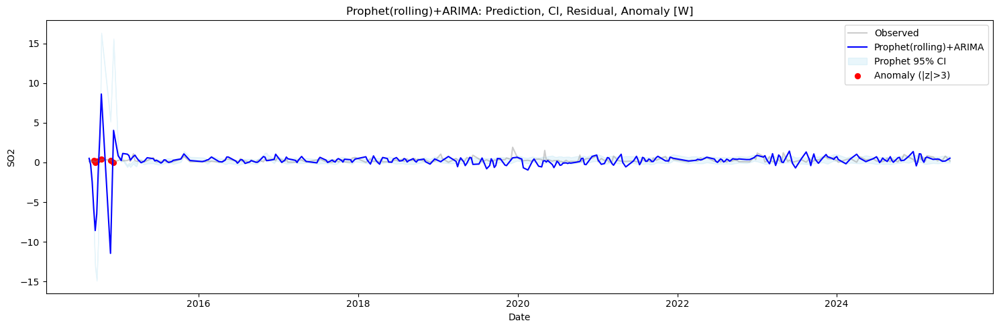

01:25:59 - cmdstanpy - INFO - Chain [1] start processing
01:25:59 - cmdstanpy - INFO - Chain [1] done processing
01:25:59 - cmdstanpy - INFO - Chain [1] start processing
01:25:59 - cmdstanpy - INFO - Chain [1] done processing
01:25:59 - cmdstanpy - INFO - Chain [1] start processing
01:26:00 - cmdstanpy - INFO - Chain [1] done processing
01:26:00 - cmdstanpy - INFO - Chain [1] start processing
01:26:00 - cmdstanpy - INFO - Chain [1] done processing
01:26:00 - cmdstanpy - INFO - Chain [1] start processing
01:26:05 - cmdstanpy - INFO - Chain [1] done processing
01:26:05 - cmdstanpy - INFO - Chain [1] start processing
01:26:05 - cmdstanpy - INFO - Chain [1] done processing
01:26:05 - cmdstanpy - INFO - Chain [1] start processing
01:26:06 - cmdstanpy - INFO - Chain [1] done processing
01:26:06 - cmdstanpy - INFO - Chain [1] start processing
01:26:11 - cmdstanpy - INFO - Chain [1] done processing
01:26:11 - cmdstanpy - INFO - Chain [1] start processing
01:26:18 - cmdstanpy - INFO - Chain [1]

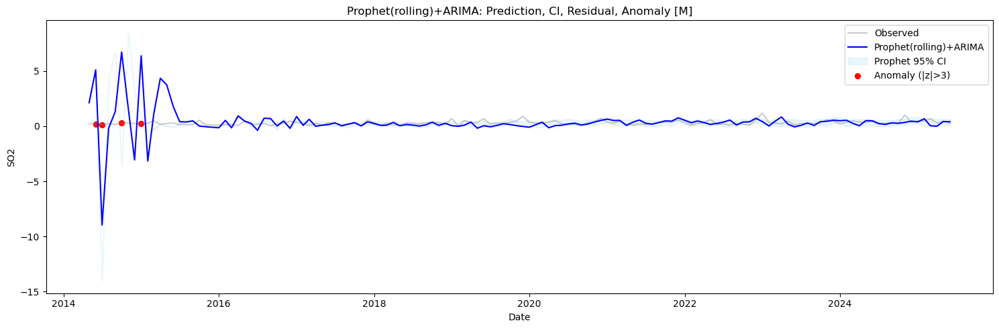

In [27]:
df_hin_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_hin_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=180, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_hin_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_hin_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=24, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_hin_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_hin_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=4, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

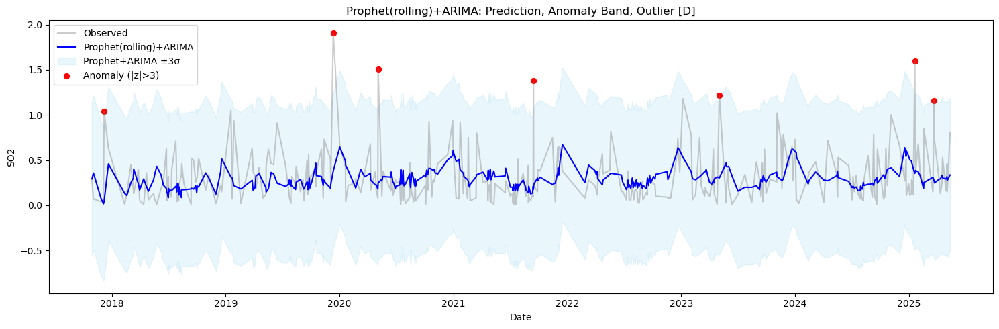

In [28]:
plot_arima_anomaly_band(df_hin_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


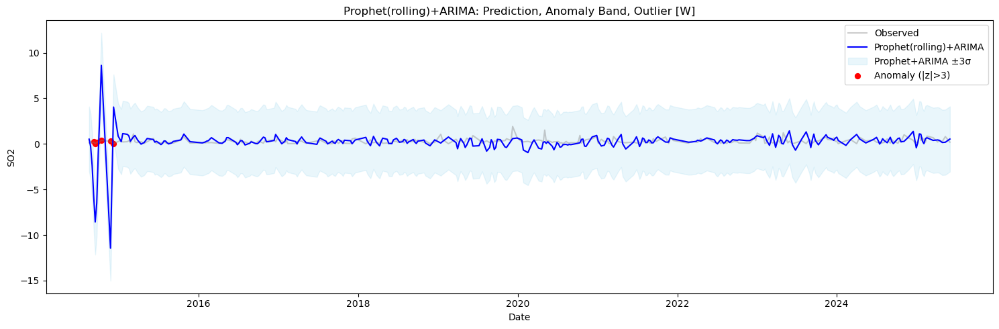

In [29]:
plot_arima_anomaly_band(df_hin_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


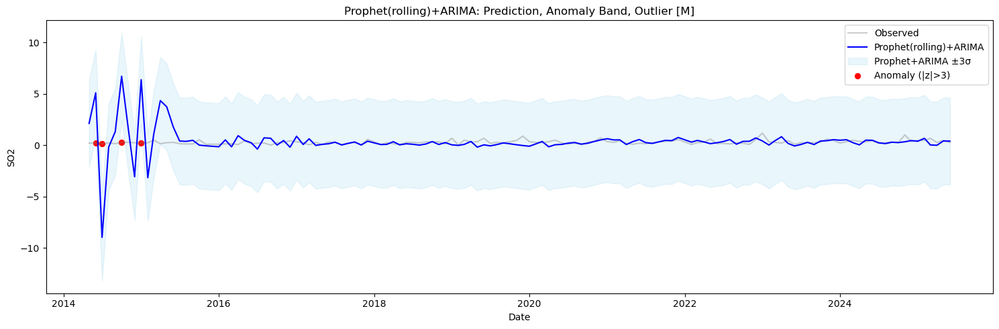

In [30]:
plot_arima_anomaly_band(df_hin_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


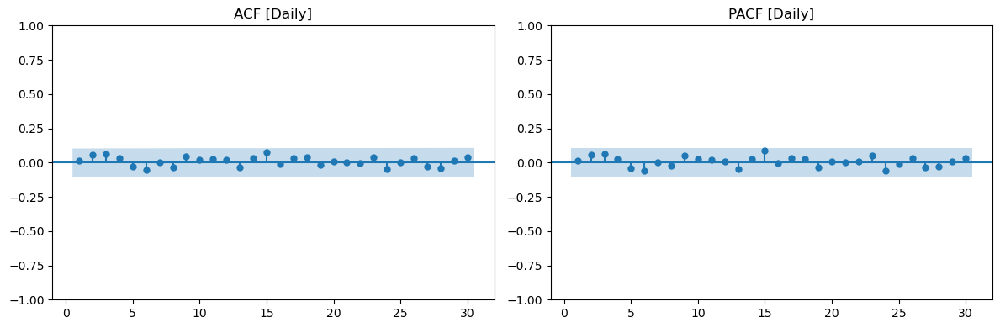

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   5.902952   0.823350
20  10.733001   0.952855
30  14.295035   0.993156



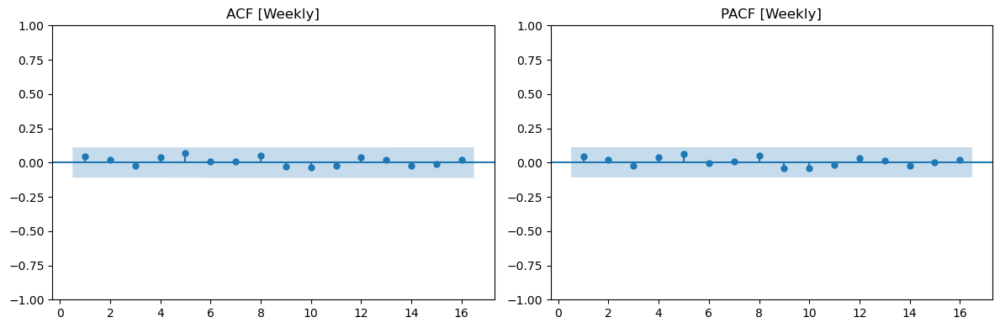

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
     lb_stat  lb_pvalue
8   3.701851   0.882972
12  5.051229   0.956246
16  5.551734   0.992255



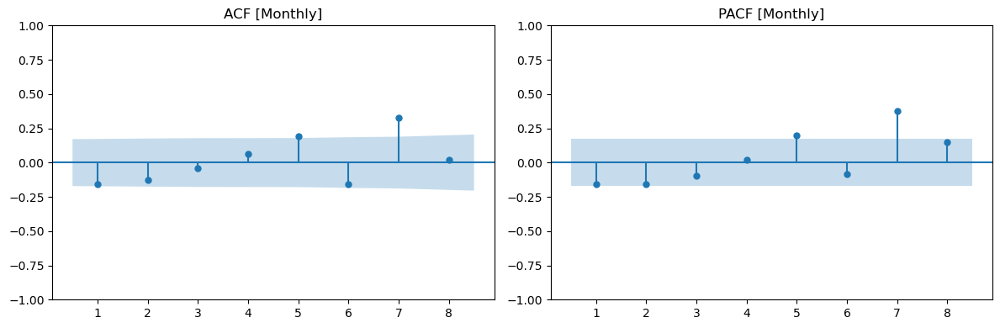

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4   6.283341   0.178964
8  29.805986   0.000229



In [31]:
# Daily residual
residual_diagnostics(df_hin_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_hin_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_hin_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Jinling Plant

In [32]:
df_jlg_NASA = pd.read_csv('Huaneng_SO2/Huaneng_jinling.csv')
df_jlg_NASA = cleaning_NASA_data(df_jlg_NASA,'SO2')
df_jlg_NASA

,date,SO2
0,2014-01-01,1.746684e+16
1,2014-01-05,2.941195e+16
2,2014-01-06,3.517075e+16
3,2014-01-10,2.398867e+16
4,2014-01-12,1.853906e+16
...,...,...
1422,2025-06-25,7.807139e+15
1423,2025-06-26,1.887745e+15
1424,2025-06-27,8.113831e+15
1425,2025-06-29,9.142588e+15


01:28:02 - cmdstanpy - INFO - Chain [1] start processing
01:28:02 - cmdstanpy - INFO - Chain [1] done processing
01:28:02 - cmdstanpy - INFO - Chain [1] start processing
01:28:02 - cmdstanpy - INFO - Chain [1] done processing
01:28:03 - cmdstanpy - INFO - Chain [1] start processing
01:28:03 - cmdstanpy - INFO - Chain [1] done processing
01:28:03 - cmdstanpy - INFO - Chain [1] start processing
01:28:03 - cmdstanpy - INFO - Chain [1] done processing
01:28:03 - cmdstanpy - INFO - Chain [1] start processing
01:28:03 - cmdstanpy - INFO - Chain [1] done processing
01:28:03 - cmdstanpy - INFO - Chain [1] start processing
01:28:03 - cmdstanpy - INFO - Chain [1] done processing
01:28:03 - cmdstanpy - INFO - Chain [1] start processing
01:28:03 - cmdstanpy - INFO - Chain [1] done processing
01:28:04 - cmdstanpy - INFO - Chain [1] start processing
01:28:04 - cmdstanpy - INFO - Chain [1] done processing
01:28:04 - cmdstanpy - INFO - Chain [1] start processing
01:28:04 - cmdstanpy - INFO - Chain [1]

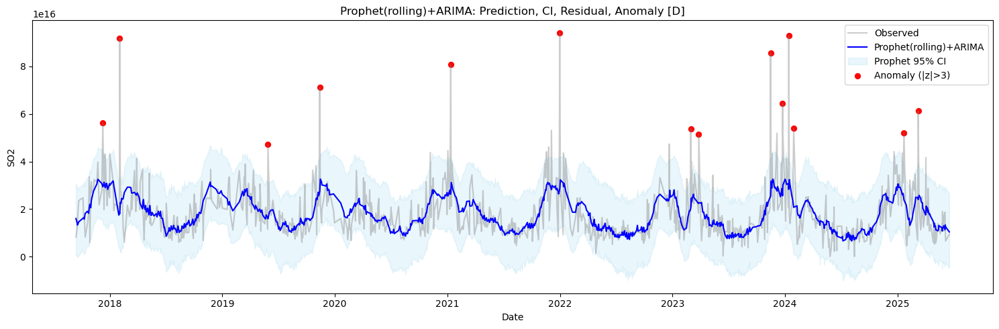

01:28:11 - cmdstanpy - INFO - Chain [1] start processing
01:28:12 - cmdstanpy - INFO - Chain [1] done processing
01:28:12 - cmdstanpy - INFO - Chain [1] start processing
01:28:12 - cmdstanpy - INFO - Chain [1] done processing
01:28:12 - cmdstanpy - INFO - Chain [1] start processing
01:28:13 - cmdstanpy - INFO - Chain [1] done processing
01:28:13 - cmdstanpy - INFO - Chain [1] start processing
01:28:13 - cmdstanpy - INFO - Chain [1] done processing
01:28:13 - cmdstanpy - INFO - Chain [1] start processing
01:28:13 - cmdstanpy - INFO - Chain [1] done processing
01:28:13 - cmdstanpy - INFO - Chain [1] start processing
01:28:14 - cmdstanpy - INFO - Chain [1] done processing
01:28:14 - cmdstanpy - INFO - Chain [1] start processing
01:28:14 - cmdstanpy - INFO - Chain [1] done processing
01:28:14 - cmdstanpy - INFO - Chain [1] start processing
01:28:14 - cmdstanpy - INFO - Chain [1] done processing
01:28:15 - cmdstanpy - INFO - Chain [1] start processing
01:28:15 - cmdstanpy - INFO - Chain [1]

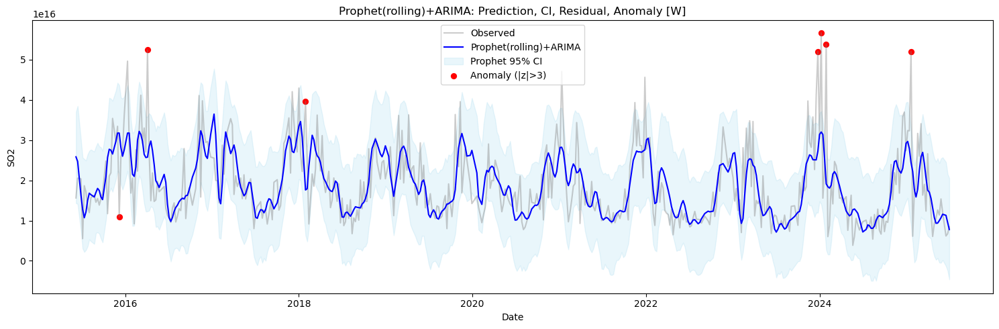

01:28:36 - cmdstanpy - INFO - Chain [1] start processing
01:28:43 - cmdstanpy - INFO - Chain [1] done processing
01:28:44 - cmdstanpy - INFO - Chain [1] start processing
01:28:51 - cmdstanpy - INFO - Chain [1] done processing
01:28:51 - cmdstanpy - INFO - Chain [1] start processing
01:28:51 - cmdstanpy - INFO - Chain [1] done processing
01:28:52 - cmdstanpy - INFO - Chain [1] start processing
01:29:00 - cmdstanpy - INFO - Chain [1] done processing
01:29:00 - cmdstanpy - INFO - Chain [1] start processing
01:29:09 - cmdstanpy - INFO - Chain [1] done processing
01:29:09 - cmdstanpy - INFO - Chain [1] start processing
01:29:10 - cmdstanpy - INFO - Chain [1] done processing
01:29:10 - cmdstanpy - INFO - Chain [1] start processing
01:29:10 - cmdstanpy - INFO - Chain [1] done processing
01:29:11 - cmdstanpy - INFO - Chain [1] start processing
01:29:21 - cmdstanpy - INFO - Chain [1] done processing
01:29:21 - cmdstanpy - INFO - Chain [1] start processing
01:29:31 - cmdstanpy - INFO - Chain [1]

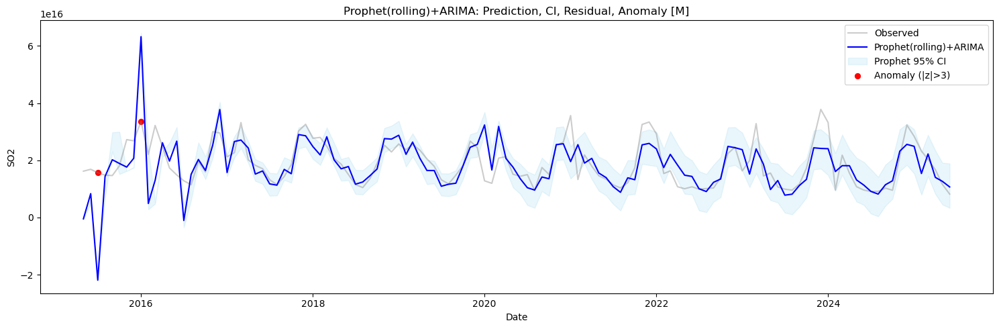

In [33]:
df_jlg_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_jlg_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=430, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_jlg_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_jlg_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=66, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_jlg_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_jlg_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=16, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

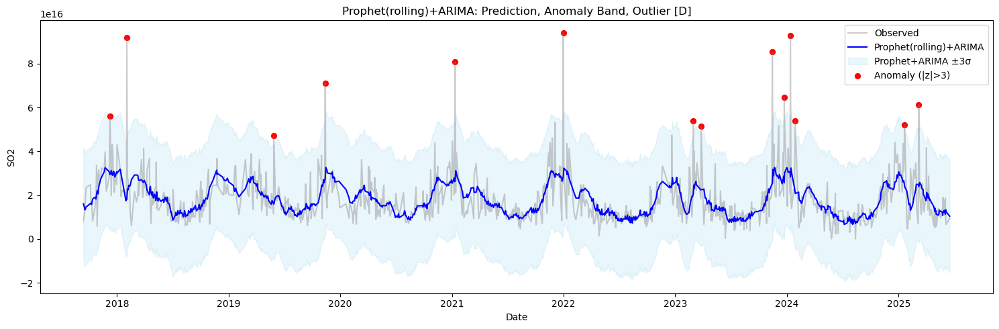

In [34]:
plot_arima_anomaly_band(df_jlg_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


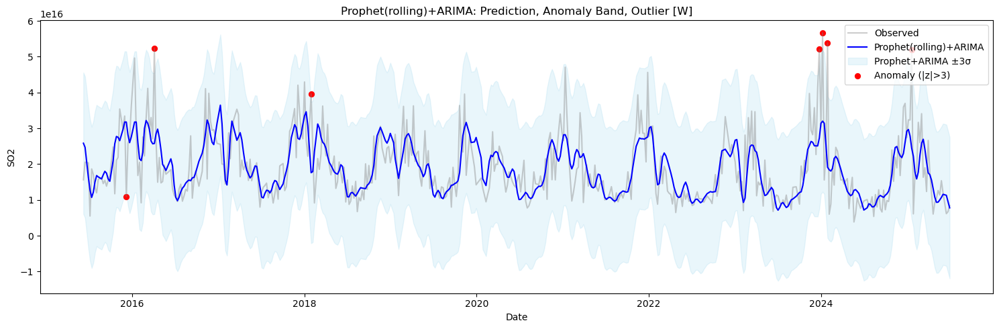

In [35]:
plot_arima_anomaly_band(df_jlg_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


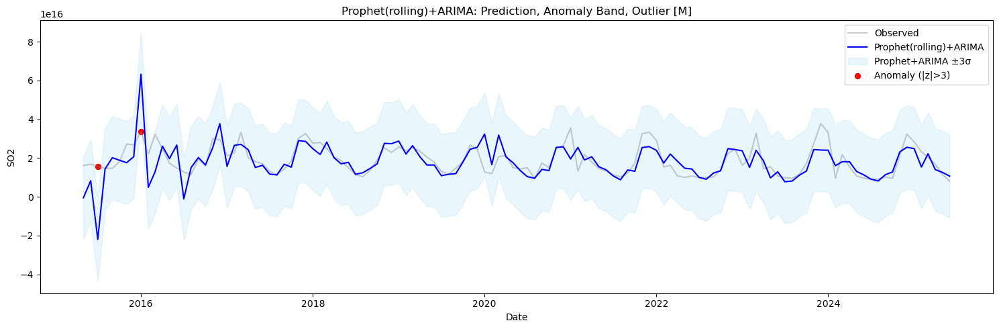

In [36]:
plot_arima_anomaly_band(df_jlg_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


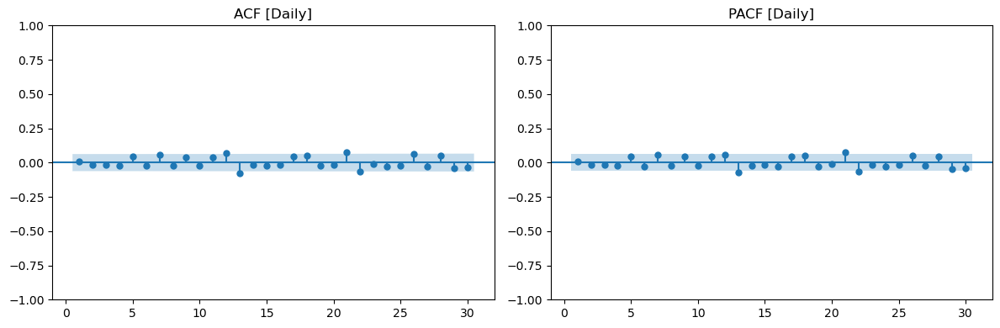

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   9.846566   0.454056
20  28.397335   0.100322
30  50.930221   0.009908



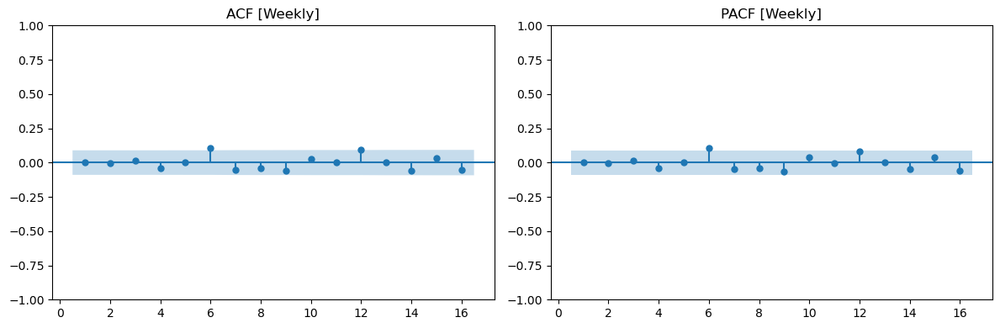

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8    8.720595   0.366412
12  15.220507   0.229599
16  18.758148   0.281404



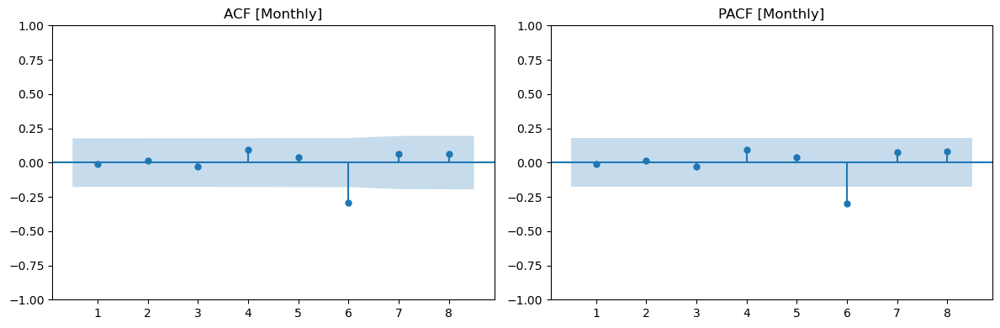

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4   1.245701   0.870518
8  13.744421   0.088675



In [37]:
# Daily residual
residual_diagnostics(df_jlg_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_jlg_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_jlg_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Laiwu Plant

In [38]:
df_laiwu_NASA = pd.read_csv('Huaneng_SO2/Huaneng_laiwu.csv')
df_laiwu_NASA = cleaning_NASA_data(df_laiwu_NASA,'SO2')
df_laiwu_NASA

,date,SO2
0,2014-01-06,0.454787
1,2014-01-14,1.268637
2,2014-01-15,0.275131
3,2014-01-19,0.860000
4,2014-01-20,0.340186
...,...,...
558,2025-05-30,0.280000
559,2025-06-03,0.347572
560,2025-06-04,0.070124
561,2025-06-18,0.170000


01:30:02 - cmdstanpy - INFO - Chain [1] start processing
01:30:02 - cmdstanpy - INFO - Chain [1] done processing
01:30:02 - cmdstanpy - INFO - Chain [1] start processing
01:30:02 - cmdstanpy - INFO - Chain [1] done processing
01:30:02 - cmdstanpy - INFO - Chain [1] start processing
01:30:02 - cmdstanpy - INFO - Chain [1] done processing
01:30:02 - cmdstanpy - INFO - Chain [1] start processing
01:30:02 - cmdstanpy - INFO - Chain [1] done processing
01:30:03 - cmdstanpy - INFO - Chain [1] start processing
01:30:03 - cmdstanpy - INFO - Chain [1] done processing
01:30:03 - cmdstanpy - INFO - Chain [1] start processing
01:30:03 - cmdstanpy - INFO - Chain [1] done processing
01:30:03 - cmdstanpy - INFO - Chain [1] start processing
01:30:03 - cmdstanpy - INFO - Chain [1] done processing
01:30:03 - cmdstanpy - INFO - Chain [1] start processing
01:30:03 - cmdstanpy - INFO - Chain [1] done processing
01:30:03 - cmdstanpy - INFO - Chain [1] start processing
01:30:03 - cmdstanpy - INFO - Chain [1]

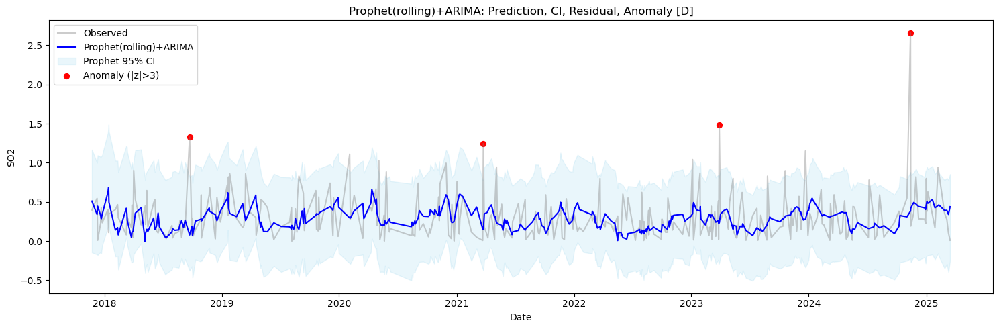

01:30:06 - cmdstanpy - INFO - Chain [1] start processing
01:30:06 - cmdstanpy - INFO - Chain [1] done processing
01:30:06 - cmdstanpy - INFO - Chain [1] start processing
01:30:07 - cmdstanpy - INFO - Chain [1] done processing
01:30:07 - cmdstanpy - INFO - Chain [1] start processing
01:30:07 - cmdstanpy - INFO - Chain [1] done processing
01:30:07 - cmdstanpy - INFO - Chain [1] start processing
01:30:07 - cmdstanpy - INFO - Chain [1] done processing
01:30:07 - cmdstanpy - INFO - Chain [1] start processing
01:30:07 - cmdstanpy - INFO - Chain [1] done processing
01:30:08 - cmdstanpy - INFO - Chain [1] start processing
01:30:08 - cmdstanpy - INFO - Chain [1] done processing
01:30:08 - cmdstanpy - INFO - Chain [1] start processing
01:30:08 - cmdstanpy - INFO - Chain [1] done processing
01:30:08 - cmdstanpy - INFO - Chain [1] start processing
01:30:08 - cmdstanpy - INFO - Chain [1] done processing
01:30:08 - cmdstanpy - INFO - Chain [1] start processing
01:30:09 - cmdstanpy - INFO - Chain [1]

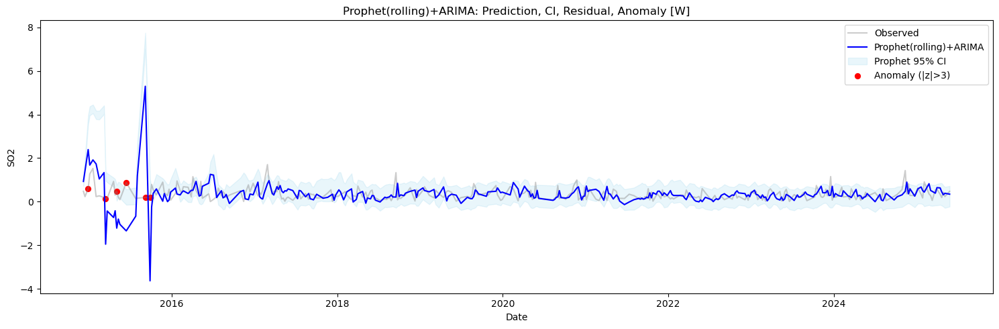

01:30:26 - cmdstanpy - INFO - Chain [1] start processing
01:30:26 - cmdstanpy - INFO - Chain [1] done processing
01:30:27 - cmdstanpy - INFO - Chain [1] start processing
01:30:27 - cmdstanpy - INFO - Chain [1] done processing
01:30:27 - cmdstanpy - INFO - Chain [1] start processing
01:30:27 - cmdstanpy - INFO - Chain [1] done processing
01:30:27 - cmdstanpy - INFO - Chain [1] start processing
01:30:28 - cmdstanpy - INFO - Chain [1] done processing
01:30:28 - cmdstanpy - INFO - Chain [1] start processing
01:30:29 - cmdstanpy - INFO - Chain [1] done processing
01:30:30 - cmdstanpy - INFO - Chain [1] start processing
01:30:30 - cmdstanpy - INFO - Chain [1] done processing
01:30:30 - cmdstanpy - INFO - Chain [1] start processing
01:30:31 - cmdstanpy - INFO - Chain [1] done processing
01:30:31 - cmdstanpy - INFO - Chain [1] start processing
01:30:31 - cmdstanpy - INFO - Chain [1] done processing
01:30:31 - cmdstanpy - INFO - Chain [1] start processing
01:30:38 - cmdstanpy - INFO - Chain [1]

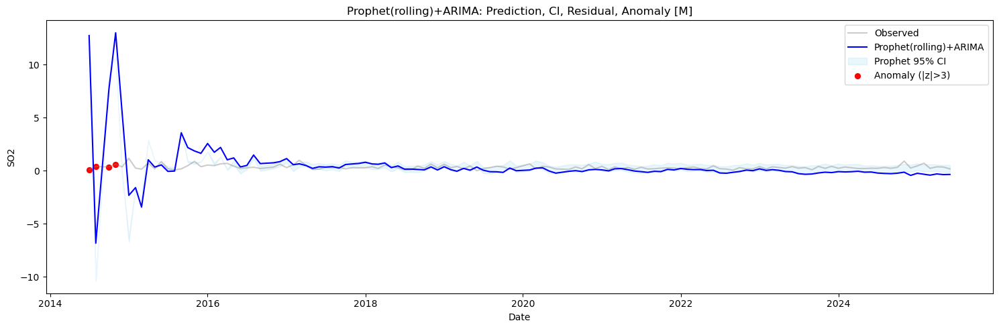

In [39]:
df_laiwu_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_laiwu_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=180, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_laiwu_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_laiwu_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=27, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_laiwu_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_laiwu_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=6, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

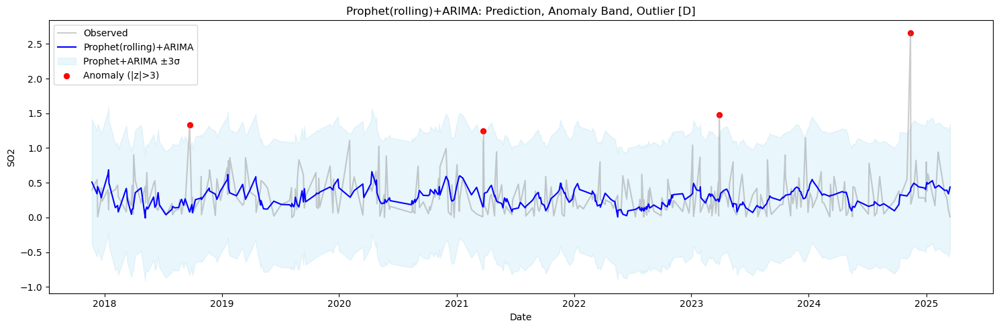

In [40]:
plot_arima_anomaly_band(df_laiwu_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


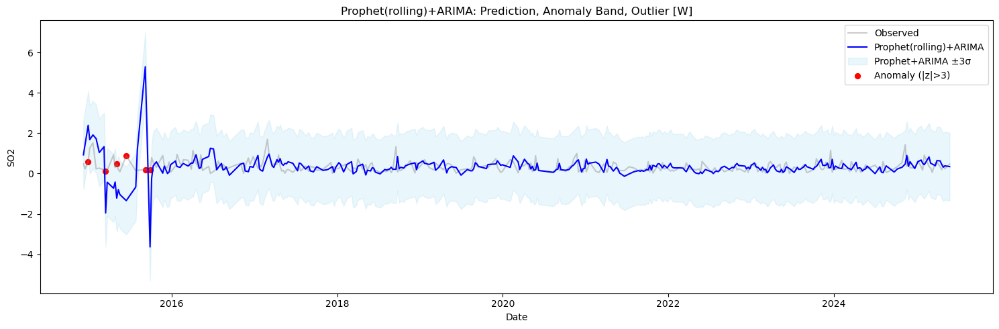

In [41]:
plot_arima_anomaly_band(df_laiwu_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


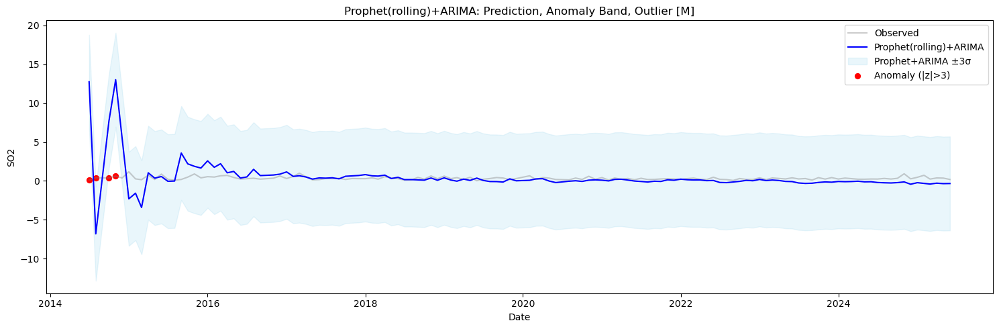

In [42]:
plot_arima_anomaly_band(df_laiwu_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


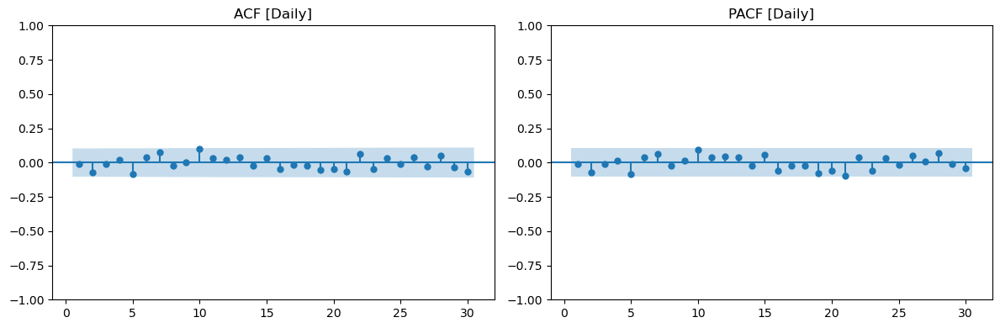

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  11.292314   0.335202
20  16.027651   0.714907
30  24.731335   0.737980



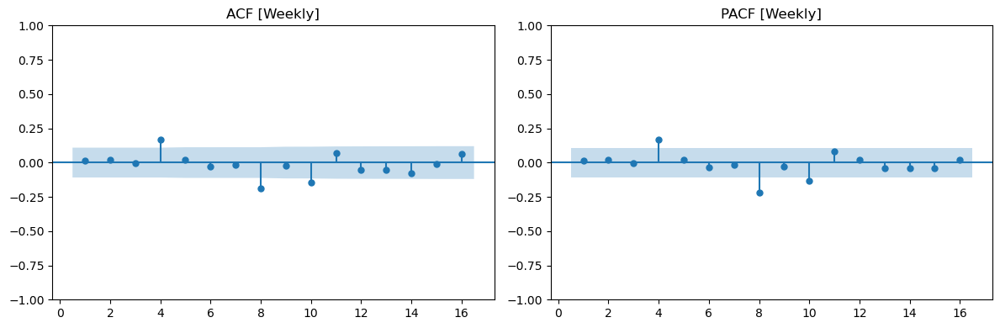

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   21.681577   0.005541
12  31.316601   0.001762
16  35.765238   0.003119



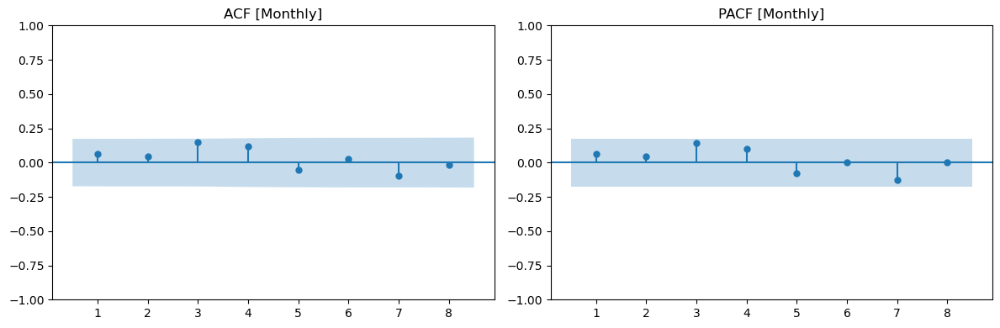

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  5.504732   0.239314
8  7.213192   0.513815



In [43]:
# Daily residual
residual_diagnostics(df_laiwu_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_laiwu_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_laiwu_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Luohuang

In [44]:
df_lhg_NASA = pd.read_csv('Huaneng_SO2/Huaneng_luohuang.csv')
df_lhg_NASA = cleaning_NASA_data(df_lhg_NASA,'SO2')
df_lhg_NASA

,date,SO2
0,2014-01-01,0.905755
1,2014-01-05,0.570000
2,2014-01-13,0.757161
3,2014-01-15,1.052236
4,2014-01-19,1.440195
...,...,...
691,2025-06-14,0.120000
692,2025-06-15,0.026580
693,2025-06-17,0.016148
694,2025-06-22,0.379179


01:32:09 - cmdstanpy - INFO - Chain [1] start processing
01:32:09 - cmdstanpy - INFO - Chain [1] done processing
01:32:09 - cmdstanpy - INFO - Chain [1] start processing
01:32:09 - cmdstanpy - INFO - Chain [1] done processing
01:32:09 - cmdstanpy - INFO - Chain [1] start processing
01:32:09 - cmdstanpy - INFO - Chain [1] done processing
01:32:09 - cmdstanpy - INFO - Chain [1] start processing
01:32:09 - cmdstanpy - INFO - Chain [1] done processing
01:32:09 - cmdstanpy - INFO - Chain [1] start processing
01:32:09 - cmdstanpy - INFO - Chain [1] done processing
01:32:10 - cmdstanpy - INFO - Chain [1] start processing
01:32:10 - cmdstanpy - INFO - Chain [1] done processing
01:32:10 - cmdstanpy - INFO - Chain [1] start processing
01:32:10 - cmdstanpy - INFO - Chain [1] done processing
01:32:10 - cmdstanpy - INFO - Chain [1] start processing
01:32:10 - cmdstanpy - INFO - Chain [1] done processing
01:32:10 - cmdstanpy - INFO - Chain [1] start processing
01:32:10 - cmdstanpy - INFO - Chain [1]

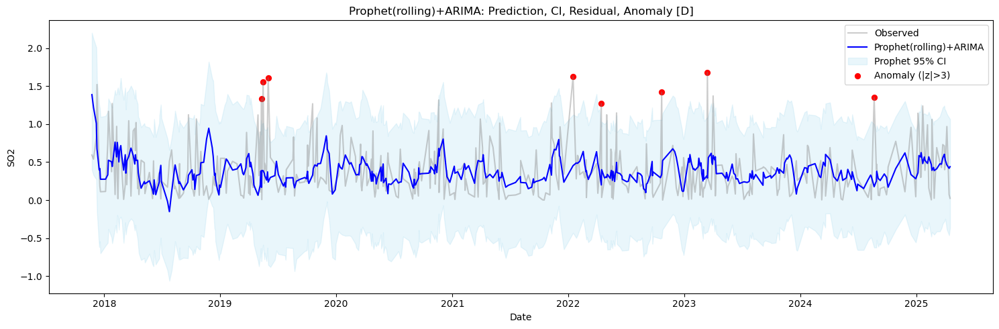

01:32:14 - cmdstanpy - INFO - Chain [1] start processing
01:32:14 - cmdstanpy - INFO - Chain [1] done processing
01:32:14 - cmdstanpy - INFO - Chain [1] start processing
01:32:14 - cmdstanpy - INFO - Chain [1] done processing
01:32:15 - cmdstanpy - INFO - Chain [1] start processing
01:32:15 - cmdstanpy - INFO - Chain [1] done processing
01:32:15 - cmdstanpy - INFO - Chain [1] start processing
01:32:15 - cmdstanpy - INFO - Chain [1] done processing
01:32:15 - cmdstanpy - INFO - Chain [1] start processing
01:32:15 - cmdstanpy - INFO - Chain [1] done processing
01:32:15 - cmdstanpy - INFO - Chain [1] start processing
01:32:16 - cmdstanpy - INFO - Chain [1] done processing
01:32:16 - cmdstanpy - INFO - Chain [1] start processing
01:32:16 - cmdstanpy - INFO - Chain [1] done processing
01:32:16 - cmdstanpy - INFO - Chain [1] start processing
01:32:16 - cmdstanpy - INFO - Chain [1] done processing
01:32:16 - cmdstanpy - INFO - Chain [1] start processing
01:32:16 - cmdstanpy - INFO - Chain [1]

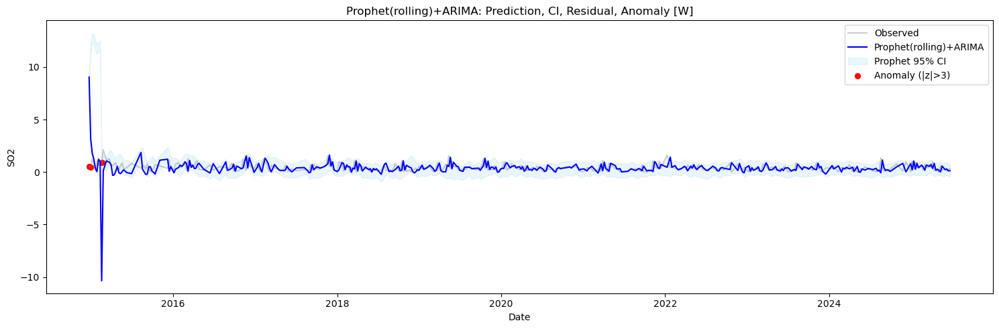

01:32:35 - cmdstanpy - INFO - Chain [1] start processing
01:32:35 - cmdstanpy - INFO - Chain [1] done processing
01:32:35 - cmdstanpy - INFO - Chain [1] start processing
01:32:39 - cmdstanpy - INFO - Chain [1] done processing
01:32:39 - cmdstanpy - INFO - Chain [1] start processing
01:32:39 - cmdstanpy - INFO - Chain [1] done processing
01:32:40 - cmdstanpy - INFO - Chain [1] start processing
01:32:42 - cmdstanpy - INFO - Chain [1] done processing
01:32:42 - cmdstanpy - INFO - Chain [1] start processing
01:32:43 - cmdstanpy - INFO - Chain [1] done processing
01:32:43 - cmdstanpy - INFO - Chain [1] start processing
01:32:49 - cmdstanpy - INFO - Chain [1] done processing
01:32:49 - cmdstanpy - INFO - Chain [1] start processing
01:32:49 - cmdstanpy - INFO - Chain [1] done processing
01:32:50 - cmdstanpy - INFO - Chain [1] start processing
01:32:50 - cmdstanpy - INFO - Chain [1] done processing
01:32:50 - cmdstanpy - INFO - Chain [1] start processing
01:32:57 - cmdstanpy - INFO - Chain [1]

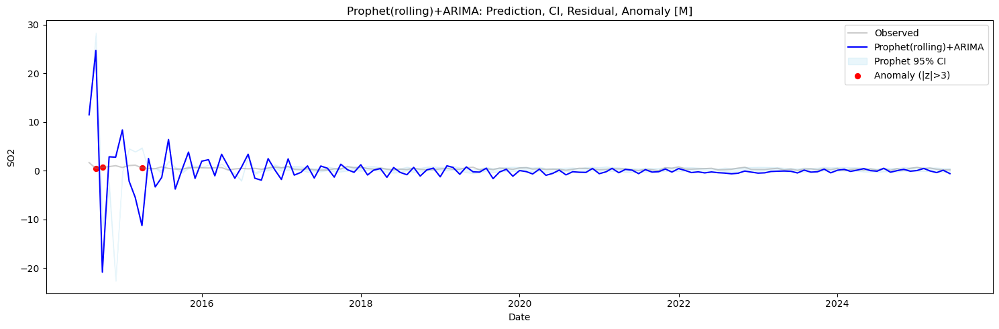

In [45]:
df_lhg_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_lhg_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=230, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_lhg_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_lhg_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=32, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_lhg_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_lhg_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=7, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

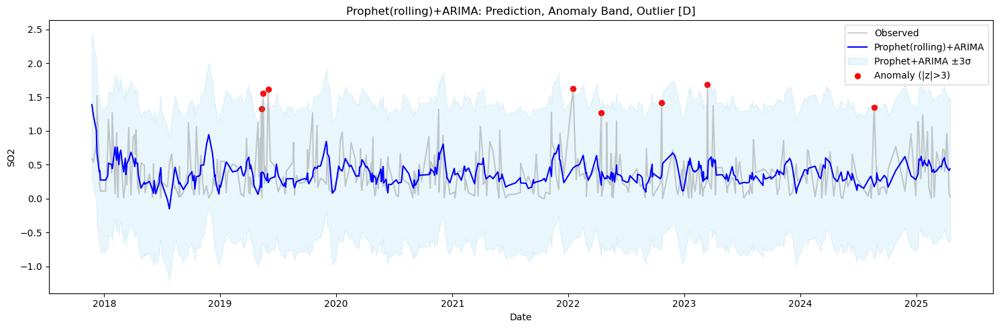

In [46]:
plot_arima_anomaly_band(df_lhg_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


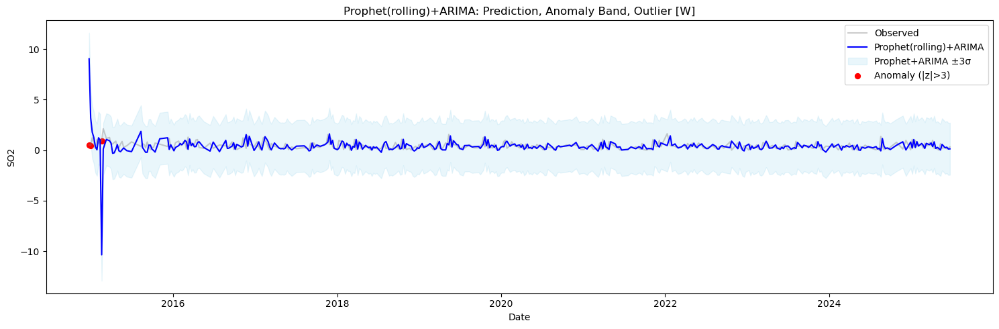

In [47]:
plot_arima_anomaly_band(df_lhg_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


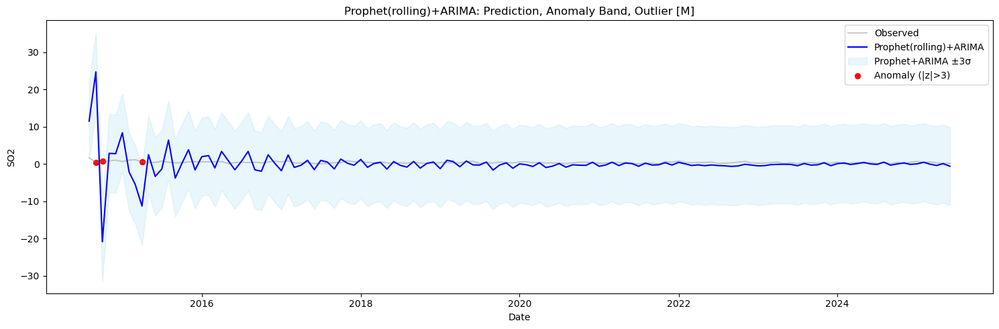

In [48]:
plot_arima_anomaly_band(df_lhg_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


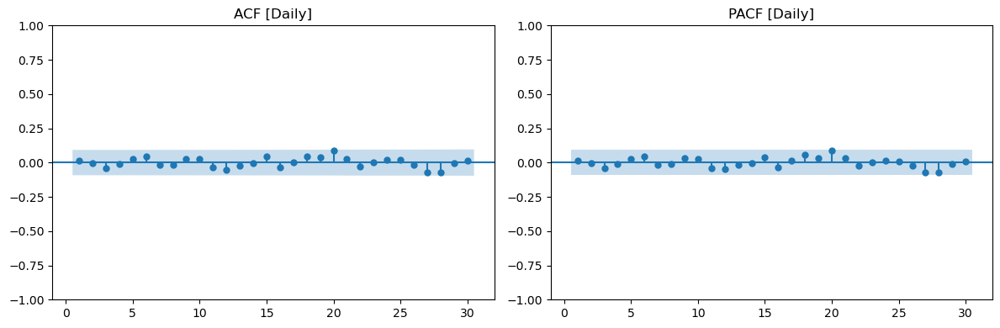

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   3.022987   0.980878
20  11.990374   0.916407
30  18.469224   0.950432



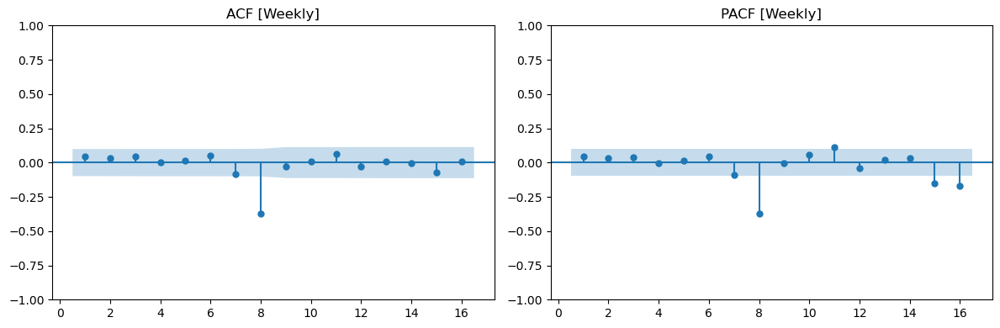

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   60.798235  3.249224e-10
12  62.966631  6.463320e-09
16  65.079676  7.137773e-08



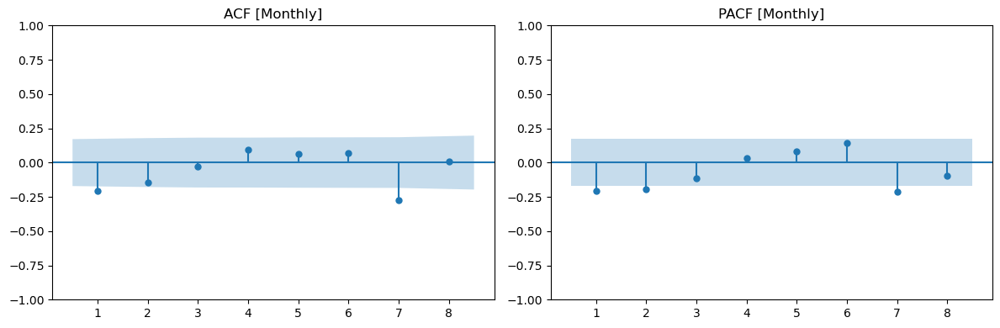

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  10.055552   0.039502
8  22.010859   0.004896



In [49]:
# Daily residual
residual_diagnostics(df_lhg_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_lhg_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_lhg_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Pingliang Plant

In [50]:
df_pgg_NASA = pd.read_csv('Huaneng_SO2/Huaneng_pingliang.csv')
df_pgg_NASA = cleaning_NASA_data(df_pgg_NASA,'SO2')
df_pgg_NASA

,date,SO2
0,2014-01-03,1.59
1,2014-01-23,1.38
2,2014-01-29,1.13
3,2014-03-16,0.55
4,2014-03-17,0.75
...,...,...
247,2025-05-05,0.41
248,2025-05-12,0.06
249,2025-05-19,1.19
250,2025-05-20,0.68


01:34:35 - cmdstanpy - INFO - Chain [1] start processing
01:34:35 - cmdstanpy - INFO - Chain [1] done processing
01:34:35 - cmdstanpy - INFO - Chain [1] start processing
01:34:35 - cmdstanpy - INFO - Chain [1] done processing
01:34:36 - cmdstanpy - INFO - Chain [1] start processing
01:34:36 - cmdstanpy - INFO - Chain [1] done processing
01:34:36 - cmdstanpy - INFO - Chain [1] start processing
01:34:36 - cmdstanpy - INFO - Chain [1] done processing
01:34:36 - cmdstanpy - INFO - Chain [1] start processing
01:34:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Sehong\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Sehong\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Sehong\anaconda3\Lib\site-pa

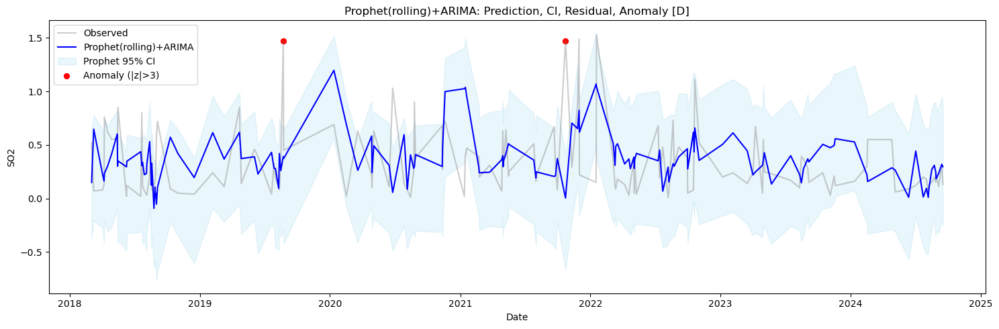

01:34:39 - cmdstanpy - INFO - Chain [1] start processing
01:34:47 - cmdstanpy - INFO - Chain [1] done processing
01:34:47 - cmdstanpy - INFO - Chain [1] start processing
01:34:48 - cmdstanpy - INFO - Chain [1] done processing
01:34:48 - cmdstanpy - INFO - Chain [1] start processing
01:34:59 - cmdstanpy - INFO - Chain [1] done processing
01:34:59 - cmdstanpy - INFO - Chain [1] start processing
01:34:59 - cmdstanpy - INFO - Chain [1] done processing
01:34:59 - cmdstanpy - INFO - Chain [1] start processing
01:34:59 - cmdstanpy - INFO - Chain [1] done processing
01:34:59 - cmdstanpy - INFO - Chain [1] start processing
01:34:59 - cmdstanpy - INFO - Chain [1] done processing
01:35:00 - cmdstanpy - INFO - Chain [1] start processing
01:35:00 - cmdstanpy - INFO - Chain [1] done processing
01:35:00 - cmdstanpy - INFO - Chain [1] start processing
01:35:00 - cmdstanpy - INFO - Chain [1] done processing
01:35:00 - cmdstanpy - INFO - Chain [1] start processing
01:35:00 - cmdstanpy - INFO - Chain [1]

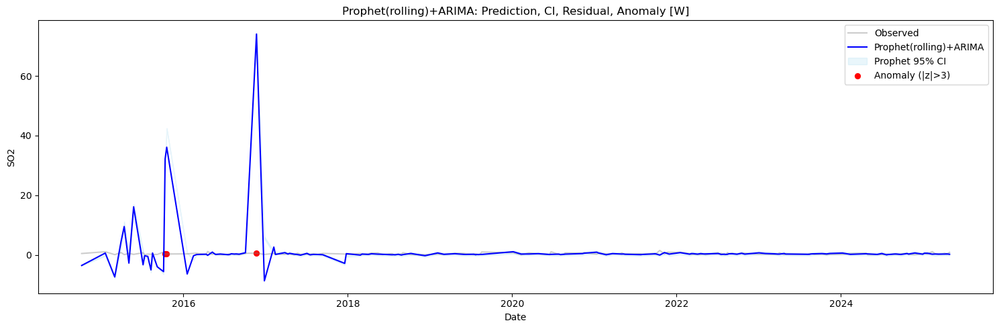

01:35:09 - cmdstanpy - INFO - Chain [1] start processing
01:35:09 - cmdstanpy - INFO - Chain [1] done processing
01:35:09 - cmdstanpy - INFO - Chain [1] start processing
01:35:09 - cmdstanpy - INFO - Chain [1] done processing
01:35:09 - cmdstanpy - INFO - Chain [1] start processing
01:35:09 - cmdstanpy - INFO - Chain [1] done processing
01:35:09 - cmdstanpy - INFO - Chain [1] start processing
01:35:12 - cmdstanpy - INFO - Chain [1] done processing
01:35:12 - cmdstanpy - INFO - Chain [1] start processing
01:35:12 - cmdstanpy - INFO - Chain [1] done processing
01:35:12 - cmdstanpy - INFO - Chain [1] start processing
01:35:12 - cmdstanpy - INFO - Chain [1] done processing
01:35:12 - cmdstanpy - INFO - Chain [1] start processing
01:35:13 - cmdstanpy - INFO - Chain [1] done processing
01:35:13 - cmdstanpy - INFO - Chain [1] start processing
01:35:14 - cmdstanpy - INFO - Chain [1] done processing
01:35:14 - cmdstanpy - INFO - Chain [1] start processing
01:35:14 - cmdstanpy - INFO - Chain [1]

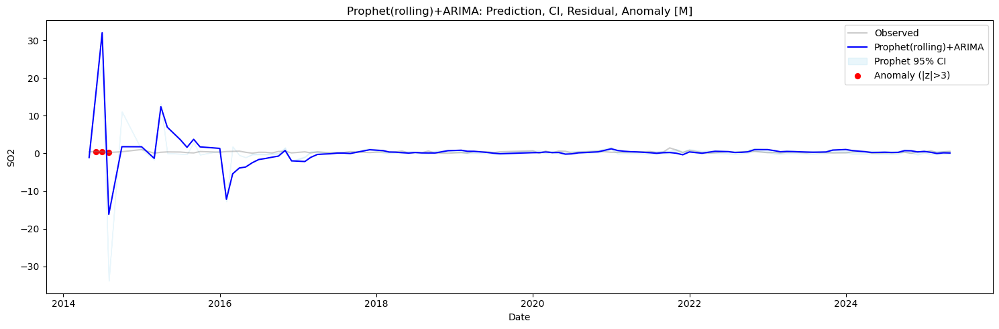

In [51]:
df_pgg_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_pgg_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=80, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_pgg_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_pgg_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=12, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_pgg_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_pgg_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=2, test_steps=1, step=1, z_thresh=3, freq='M', plot=True
)

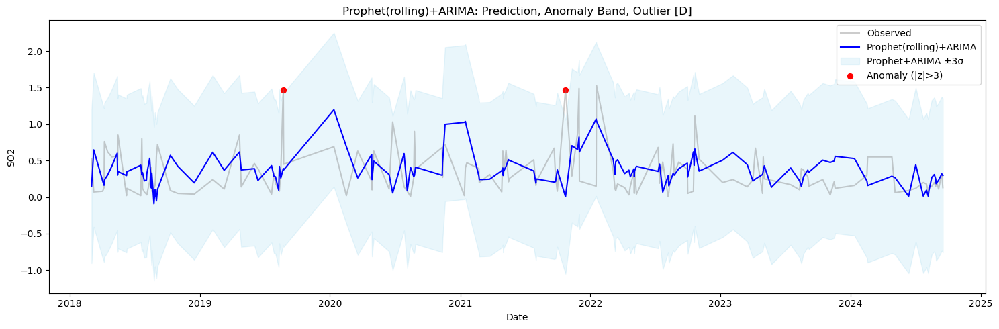

In [52]:
plot_arima_anomaly_band(df_pgg_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


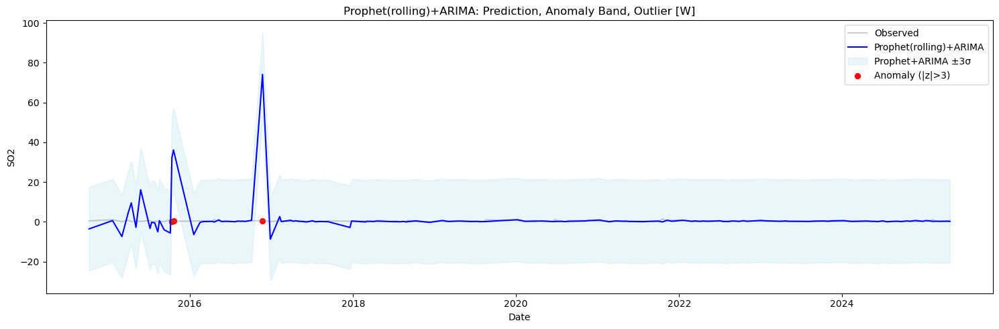

In [53]:
plot_arima_anomaly_band(df_pgg_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


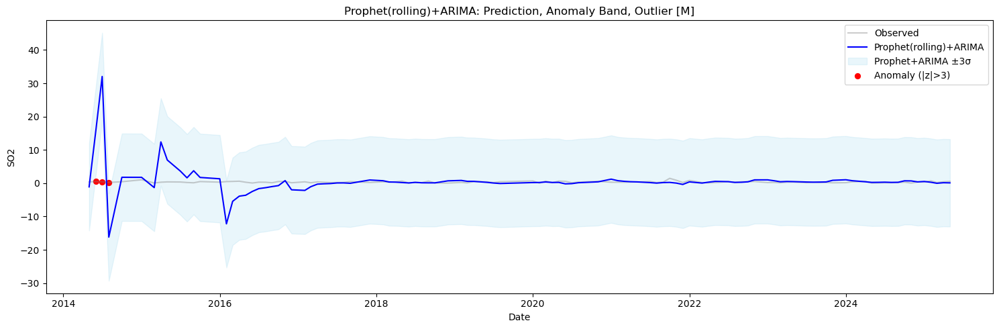

In [54]:
plot_arima_anomaly_band(df_pgg_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


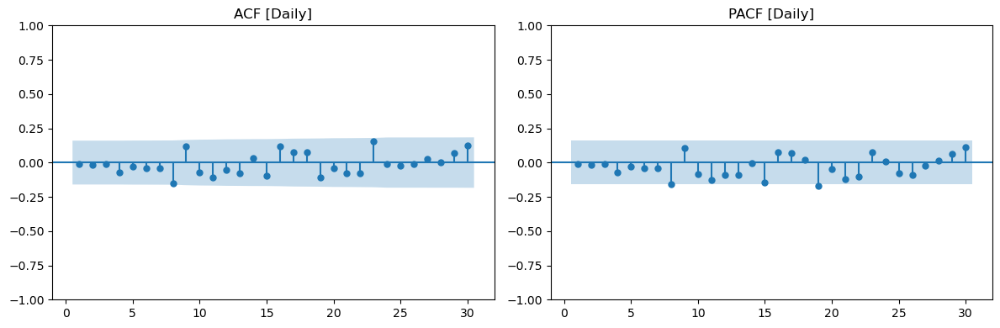

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   8.043913   0.624547
20  19.805668   0.470144
30  30.298579   0.450440



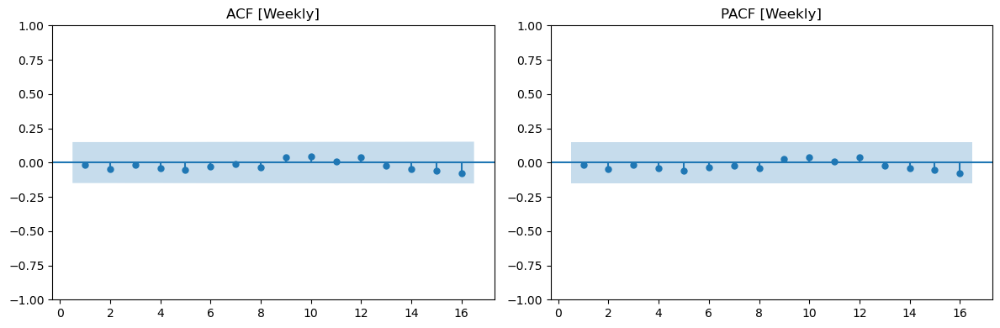

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
     lb_stat  lb_pvalue
8   1.649422   0.989940
12  2.603180   0.997756
16  4.889211   0.996277



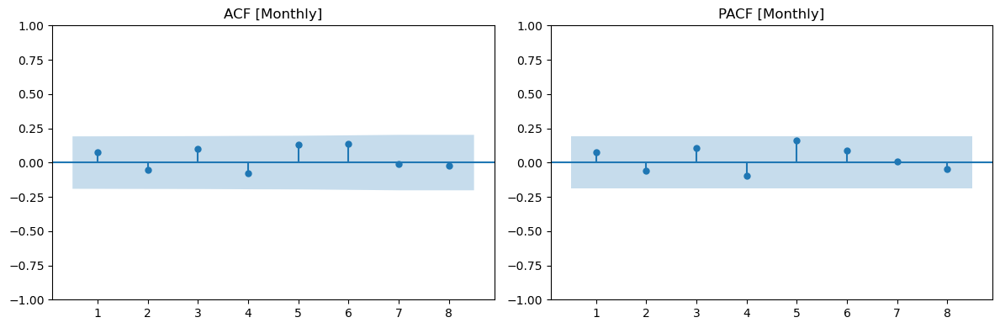

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  2.612387   0.624630
8  6.688419   0.570592



In [55]:
# Daily residual
residual_diagnostics(df_pgg_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_pgg_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_pgg_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Qinbei plant

In [56]:
df_qbi_NASA = pd.read_csv('Huaneng_SO2/Huaneng_qinbei.csv')
df_qbi_NASA = cleaning_NASA_data(df_qbi_NASA,'SO2')
df_qbi_NASA

,date,SO2
0,2014-01-06,0.330509
1,2014-01-14,1.268637
2,2014-01-15,0.720909
3,2014-01-19,0.824126
4,2014-01-20,0.420000
...,...,...
526,2025-05-26,0.230110
527,2025-05-29,0.179794
528,2025-06-04,0.079876
529,2025-06-24,0.150000


01:35:55 - cmdstanpy - INFO - Chain [1] start processing
01:35:55 - cmdstanpy - INFO - Chain [1] done processing
01:35:55 - cmdstanpy - INFO - Chain [1] start processing
01:35:55 - cmdstanpy - INFO - Chain [1] done processing
01:35:55 - cmdstanpy - INFO - Chain [1] start processing
01:35:55 - cmdstanpy - INFO - Chain [1] done processing
01:35:55 - cmdstanpy - INFO - Chain [1] start processing
01:35:55 - cmdstanpy - INFO - Chain [1] done processing
01:35:55 - cmdstanpy - INFO - Chain [1] start processing
01:35:55 - cmdstanpy - INFO - Chain [1] done processing
01:35:55 - cmdstanpy - INFO - Chain [1] start processing
01:35:55 - cmdstanpy - INFO - Chain [1] done processing
01:35:56 - cmdstanpy - INFO - Chain [1] start processing
01:35:56 - cmdstanpy - INFO - Chain [1] done processing
01:35:56 - cmdstanpy - INFO - Chain [1] start processing
01:35:56 - cmdstanpy - INFO - Chain [1] done processing
01:35:56 - cmdstanpy - INFO - Chain [1] start processing
01:35:56 - cmdstanpy - INFO - Chain [1]

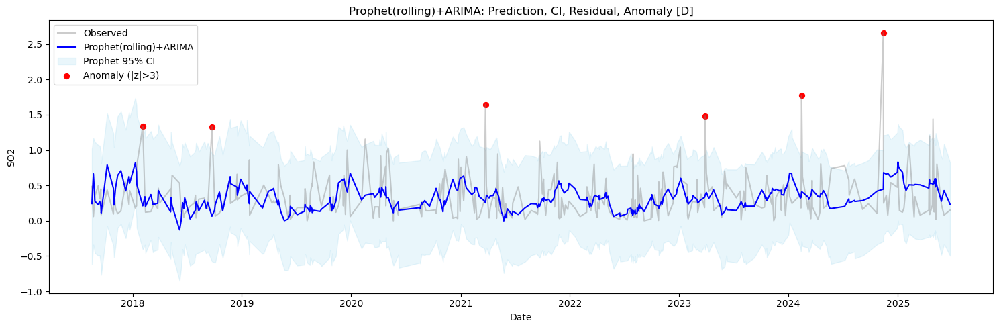

01:36:00 - cmdstanpy - INFO - Chain [1] start processing
01:36:00 - cmdstanpy - INFO - Chain [1] done processing
01:36:01 - cmdstanpy - INFO - Chain [1] start processing
01:36:01 - cmdstanpy - INFO - Chain [1] done processing
01:36:01 - cmdstanpy - INFO - Chain [1] start processing
01:36:01 - cmdstanpy - INFO - Chain [1] done processing
01:36:01 - cmdstanpy - INFO - Chain [1] start processing
01:36:01 - cmdstanpy - INFO - Chain [1] done processing
01:36:01 - cmdstanpy - INFO - Chain [1] start processing
01:36:01 - cmdstanpy - INFO - Chain [1] done processing
01:36:02 - cmdstanpy - INFO - Chain [1] start processing
01:36:02 - cmdstanpy - INFO - Chain [1] done processing
01:36:02 - cmdstanpy - INFO - Chain [1] start processing
01:36:02 - cmdstanpy - INFO - Chain [1] done processing
01:36:02 - cmdstanpy - INFO - Chain [1] start processing
01:36:02 - cmdstanpy - INFO - Chain [1] done processing
01:36:02 - cmdstanpy - INFO - Chain [1] start processing
01:36:03 - cmdstanpy - INFO - Chain [1]

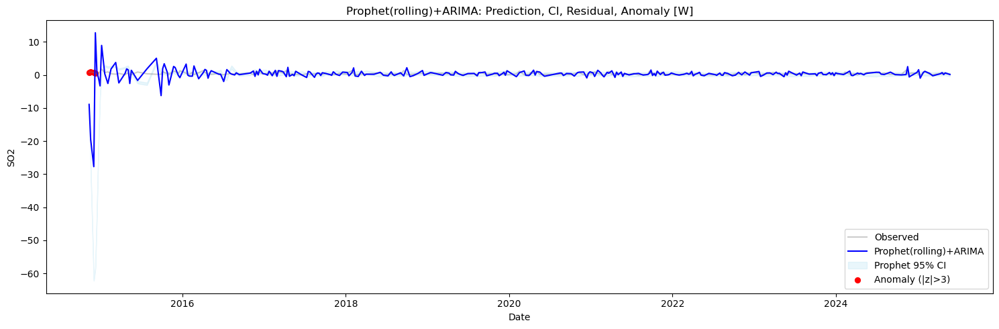

01:36:17 - cmdstanpy - INFO - Chain [1] start processing
01:36:17 - cmdstanpy - INFO - Chain [1] done processing
01:36:17 - cmdstanpy - INFO - Chain [1] start processing
01:36:17 - cmdstanpy - INFO - Chain [1] done processing
01:36:17 - cmdstanpy - INFO - Chain [1] start processing
01:36:18 - cmdstanpy - INFO - Chain [1] done processing
01:36:18 - cmdstanpy - INFO - Chain [1] start processing
01:36:18 - cmdstanpy - INFO - Chain [1] done processing
01:36:18 - cmdstanpy - INFO - Chain [1] start processing
01:36:19 - cmdstanpy - INFO - Chain [1] done processing
01:36:19 - cmdstanpy - INFO - Chain [1] start processing
01:36:23 - cmdstanpy - INFO - Chain [1] done processing
01:36:24 - cmdstanpy - INFO - Chain [1] start processing
01:36:24 - cmdstanpy - INFO - Chain [1] done processing
01:36:24 - cmdstanpy - INFO - Chain [1] start processing
01:36:31 - cmdstanpy - INFO - Chain [1] done processing
01:36:31 - cmdstanpy - INFO - Chain [1] start processing
01:36:39 - cmdstanpy - INFO - Chain [1]

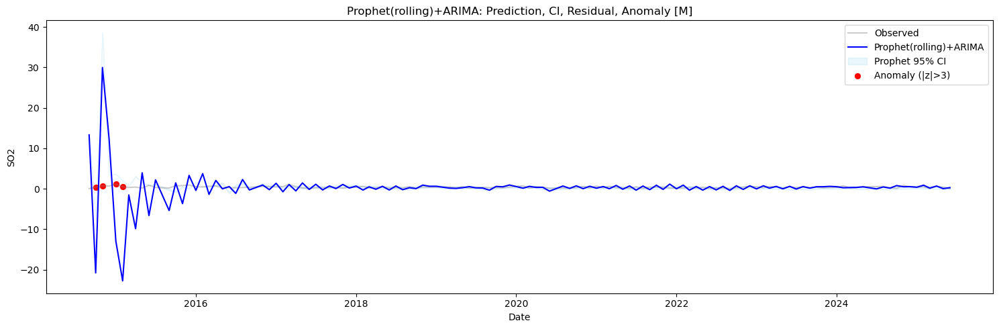

In [57]:
df_qbi_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_qbi_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=170, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_qbi_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_qbi_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps= 25, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_qbi_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_qbi_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=8, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

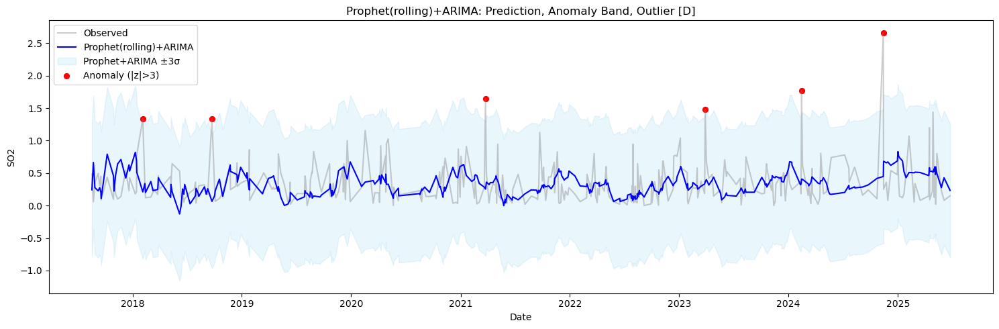

In [58]:
plot_arima_anomaly_band(df_qbi_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


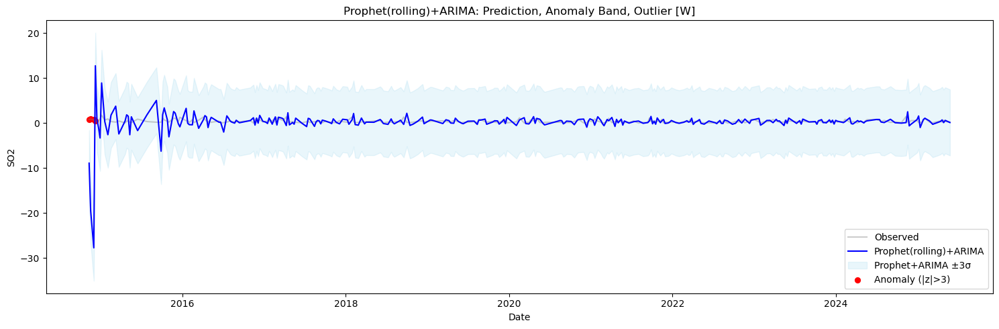

In [59]:
plot_arima_anomaly_band(df_qbi_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


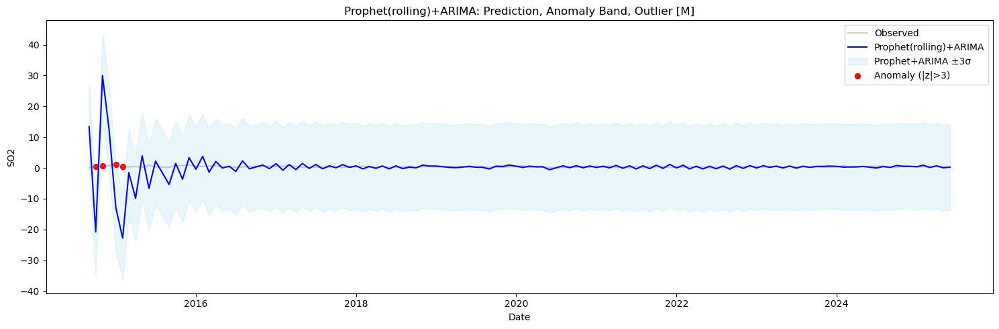

In [60]:
plot_arima_anomaly_band(df_qbi_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


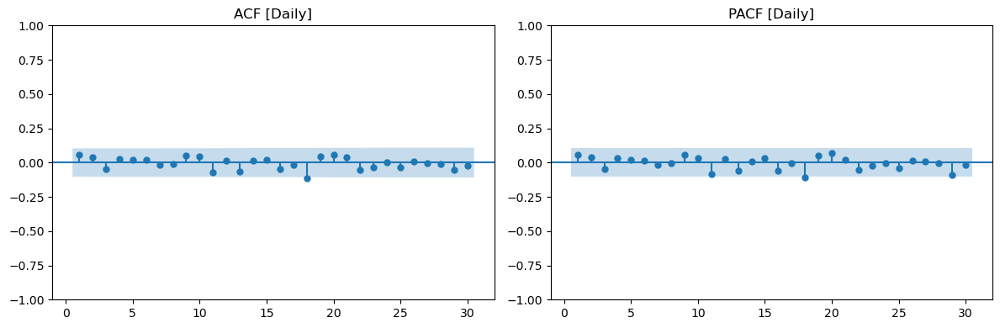

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   5.113346   0.883479
20  16.686641   0.673218
30  20.940944   0.889725



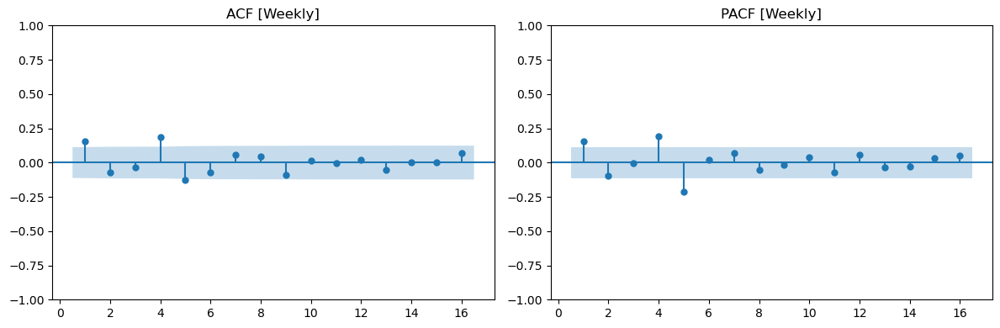

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   28.620225   0.000370
12  31.454618   0.001679
16  33.727712   0.005911



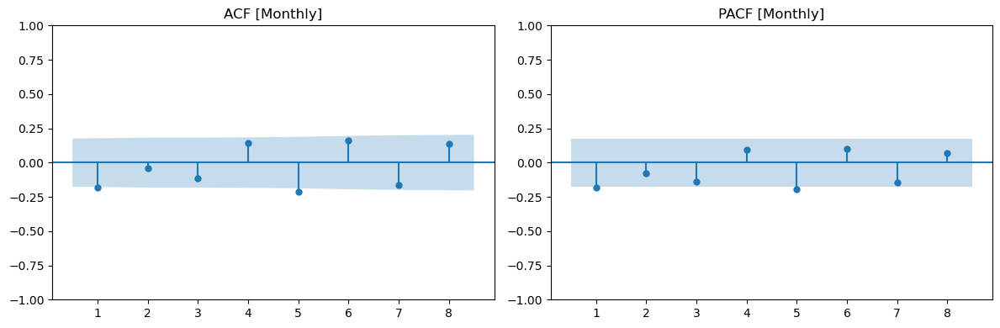

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4   8.730395   0.068203
8  24.079605   0.002222



In [61]:
# Daily residual
residual_diagnostics(df_qbi_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_qbi_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_qbi_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Shangan Plant

In [62]:
df_san_NASA = pd.read_csv('Huaneng_SO2/Huaneng_shangan.csv')
df_san_NASA = cleaning_NASA_data(df_san_NASA,'SO2')
df_san_NASA

,date,SO2
0,2014-01-04,0.58
1,2014-01-09,1.79
2,2014-01-10,2.68
3,2014-01-18,0.96
4,2014-01-25,2.31
...,...,...
517,2025-06-15,0.20
518,2025-06-16,0.53
519,2025-06-17,0.71
520,2025-06-21,0.05


01:37:59 - cmdstanpy - INFO - Chain [1] start processing
01:37:59 - cmdstanpy - INFO - Chain [1] done processing
01:37:59 - cmdstanpy - INFO - Chain [1] start processing
01:37:59 - cmdstanpy - INFO - Chain [1] done processing
01:37:59 - cmdstanpy - INFO - Chain [1] start processing
01:37:59 - cmdstanpy - INFO - Chain [1] done processing
01:37:59 - cmdstanpy - INFO - Chain [1] start processing
01:38:00 - cmdstanpy - INFO - Chain [1] done processing
01:38:00 - cmdstanpy - INFO - Chain [1] start processing
01:38:00 - cmdstanpy - INFO - Chain [1] done processing
01:38:00 - cmdstanpy - INFO - Chain [1] start processing
01:38:00 - cmdstanpy - INFO - Chain [1] done processing
01:38:00 - cmdstanpy - INFO - Chain [1] start processing
01:38:00 - cmdstanpy - INFO - Chain [1] done processing
01:38:00 - cmdstanpy - INFO - Chain [1] start processing
01:38:00 - cmdstanpy - INFO - Chain [1] done processing
01:38:00 - cmdstanpy - INFO - Chain [1] start processing
01:38:00 - cmdstanpy - INFO - Chain [1]

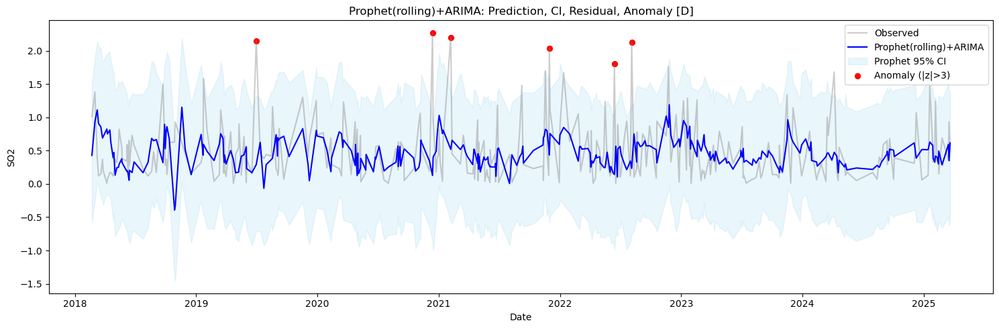

01:38:03 - cmdstanpy - INFO - Chain [1] start processing
01:38:03 - cmdstanpy - INFO - Chain [1] done processing
01:38:04 - cmdstanpy - INFO - Chain [1] start processing
01:38:04 - cmdstanpy - INFO - Chain [1] done processing
01:38:04 - cmdstanpy - INFO - Chain [1] start processing
01:38:04 - cmdstanpy - INFO - Chain [1] done processing
01:38:04 - cmdstanpy - INFO - Chain [1] start processing
01:38:04 - cmdstanpy - INFO - Chain [1] done processing
01:38:04 - cmdstanpy - INFO - Chain [1] start processing
01:38:04 - cmdstanpy - INFO - Chain [1] done processing
01:38:04 - cmdstanpy - INFO - Chain [1] start processing
01:38:05 - cmdstanpy - INFO - Chain [1] done processing
01:38:05 - cmdstanpy - INFO - Chain [1] start processing
01:38:05 - cmdstanpy - INFO - Chain [1] done processing
01:38:05 - cmdstanpy - INFO - Chain [1] start processing
01:38:05 - cmdstanpy - INFO - Chain [1] done processing
01:38:05 - cmdstanpy - INFO - Chain [1] start processing
01:38:05 - cmdstanpy - INFO - Chain [1]

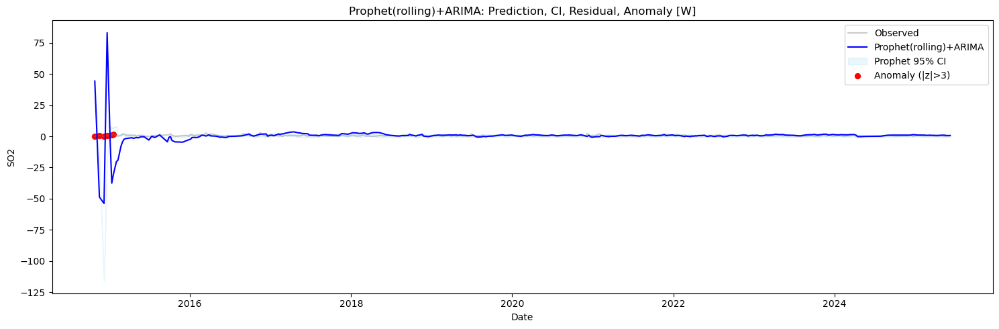

01:38:23 - cmdstanpy - INFO - Chain [1] start processing
01:38:23 - cmdstanpy - INFO - Chain [1] done processing
01:38:23 - cmdstanpy - INFO - Chain [1] start processing
01:38:26 - cmdstanpy - INFO - Chain [1] done processing
01:38:26 - cmdstanpy - INFO - Chain [1] start processing
01:38:28 - cmdstanpy - INFO - Chain [1] done processing
01:38:28 - cmdstanpy - INFO - Chain [1] start processing
01:38:28 - cmdstanpy - INFO - Chain [1] done processing
01:38:28 - cmdstanpy - INFO - Chain [1] start processing
01:38:34 - cmdstanpy - INFO - Chain [1] done processing
01:38:34 - cmdstanpy - INFO - Chain [1] start processing
01:38:34 - cmdstanpy - INFO - Chain [1] done processing
01:38:34 - cmdstanpy - INFO - Chain [1] start processing
01:38:34 - cmdstanpy - INFO - Chain [1] done processing
01:38:35 - cmdstanpy - INFO - Chain [1] start processing
01:38:41 - cmdstanpy - INFO - Chain [1] done processing
01:38:41 - cmdstanpy - INFO - Chain [1] start processing
01:38:44 - cmdstanpy - INFO - Chain [1]

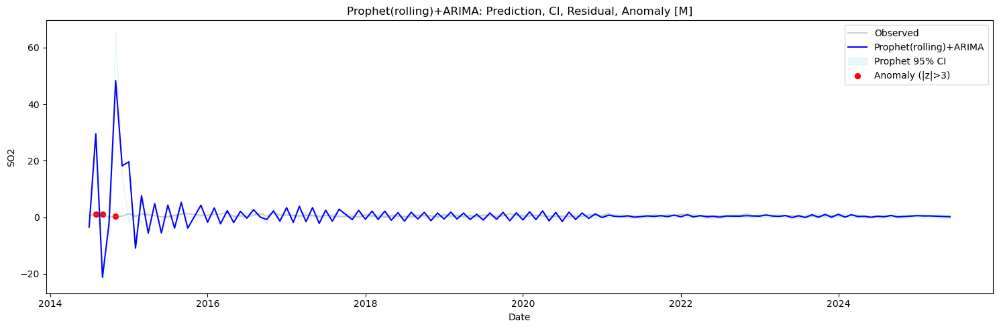

In [63]:
df_san_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_san_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=170, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_san_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_san_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=25, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_san_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_san_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=6, test_steps=3, step=1, z_thresh=3, freq='M', plot=True
)

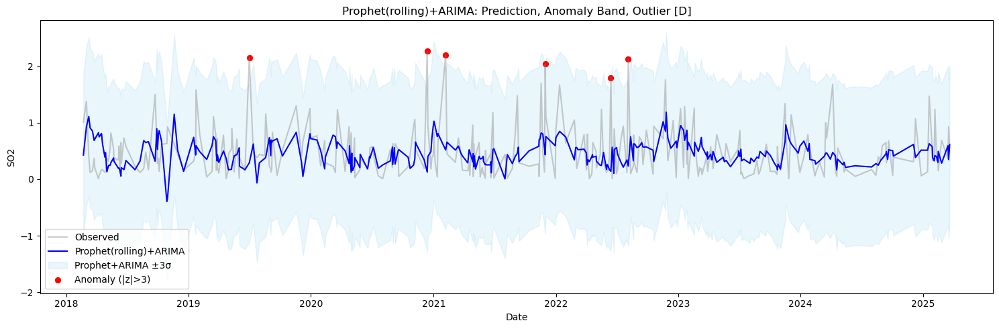

In [64]:
plot_arima_anomaly_band(df_san_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


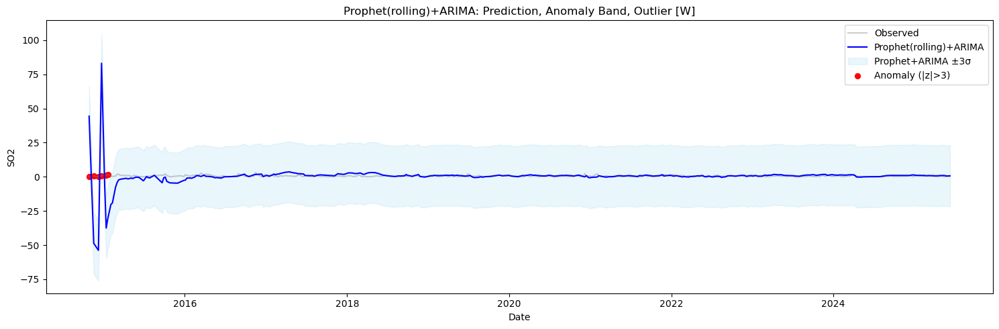

In [65]:
plot_arima_anomaly_band(df_san_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


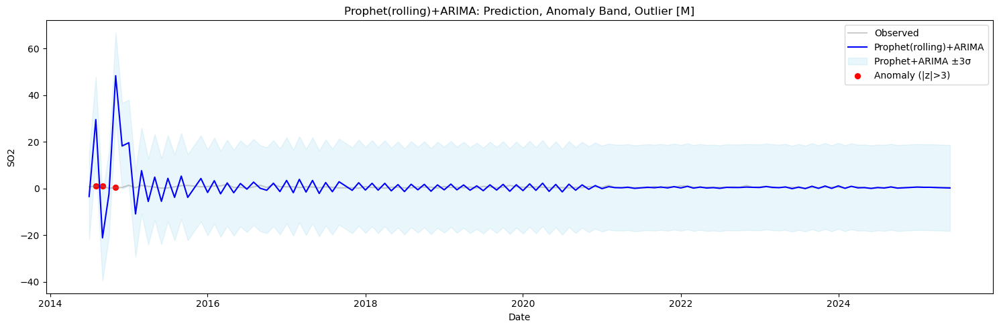

In [66]:
plot_arima_anomaly_band(df_san_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


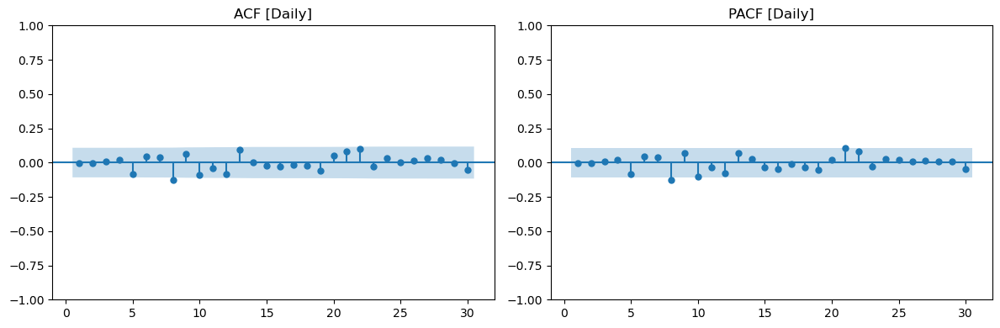

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  13.419059   0.201176
20  22.547804   0.311540
30  30.828473   0.423874



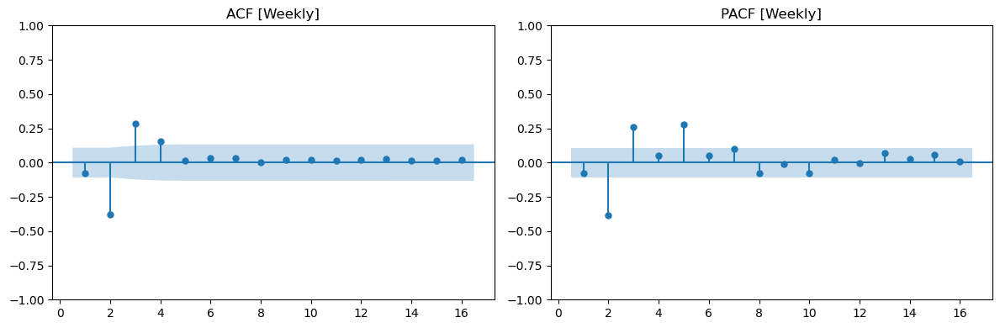

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   85.669852  3.507724e-15
12  86.155251  2.728164e-13
16  86.733625  9.954054e-12



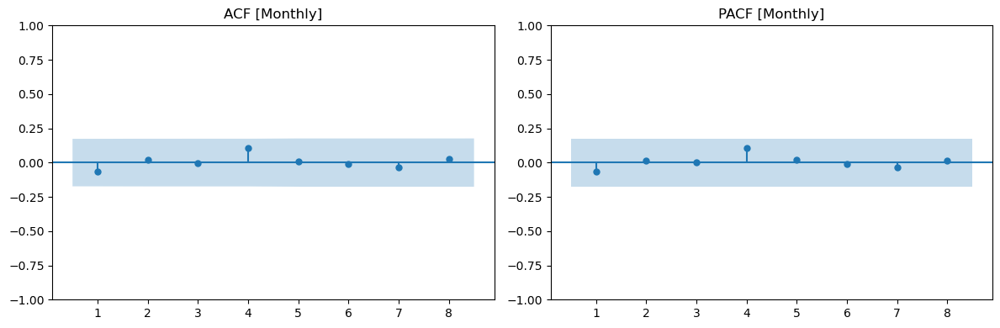

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  2.152579   0.707720
8  2.447207   0.964147



In [67]:
# Daily residual
residual_diagnostics(df_san_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_san_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_san_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Shangdu Plant

In [68]:
df_sau_NASA = pd.read_csv('Huaneng_SO2/Huaneng_shangdu.csv')
df_sau_NASA = cleaning_NASA_data(df_sau_NASA,'SO2')
df_sau_NASA

,date,SO2
0,2014-01-01,1.68
1,2014-01-04,2.32
2,2014-01-11,1.46
3,2014-01-13,0.14
4,2014-01-15,4.61
...,...,...
698,2025-06-02,0.52
699,2025-06-08,0.03
700,2025-06-12,0.39
701,2025-06-15,0.41


01:40:16 - cmdstanpy - INFO - Chain [1] start processing
01:40:16 - cmdstanpy - INFO - Chain [1] done processing
01:40:17 - cmdstanpy - INFO - Chain [1] start processing
01:40:17 - cmdstanpy - INFO - Chain [1] done processing
01:40:17 - cmdstanpy - INFO - Chain [1] start processing
01:40:17 - cmdstanpy - INFO - Chain [1] done processing
01:40:17 - cmdstanpy - INFO - Chain [1] start processing
01:40:17 - cmdstanpy - INFO - Chain [1] done processing
01:40:17 - cmdstanpy - INFO - Chain [1] start processing
01:40:17 - cmdstanpy - INFO - Chain [1] done processing
01:40:17 - cmdstanpy - INFO - Chain [1] start processing
01:40:17 - cmdstanpy - INFO - Chain [1] done processing
01:40:17 - cmdstanpy - INFO - Chain [1] start processing
01:40:17 - cmdstanpy - INFO - Chain [1] done processing
01:40:18 - cmdstanpy - INFO - Chain [1] start processing
01:40:18 - cmdstanpy - INFO - Chain [1] done processing
01:40:18 - cmdstanpy - INFO - Chain [1] start processing
01:40:18 - cmdstanpy - INFO - Chain [1]

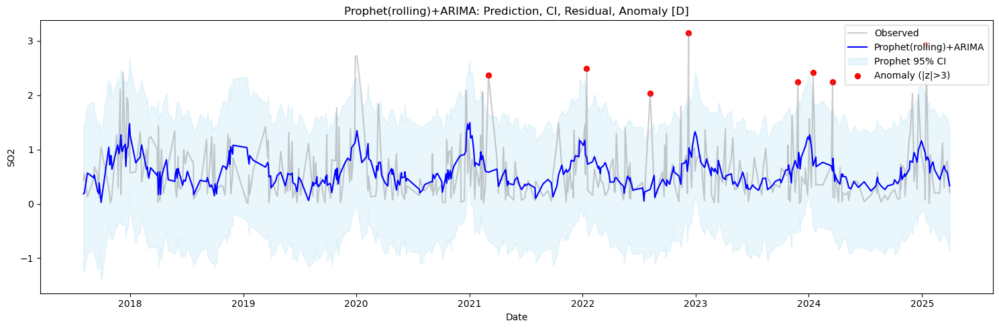

01:40:21 - cmdstanpy - INFO - Chain [1] start processing
01:40:21 - cmdstanpy - INFO - Chain [1] done processing
01:40:21 - cmdstanpy - INFO - Chain [1] start processing
01:40:21 - cmdstanpy - INFO - Chain [1] done processing
01:40:21 - cmdstanpy - INFO - Chain [1] start processing
01:40:21 - cmdstanpy - INFO - Chain [1] done processing
01:40:21 - cmdstanpy - INFO - Chain [1] start processing
01:40:21 - cmdstanpy - INFO - Chain [1] done processing
01:40:22 - cmdstanpy - INFO - Chain [1] start processing
01:40:22 - cmdstanpy - INFO - Chain [1] done processing
01:40:22 - cmdstanpy - INFO - Chain [1] start processing
01:40:22 - cmdstanpy - INFO - Chain [1] done processing
01:40:22 - cmdstanpy - INFO - Chain [1] start processing
01:40:22 - cmdstanpy - INFO - Chain [1] done processing
01:40:22 - cmdstanpy - INFO - Chain [1] start processing
01:40:23 - cmdstanpy - INFO - Chain [1] done processing
01:40:23 - cmdstanpy - INFO - Chain [1] start processing
01:40:23 - cmdstanpy - INFO - Chain [1]

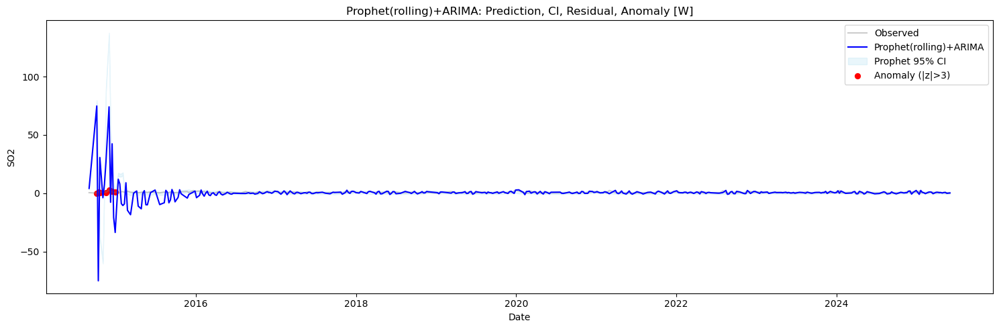

01:40:51 - cmdstanpy - INFO - Chain [1] start processing
01:40:51 - cmdstanpy - INFO - Chain [1] done processing
01:40:51 - cmdstanpy - INFO - Chain [1] start processing
01:40:52 - cmdstanpy - INFO - Chain [1] done processing
01:40:52 - cmdstanpy - INFO - Chain [1] start processing
01:40:55 - cmdstanpy - INFO - Chain [1] done processing
01:40:55 - cmdstanpy - INFO - Chain [1] start processing
01:40:56 - cmdstanpy - INFO - Chain [1] done processing
01:40:56 - cmdstanpy - INFO - Chain [1] start processing
01:40:58 - cmdstanpy - INFO - Chain [1] done processing
01:40:58 - cmdstanpy - INFO - Chain [1] start processing
01:40:59 - cmdstanpy - INFO - Chain [1] done processing
01:40:59 - cmdstanpy - INFO - Chain [1] start processing
01:41:00 - cmdstanpy - INFO - Chain [1] done processing
01:41:00 - cmdstanpy - INFO - Chain [1] start processing
01:41:03 - cmdstanpy - INFO - Chain [1] done processing
01:41:03 - cmdstanpy - INFO - Chain [1] start processing
01:41:10 - cmdstanpy - INFO - Chain [1]

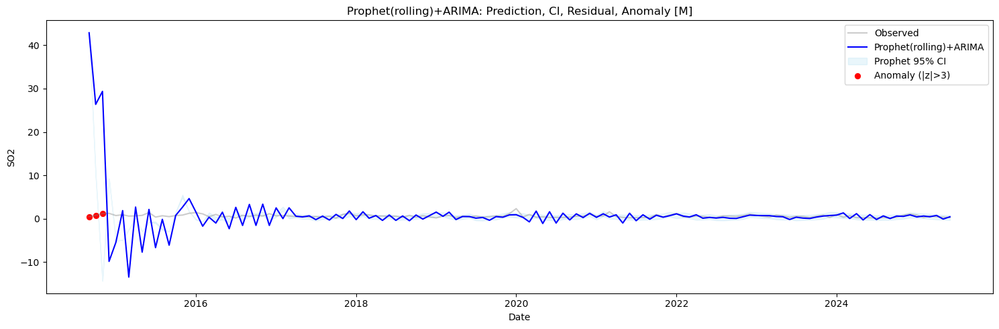

In [69]:
df_sau_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sau_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=230, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_sau_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sau_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=32, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_sau_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sau_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=8, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

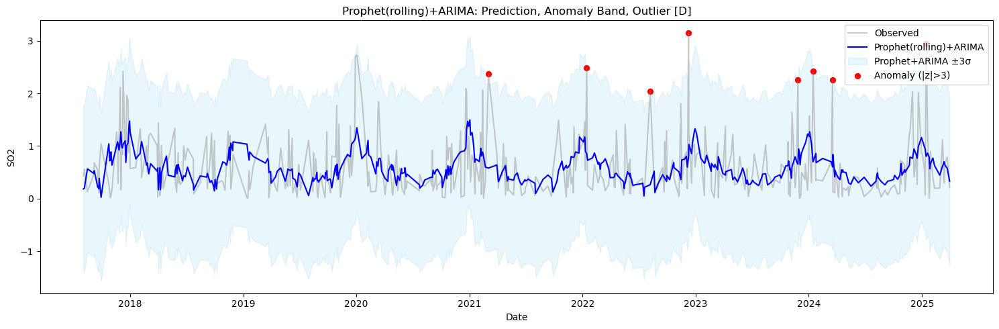

In [70]:
plot_arima_anomaly_band(df_sau_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


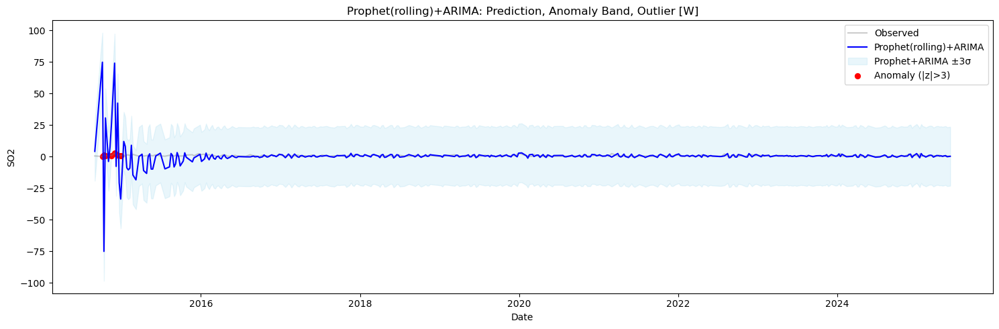

In [71]:
plot_arima_anomaly_band(df_sau_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


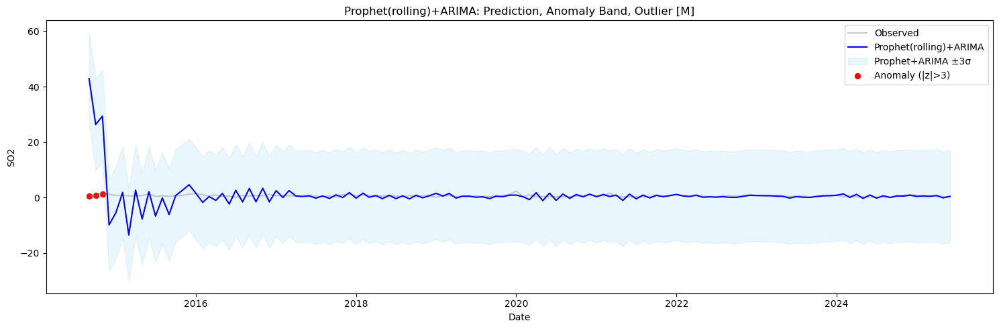

In [72]:
plot_arima_anomaly_band(df_sau_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


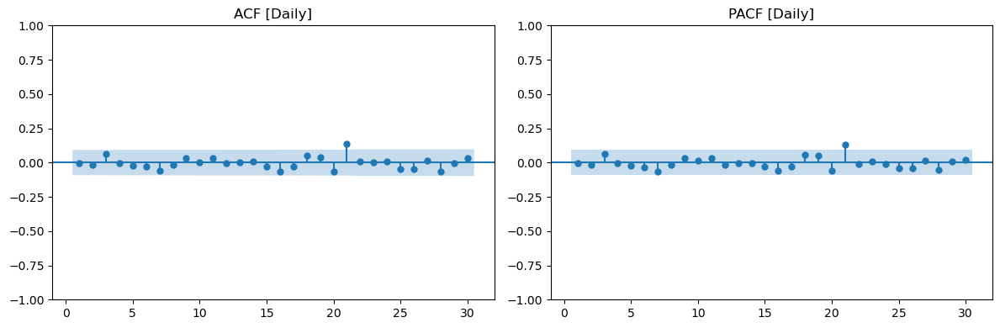

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   5.060629   0.887091
20  12.070576   0.913625
30  25.823703   0.684099



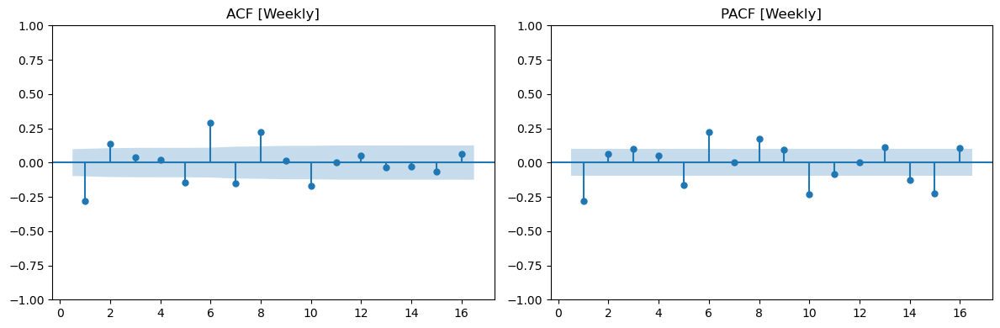

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
       lb_stat     lb_pvalue
8   113.013330  9.138373e-21
12  125.847422  4.195696e-21
16  130.461686  5.221339e-20



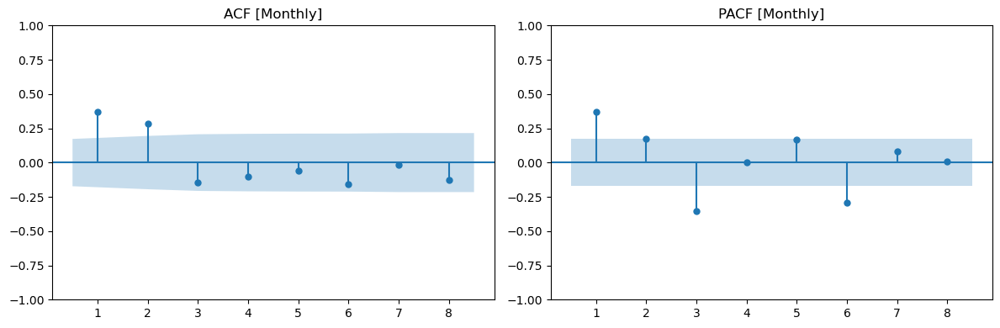

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  33.097613   0.000001
8  39.220658   0.000004



In [73]:
# Daily residual
residual_diagnostics(df_sau_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_sau_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_sau_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Yangluo Plant

In [74]:
df_ygo_NASA = pd.read_csv('Huaneng_SO2/Huaneng_yangluo.csv')
df_ygo_NASA = cleaning_NASA_data(df_ygo_NASA,'SO2')
df_ygo_NASA

,date,SO2
0,2014-01-03,0.53
1,2014-01-06,1.06
2,2014-01-13,0.27
3,2014-01-17,0.34
4,2014-01-22,1.90
...,...,...
582,2025-05-19,0.25
583,2025-06-09,0.20
584,2025-06-10,0.20
585,2025-06-23,0.10


01:42:08 - cmdstanpy - INFO - Chain [1] start processing
01:42:08 - cmdstanpy - INFO - Chain [1] done processing
01:42:08 - cmdstanpy - INFO - Chain [1] start processing
01:42:08 - cmdstanpy - INFO - Chain [1] done processing
01:42:08 - cmdstanpy - INFO - Chain [1] start processing
01:42:08 - cmdstanpy - INFO - Chain [1] done processing
01:42:08 - cmdstanpy - INFO - Chain [1] start processing
01:42:08 - cmdstanpy - INFO - Chain [1] done processing
01:42:08 - cmdstanpy - INFO - Chain [1] start processing
01:42:08 - cmdstanpy - INFO - Chain [1] done processing
01:42:08 - cmdstanpy - INFO - Chain [1] start processing
01:42:09 - cmdstanpy - INFO - Chain [1] done processing
01:42:09 - cmdstanpy - INFO - Chain [1] start processing
01:42:09 - cmdstanpy - INFO - Chain [1] done processing
01:42:09 - cmdstanpy - INFO - Chain [1] start processing
01:42:09 - cmdstanpy - INFO - Chain [1] done processing
01:42:09 - cmdstanpy - INFO - Chain [1] start processing
01:42:09 - cmdstanpy - INFO - Chain [1]

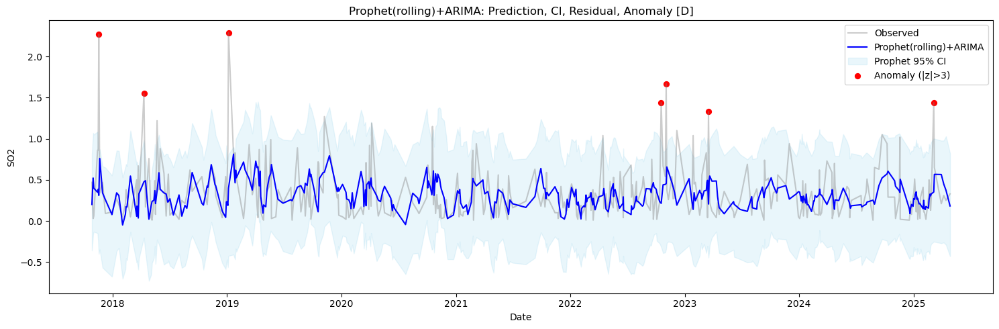

01:42:11 - cmdstanpy - INFO - Chain [1] start processing
01:42:11 - cmdstanpy - INFO - Chain [1] done processing
01:42:11 - cmdstanpy - INFO - Chain [1] start processing
01:42:11 - cmdstanpy - INFO - Chain [1] done processing
01:42:11 - cmdstanpy - INFO - Chain [1] start processing
01:42:11 - cmdstanpy - INFO - Chain [1] done processing
01:42:12 - cmdstanpy - INFO - Chain [1] start processing
01:42:12 - cmdstanpy - INFO - Chain [1] done processing
01:42:12 - cmdstanpy - INFO - Chain [1] start processing
01:42:12 - cmdstanpy - INFO - Chain [1] done processing
01:42:12 - cmdstanpy - INFO - Chain [1] start processing
01:42:12 - cmdstanpy - INFO - Chain [1] done processing
01:42:12 - cmdstanpy - INFO - Chain [1] start processing
01:42:13 - cmdstanpy - INFO - Chain [1] done processing
01:42:13 - cmdstanpy - INFO - Chain [1] start processing
01:42:13 - cmdstanpy - INFO - Chain [1] done processing
01:42:13 - cmdstanpy - INFO - Chain [1] start processing
01:42:13 - cmdstanpy - INFO - Chain [1]

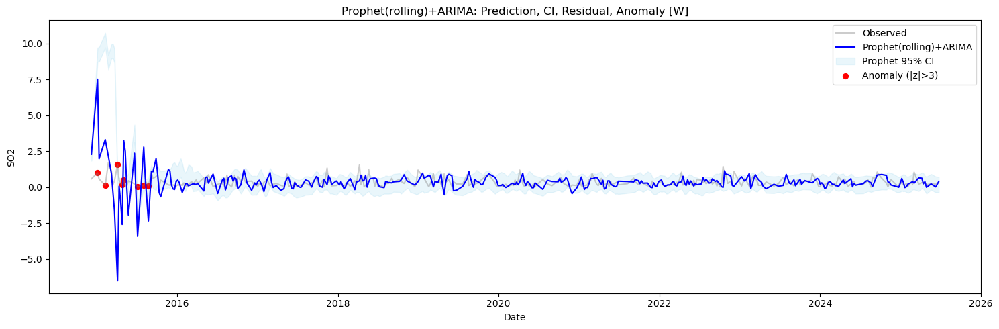

01:42:38 - cmdstanpy - INFO - Chain [1] start processing
01:42:38 - cmdstanpy - INFO - Chain [1] done processing
01:42:39 - cmdstanpy - INFO - Chain [1] start processing
01:42:39 - cmdstanpy - INFO - Chain [1] done processing
01:42:39 - cmdstanpy - INFO - Chain [1] start processing
01:42:39 - cmdstanpy - INFO - Chain [1] done processing
01:42:39 - cmdstanpy - INFO - Chain [1] start processing
01:42:40 - cmdstanpy - INFO - Chain [1] done processing
01:42:40 - cmdstanpy - INFO - Chain [1] start processing
01:42:46 - cmdstanpy - INFO - Chain [1] done processing
01:42:46 - cmdstanpy - INFO - Chain [1] start processing
01:42:46 - cmdstanpy - INFO - Chain [1] done processing
01:42:46 - cmdstanpy - INFO - Chain [1] start processing
01:42:46 - cmdstanpy - INFO - Chain [1] done processing
01:42:46 - cmdstanpy - INFO - Chain [1] start processing
01:42:48 - cmdstanpy - INFO - Chain [1] done processing
01:42:48 - cmdstanpy - INFO - Chain [1] start processing
01:42:48 - cmdstanpy - INFO - Chain [1]

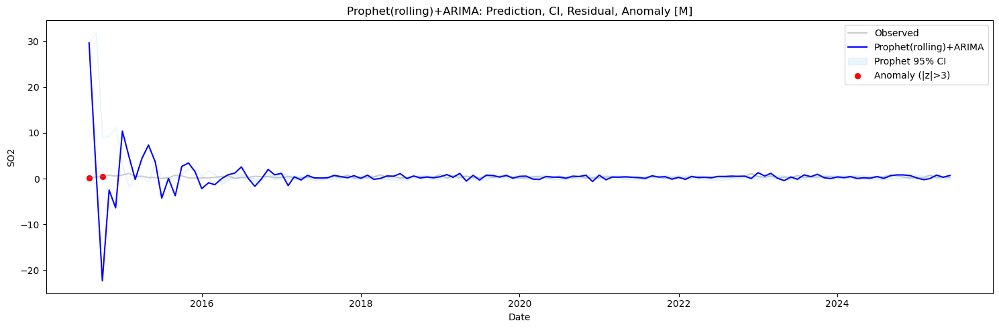

In [75]:
df_ygo_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ygo_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=190, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_ygo_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ygo_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=27, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_ygo_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ygo_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=6, test_steps=2, step=1, z_thresh=3, freq='M', plot=True
)

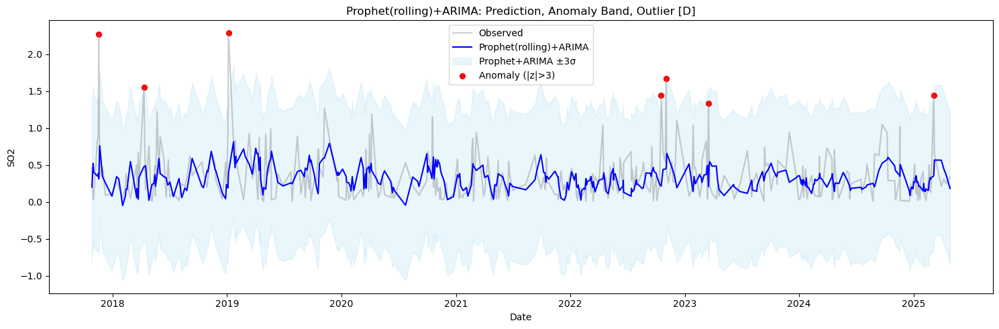

In [76]:
plot_arima_anomaly_band(df_ygo_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


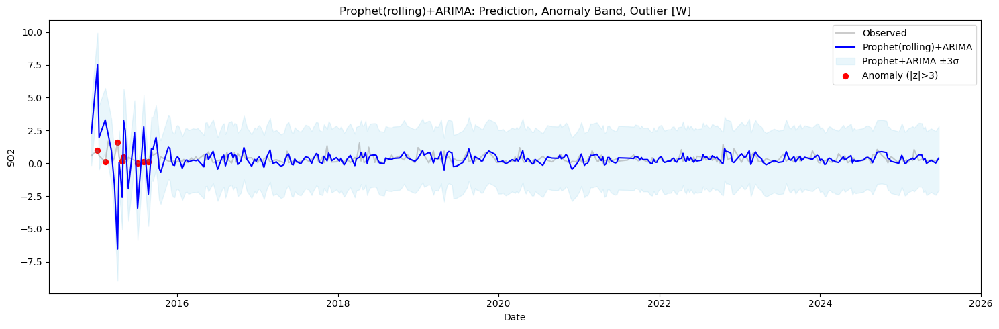

In [77]:
plot_arima_anomaly_band(df_ygo_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


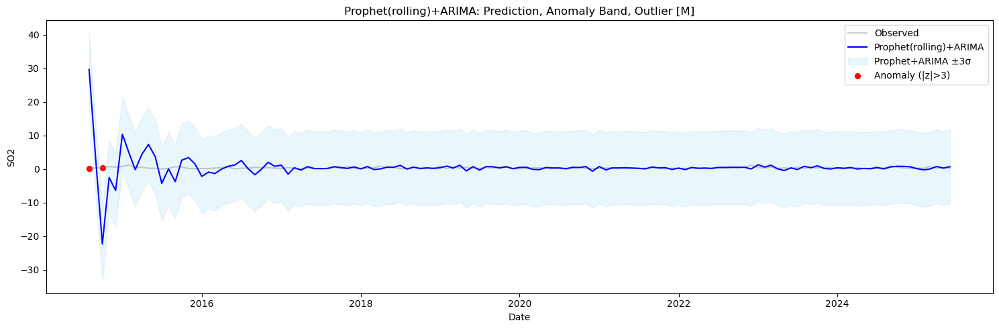

In [78]:
plot_arima_anomaly_band(df_ygo_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


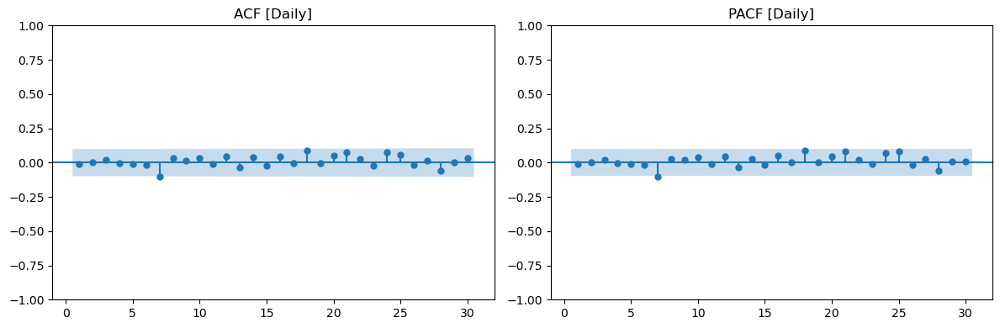

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   5.372145   0.864974
20  12.476352   0.898706
30  21.047076   0.886410



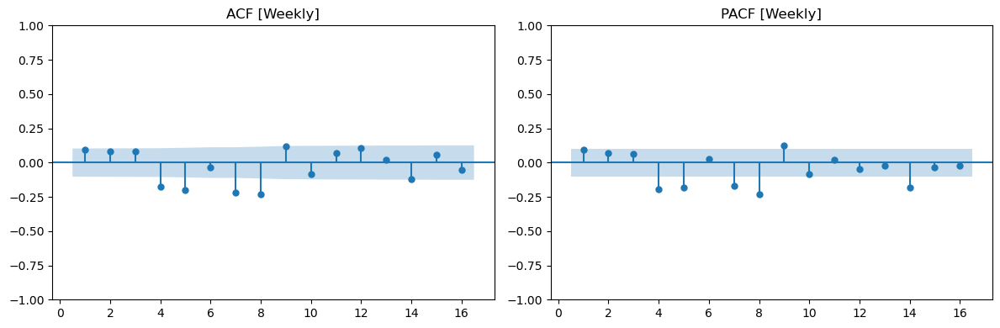

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   73.063667  1.203413e-12
12  86.928478  1.935924e-13
16  94.598138  3.528597e-13



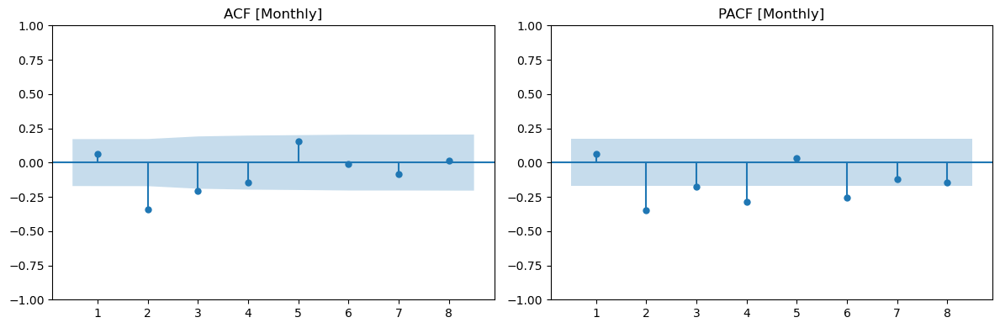

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  24.907247   0.000053
8  29.162163   0.000297



In [79]:
# Daily residual
residual_diagnostics(df_ygo_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_ygo_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_ygo_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Yimin Plant

In [80]:
df_ymn_NASA = pd.read_csv('Huaneng_SO2/Huaneng_yimin.csv')
df_ymn_NASA = cleaning_NASA_data(df_ymn_NASA,'SO2')
df_ymn_NASA

,date,SO2
0,2014-01-01,0.94
1,2014-01-04,1.72
2,2014-01-18,0.06
3,2014-01-20,0.26
4,2014-01-25,2.82
...,...,...
399,2025-05-02,0.37
400,2025-05-07,1.35
401,2025-05-12,0.31
402,2025-05-26,0.49


01:44:11 - cmdstanpy - INFO - Chain [1] start processing
01:44:11 - cmdstanpy - INFO - Chain [1] done processing
01:44:11 - cmdstanpy - INFO - Chain [1] start processing
01:44:11 - cmdstanpy - INFO - Chain [1] done processing
01:44:11 - cmdstanpy - INFO - Chain [1] start processing
01:44:11 - cmdstanpy - INFO - Chain [1] done processing
01:44:12 - cmdstanpy - INFO - Chain [1] start processing
01:44:12 - cmdstanpy - INFO - Chain [1] done processing
01:44:12 - cmdstanpy - INFO - Chain [1] start processing
01:44:12 - cmdstanpy - INFO - Chain [1] done processing
01:44:12 - cmdstanpy - INFO - Chain [1] start processing
01:44:12 - cmdstanpy - INFO - Chain [1] done processing
01:44:12 - cmdstanpy - INFO - Chain [1] start processing
01:44:12 - cmdstanpy - INFO - Chain [1] done processing
01:44:12 - cmdstanpy - INFO - Chain [1] start processing
01:44:12 - cmdstanpy - INFO - Chain [1] done processing
01:44:12 - cmdstanpy - INFO - Chain [1] start processing
01:44:13 - cmdstanpy - INFO - Chain [1]

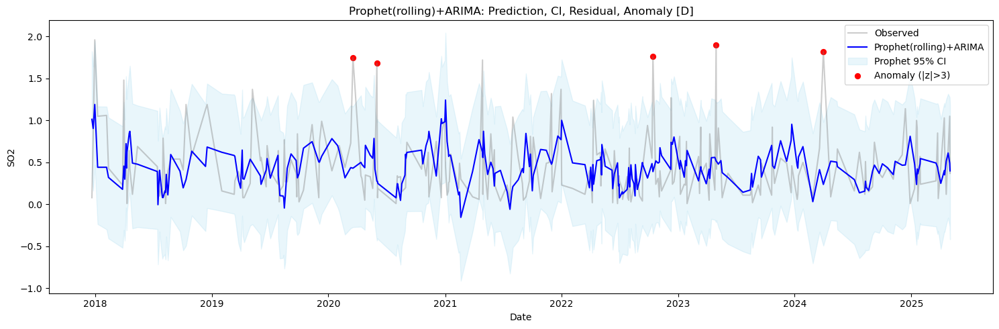

01:44:13 - cmdstanpy - INFO - Chain [1] start processing
01:44:23 - cmdstanpy - INFO - Chain [1] done processing
01:44:23 - cmdstanpy - INFO - Chain [1] start processing
01:44:23 - cmdstanpy - INFO - Chain [1] done processing
01:44:23 - cmdstanpy - INFO - Chain [1] start processing
01:44:23 - cmdstanpy - INFO - Chain [1] done processing
01:44:24 - cmdstanpy - INFO - Chain [1] start processing
01:44:24 - cmdstanpy - INFO - Chain [1] done processing
01:44:24 - cmdstanpy - INFO - Chain [1] start processing
01:44:24 - cmdstanpy - INFO - Chain [1] done processing
01:44:24 - cmdstanpy - INFO - Chain [1] start processing
01:44:24 - cmdstanpy - INFO - Chain [1] done processing
01:44:24 - cmdstanpy - INFO - Chain [1] start processing
01:44:24 - cmdstanpy - INFO - Chain [1] done processing
01:44:25 - cmdstanpy - INFO - Chain [1] start processing
01:44:25 - cmdstanpy - INFO - Chain [1] done processing
01:44:25 - cmdstanpy - INFO - Chain [1] start processing
01:44:25 - cmdstanpy - INFO - Chain [1]

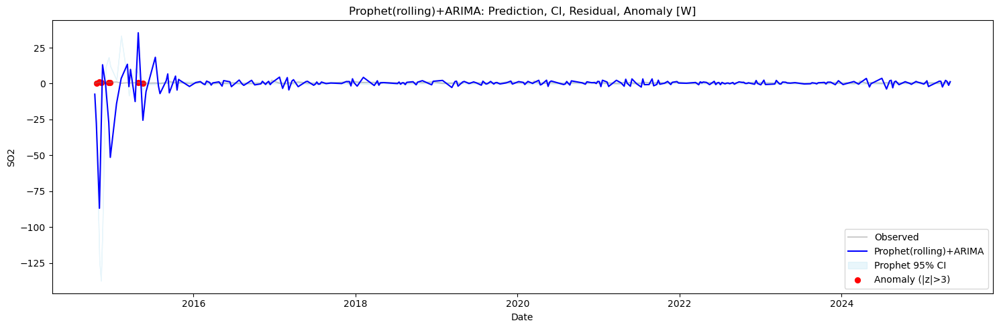

01:44:40 - cmdstanpy - INFO - Chain [1] start processing
01:44:40 - cmdstanpy - INFO - Chain [1] done processing
01:44:40 - cmdstanpy - INFO - Chain [1] start processing
01:44:41 - cmdstanpy - INFO - Chain [1] done processing
01:44:41 - cmdstanpy - INFO - Chain [1] start processing
01:44:41 - cmdstanpy - INFO - Chain [1] done processing
01:44:41 - cmdstanpy - INFO - Chain [1] start processing
01:44:41 - cmdstanpy - INFO - Chain [1] done processing
01:44:41 - cmdstanpy - INFO - Chain [1] start processing
01:44:42 - cmdstanpy - INFO - Chain [1] done processing
01:44:43 - cmdstanpy - INFO - Chain [1] start processing
01:44:48 - cmdstanpy - INFO - Chain [1] done processing
01:44:48 - cmdstanpy - INFO - Chain [1] start processing
01:44:49 - cmdstanpy - INFO - Chain [1] done processing
01:44:49 - cmdstanpy - INFO - Chain [1] start processing
01:44:55 - cmdstanpy - INFO - Chain [1] done processing
01:44:55 - cmdstanpy - INFO - Chain [1] start processing
01:44:58 - cmdstanpy - INFO - Chain [1]

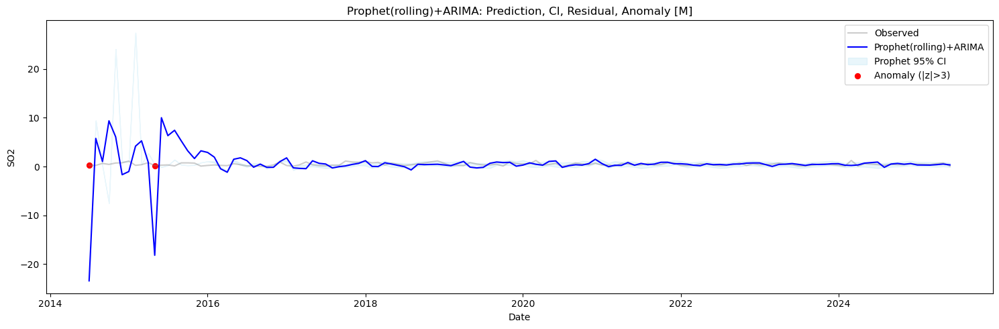

In [81]:
df_ymn_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ymn_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=130, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_ymn_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ymn_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=18, test_steps=5, step=4, z_thresh=3, freq='W', plot=True
)
df_ymn_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ymn_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=4, test_steps=1, step=1, z_thresh=3, freq='M', plot=True
)

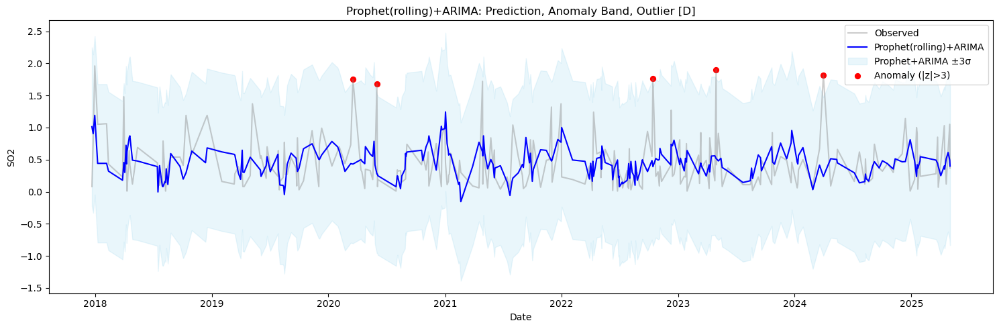

In [82]:
plot_arima_anomaly_band(df_ymn_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


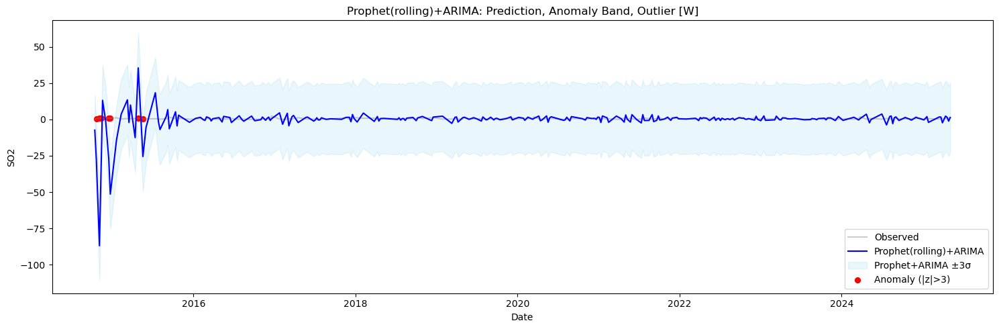

In [83]:
plot_arima_anomaly_band(df_ymn_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


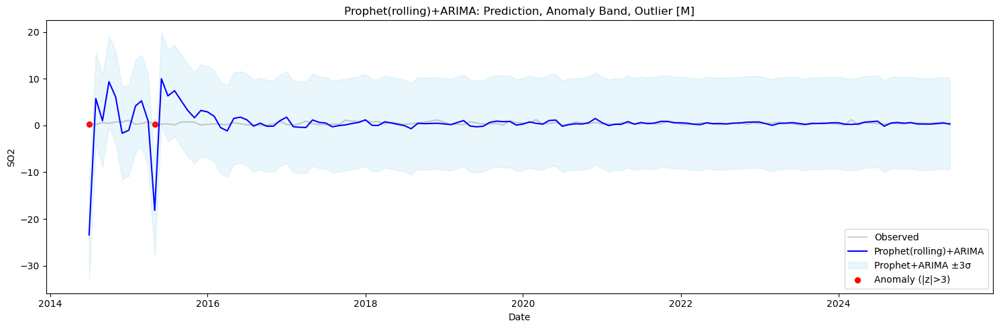

In [84]:
plot_arima_anomaly_band(df_ymn_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


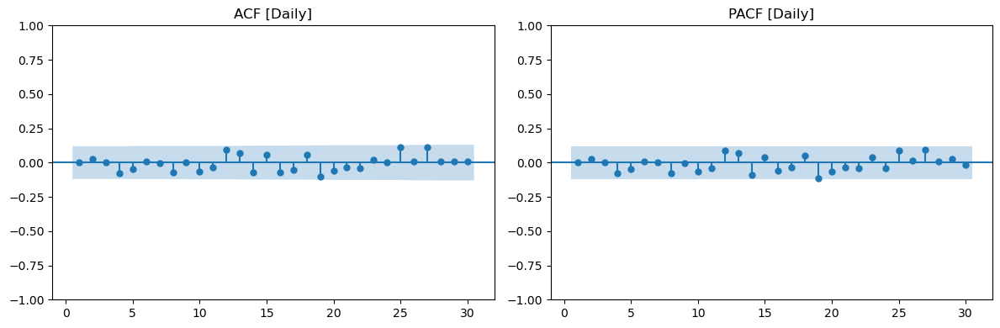

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   5.069587   0.886481
20  19.054787   0.518267
30  27.910115   0.575200



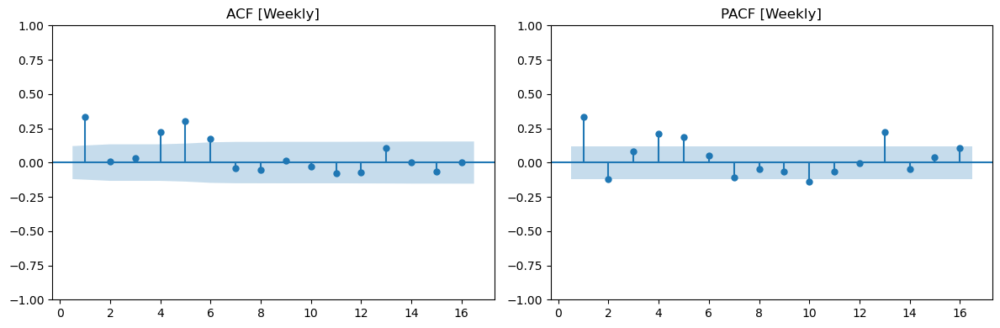

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   78.324784  1.061982e-13
12  81.736269  1.923207e-12
16  86.039738  1.333187e-11



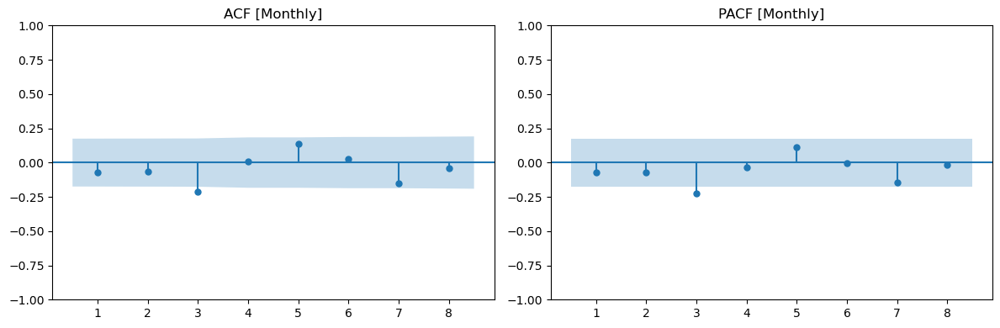

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4   7.068444   0.132315
8  13.057014   0.109903



In [85]:
# Daily residual
residual_diagnostics(df_ymn_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_ymn_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_ymn_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Yueyang Plant

In [86]:
df_yyg_NASA = pd.read_csv('Huaneng_SO2/Huaneng_yueyang.csv')
df_yyg_NASA = cleaning_NASA_data(df_yyg_NASA,'SO2')
df_yyg_NASA

,date,SO2
0,2014-01-12,0.49
1,2014-01-24,0.16
2,2014-02-04,0.14
3,2014-02-06,0.28
4,2014-02-13,0.20
...,...,...
583,2025-06-17,0.01
584,2025-06-22,0.17
585,2025-06-24,0.35
586,2025-06-26,0.17


01:46:36 - cmdstanpy - INFO - Chain [1] start processing
01:46:36 - cmdstanpy - INFO - Chain [1] done processing
01:46:36 - cmdstanpy - INFO - Chain [1] start processing
01:46:36 - cmdstanpy - INFO - Chain [1] done processing
01:46:36 - cmdstanpy - INFO - Chain [1] start processing
01:46:36 - cmdstanpy - INFO - Chain [1] done processing
01:46:36 - cmdstanpy - INFO - Chain [1] start processing
01:46:36 - cmdstanpy - INFO - Chain [1] done processing
01:46:36 - cmdstanpy - INFO - Chain [1] start processing
01:46:36 - cmdstanpy - INFO - Chain [1] done processing
01:46:37 - cmdstanpy - INFO - Chain [1] start processing
01:46:37 - cmdstanpy - INFO - Chain [1] done processing
01:46:37 - cmdstanpy - INFO - Chain [1] start processing
01:46:37 - cmdstanpy - INFO - Chain [1] done processing
01:46:37 - cmdstanpy - INFO - Chain [1] start processing
01:46:37 - cmdstanpy - INFO - Chain [1] done processing
01:46:37 - cmdstanpy - INFO - Chain [1] start processing
01:46:37 - cmdstanpy - INFO - Chain [1]

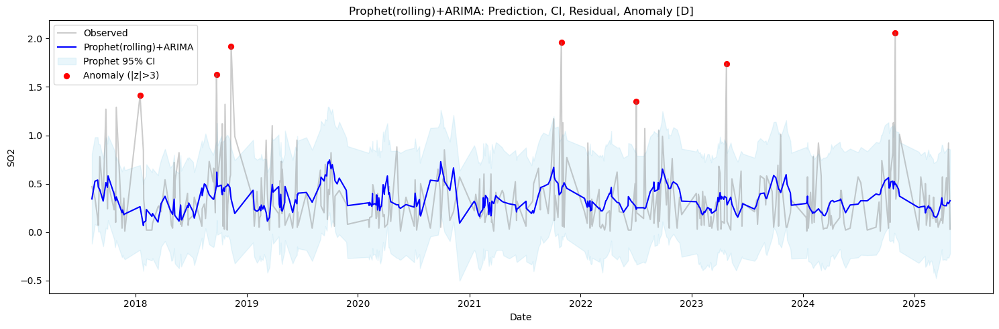

01:46:39 - cmdstanpy - INFO - Chain [1] start processing
01:46:39 - cmdstanpy - INFO - Chain [1] done processing
01:46:39 - cmdstanpy - INFO - Chain [1] start processing
01:46:39 - cmdstanpy - INFO - Chain [1] done processing
01:46:39 - cmdstanpy - INFO - Chain [1] start processing
01:46:39 - cmdstanpy - INFO - Chain [1] done processing
01:46:40 - cmdstanpy - INFO - Chain [1] start processing
01:46:40 - cmdstanpy - INFO - Chain [1] done processing
01:46:40 - cmdstanpy - INFO - Chain [1] start processing
01:46:40 - cmdstanpy - INFO - Chain [1] done processing
01:46:40 - cmdstanpy - INFO - Chain [1] start processing
01:46:40 - cmdstanpy - INFO - Chain [1] done processing
01:46:40 - cmdstanpy - INFO - Chain [1] start processing
01:46:41 - cmdstanpy - INFO - Chain [1] done processing
01:46:41 - cmdstanpy - INFO - Chain [1] start processing
01:46:41 - cmdstanpy - INFO - Chain [1] done processing
01:46:41 - cmdstanpy - INFO - Chain [1] start processing
01:46:41 - cmdstanpy - INFO - Chain [1]

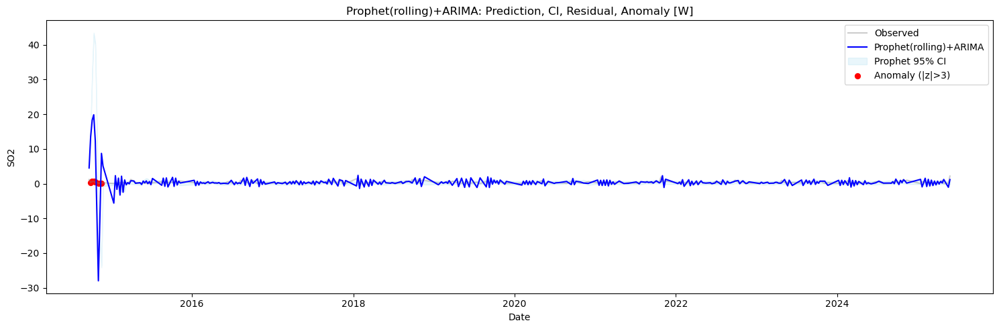

01:46:57 - cmdstanpy - INFO - Chain [1] start processing
01:47:02 - cmdstanpy - INFO - Chain [1] done processing
01:47:02 - cmdstanpy - INFO - Chain [1] start processing
01:47:02 - cmdstanpy - INFO - Chain [1] done processing
01:47:02 - cmdstanpy - INFO - Chain [1] start processing
01:47:03 - cmdstanpy - INFO - Chain [1] done processing
01:47:03 - cmdstanpy - INFO - Chain [1] start processing
01:47:09 - cmdstanpy - INFO - Chain [1] done processing
01:47:09 - cmdstanpy - INFO - Chain [1] start processing
01:47:10 - cmdstanpy - INFO - Chain [1] done processing
01:47:10 - cmdstanpy - INFO - Chain [1] start processing
01:47:16 - cmdstanpy - INFO - Chain [1] done processing
01:47:16 - cmdstanpy - INFO - Chain [1] start processing
01:47:16 - cmdstanpy - INFO - Chain [1] done processing
01:47:16 - cmdstanpy - INFO - Chain [1] start processing
01:47:17 - cmdstanpy - INFO - Chain [1] done processing
01:47:17 - cmdstanpy - INFO - Chain [1] start processing
01:47:18 - cmdstanpy - INFO - Chain [1]

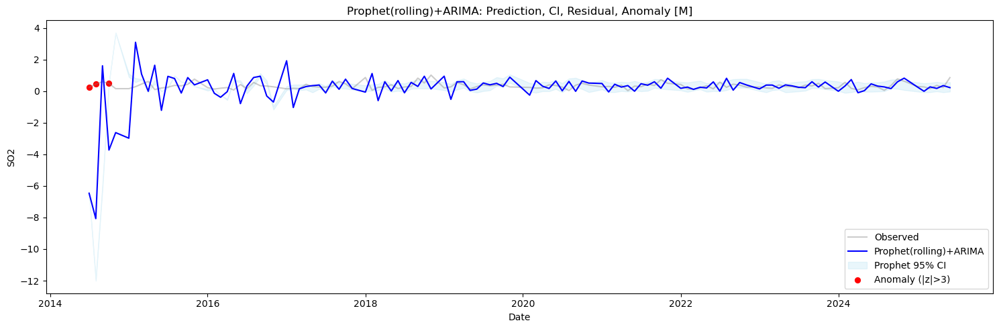

In [87]:
df_yyg_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yyg_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=190, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_yyg_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yyg_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=27, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_yyg_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yyg_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=6, test_steps=3, step=1, z_thresh=3, freq='M', plot=True
)

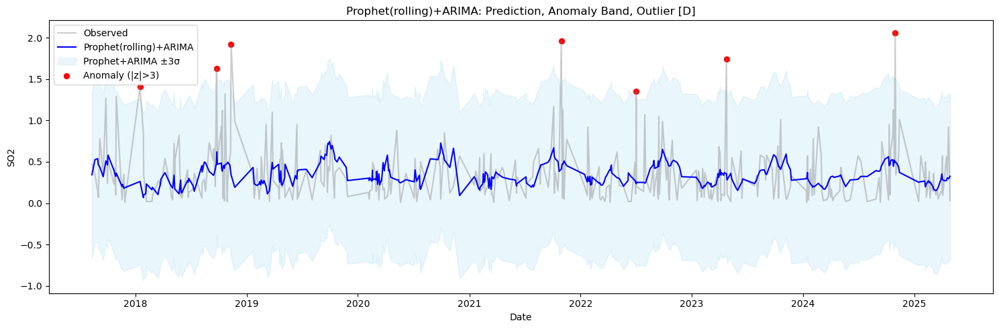

In [88]:
plot_arima_anomaly_band(df_yyg_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


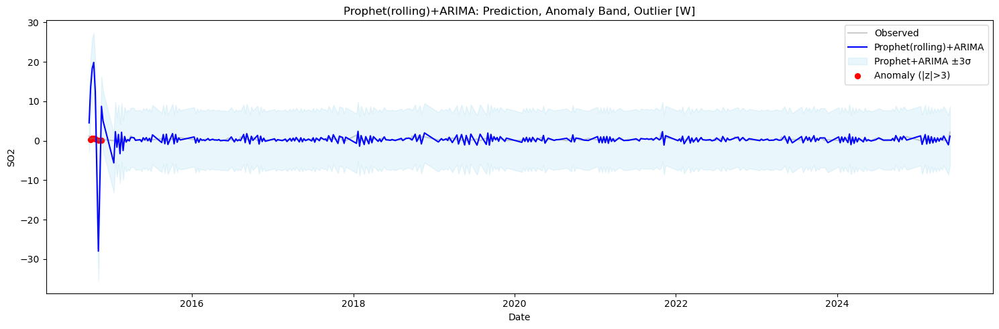

In [89]:
plot_arima_anomaly_band(df_yyg_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


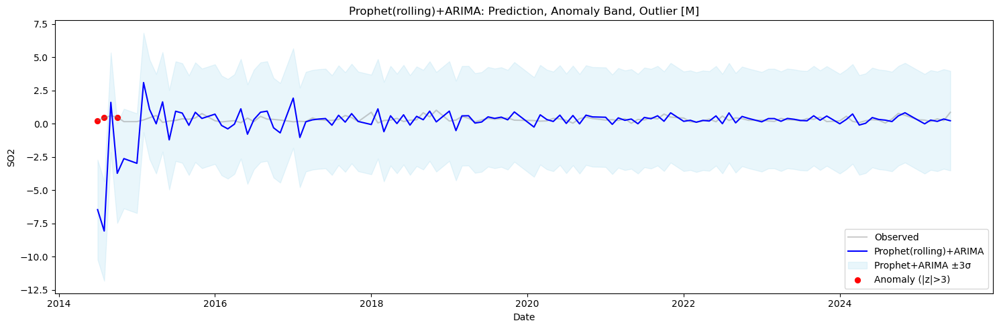

In [90]:
plot_arima_anomaly_band(df_yyg_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


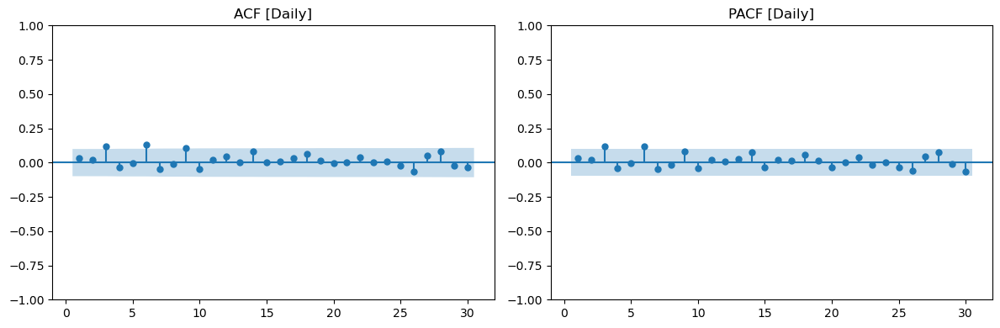

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  19.713146   0.032086
20  25.566020   0.180628
30  32.542502   0.342736



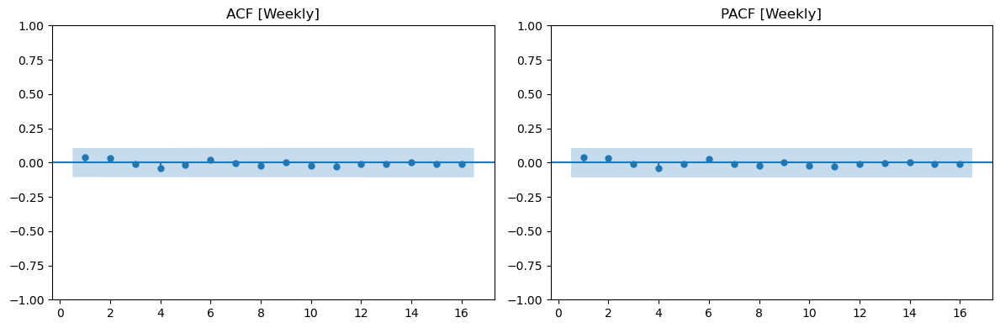

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
     lb_stat  lb_pvalue
8   2.091170   0.978089
12  2.635045   0.997618
16  2.713172   0.999914



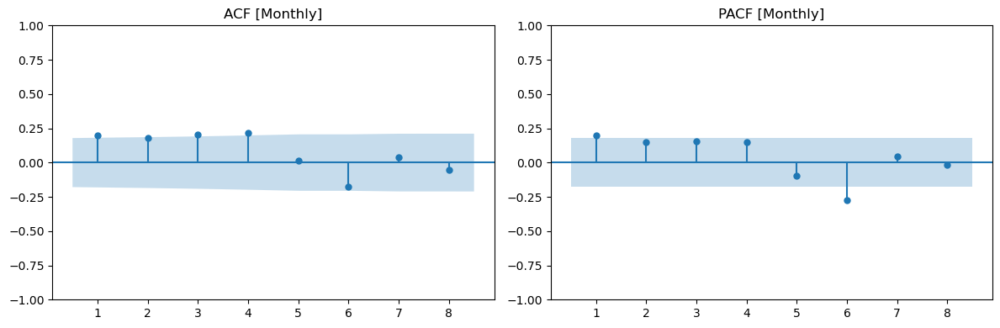

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  20.174440   0.000461
8  24.664221   0.001772



In [91]:
# Daily residual
residual_diagnostics(df_yyg_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_yyg_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_yyg_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Yuhuan Plant

In [92]:
df_yhn_NASA = pd.read_csv('Huaneng_SO2/Huaneng_yuhuan.csv')
df_yhn_NASA = cleaning_NASA_data(df_yhn_NASA,'SO2')
df_yhn_NASA

,date,SO2
0,2014-01-01,0.125531
1,2014-01-04,0.422582
2,2014-01-18,0.245715
3,2014-01-20,0.806582
4,2014-01-24,0.705690
...,...,...
430,2025-06-13,0.329963
431,2025-06-22,0.530000
432,2025-06-27,0.189976
433,2025-06-30,0.064554


01:48:10 - cmdstanpy - INFO - Chain [1] start processing
01:48:10 - cmdstanpy - INFO - Chain [1] done processing
01:48:11 - cmdstanpy - INFO - Chain [1] start processing
01:48:11 - cmdstanpy - INFO - Chain [1] done processing
01:48:11 - cmdstanpy - INFO - Chain [1] start processing
01:48:11 - cmdstanpy - INFO - Chain [1] done processing
01:48:11 - cmdstanpy - INFO - Chain [1] start processing
01:48:11 - cmdstanpy - INFO - Chain [1] done processing
01:48:11 - cmdstanpy - INFO - Chain [1] start processing
01:48:11 - cmdstanpy - INFO - Chain [1] done processing
01:48:11 - cmdstanpy - INFO - Chain [1] start processing
01:48:11 - cmdstanpy - INFO - Chain [1] done processing
01:48:11 - cmdstanpy - INFO - Chain [1] start processing
01:48:11 - cmdstanpy - INFO - Chain [1] done processing
01:48:12 - cmdstanpy - INFO - Chain [1] start processing
01:48:12 - cmdstanpy - INFO - Chain [1] done processing
01:48:12 - cmdstanpy - INFO - Chain [1] start processing
01:48:12 - cmdstanpy - INFO - Chain [1]

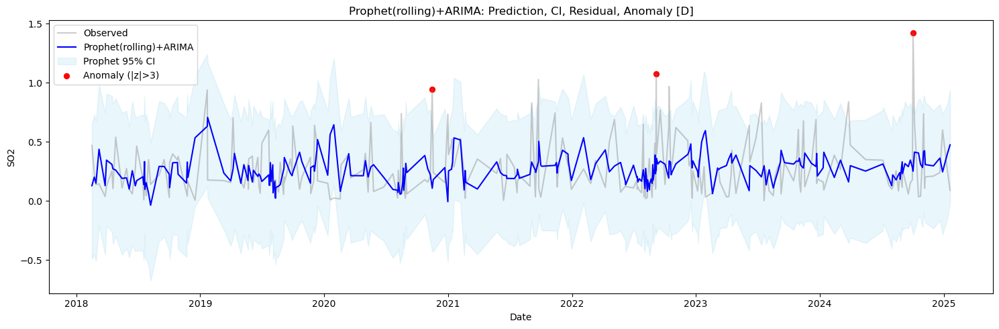

01:48:13 - cmdstanpy - INFO - Chain [1] start processing
01:48:14 - cmdstanpy - INFO - Chain [1] done processing
01:48:14 - cmdstanpy - INFO - Chain [1] start processing
01:48:14 - cmdstanpy - INFO - Chain [1] done processing
01:48:15 - cmdstanpy - INFO - Chain [1] start processing
01:48:15 - cmdstanpy - INFO - Chain [1] done processing
01:48:15 - cmdstanpy - INFO - Chain [1] start processing
01:48:15 - cmdstanpy - INFO - Chain [1] done processing
01:48:15 - cmdstanpy - INFO - Chain [1] start processing
01:48:15 - cmdstanpy - INFO - Chain [1] done processing
01:48:15 - cmdstanpy - INFO - Chain [1] start processing
01:48:15 - cmdstanpy - INFO - Chain [1] done processing
01:48:15 - cmdstanpy - INFO - Chain [1] start processing
01:48:16 - cmdstanpy - INFO - Chain [1] done processing
01:48:16 - cmdstanpy - INFO - Chain [1] start processing
01:48:16 - cmdstanpy - INFO - Chain [1] done processing
01:48:16 - cmdstanpy - INFO - Chain [1] start processing
01:48:16 - cmdstanpy - INFO - Chain [1]

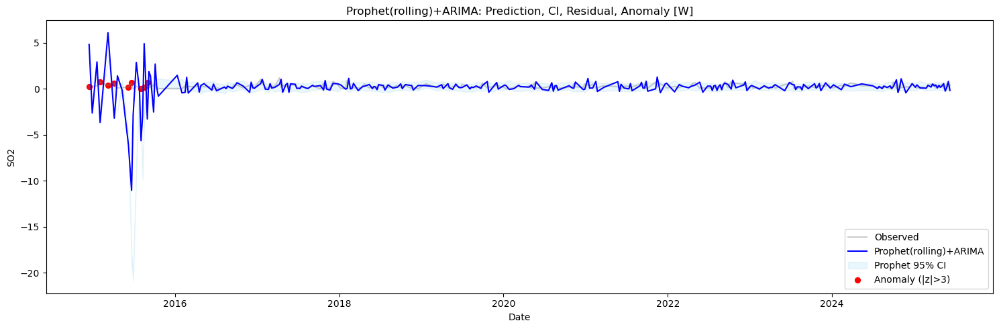

01:48:28 - cmdstanpy - INFO - Chain [1] start processing
01:48:28 - cmdstanpy - INFO - Chain [1] done processing
01:48:28 - cmdstanpy - INFO - Chain [1] start processing
01:48:29 - cmdstanpy - INFO - Chain [1] done processing
01:48:29 - cmdstanpy - INFO - Chain [1] start processing
01:48:29 - cmdstanpy - INFO - Chain [1] done processing
01:48:30 - cmdstanpy - INFO - Chain [1] start processing
01:48:30 - cmdstanpy - INFO - Chain [1] done processing
01:48:30 - cmdstanpy - INFO - Chain [1] start processing
01:48:30 - cmdstanpy - INFO - Chain [1] done processing
01:48:30 - cmdstanpy - INFO - Chain [1] start processing
01:48:30 - cmdstanpy - INFO - Chain [1] done processing
01:48:30 - cmdstanpy - INFO - Chain [1] start processing
01:48:31 - cmdstanpy - INFO - Chain [1] done processing
01:48:31 - cmdstanpy - INFO - Chain [1] start processing
01:48:31 - cmdstanpy - INFO - Chain [1] done processing
01:48:31 - cmdstanpy - INFO - Chain [1] start processing
01:48:31 - cmdstanpy - INFO - Chain [1]

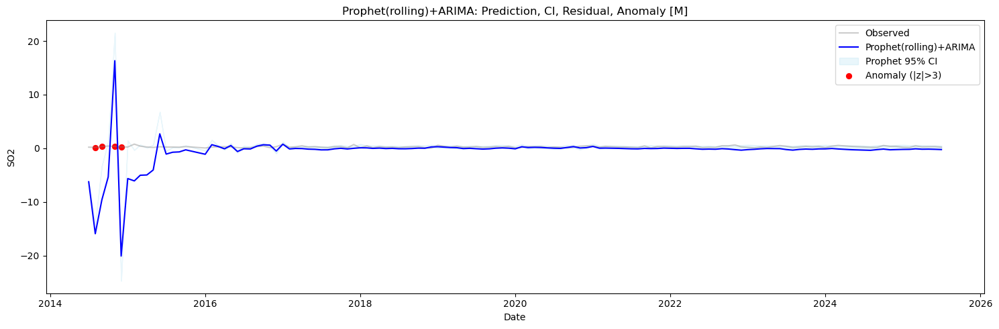

In [93]:
df_yhn_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yhn_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=140, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_yhn_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yhn_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=20, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_yhn_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_yhn_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=5, test_steps=2, step=1, z_thresh=3, freq='M', plot=True
)

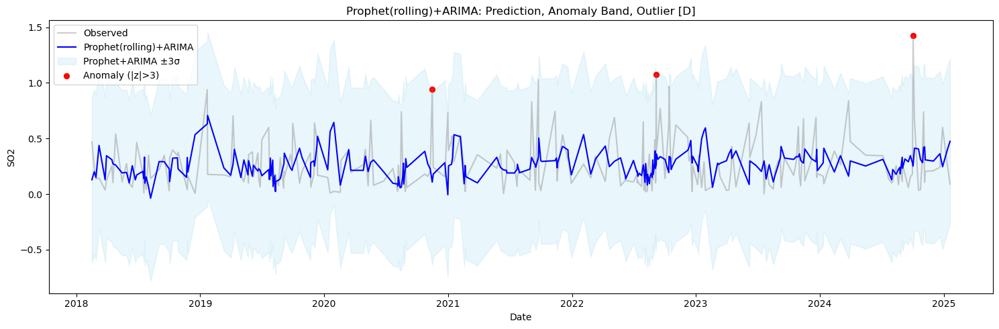

In [94]:
plot_arima_anomaly_band(df_yhn_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


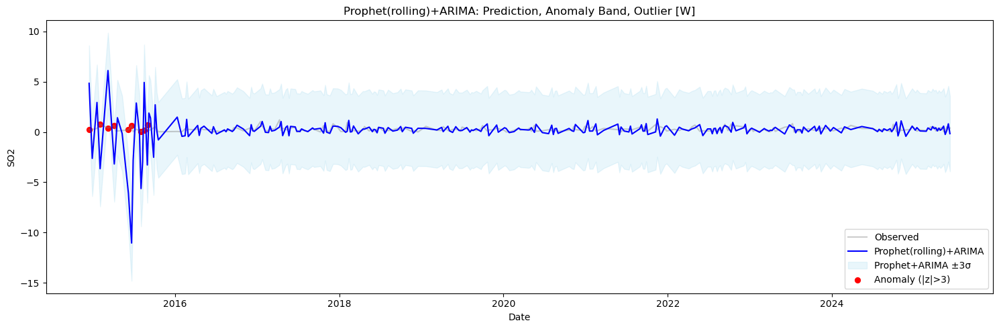

In [95]:
plot_arima_anomaly_band(df_yhn_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


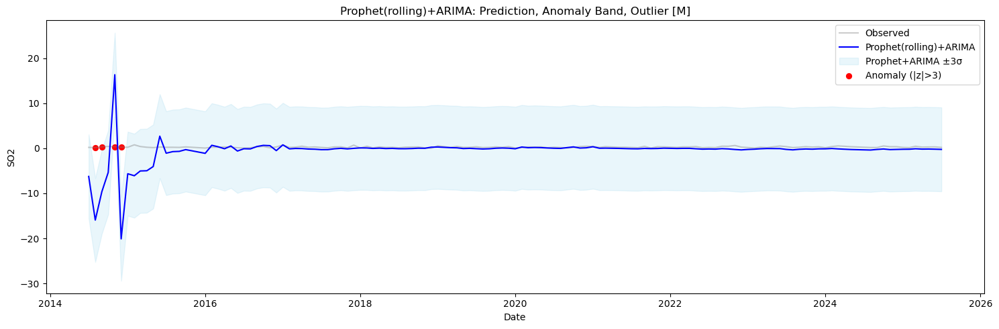

In [96]:
plot_arima_anomaly_band(df_yhn_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


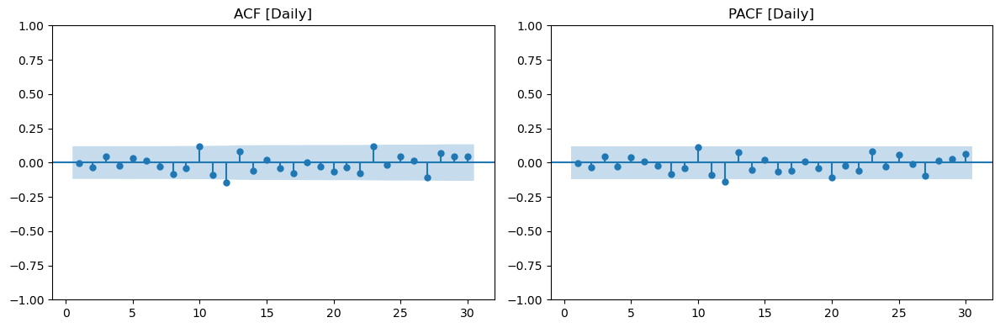

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   7.881797   0.640382
20  23.060835   0.285817
30  36.688705   0.186388



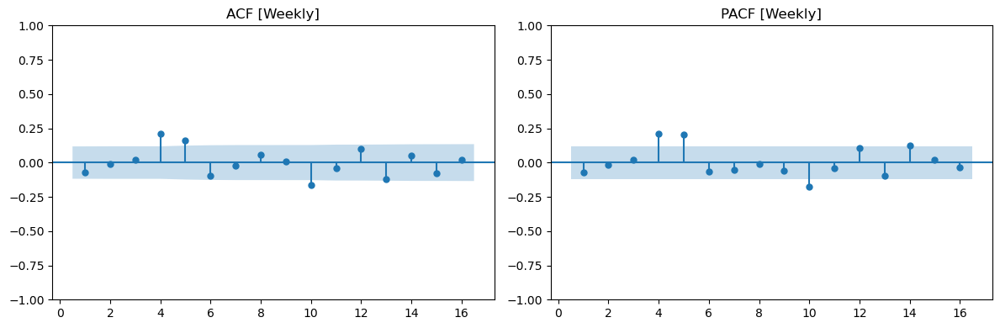

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   25.171291   0.001454
12  36.204424   0.000300
16  42.995682   0.000280



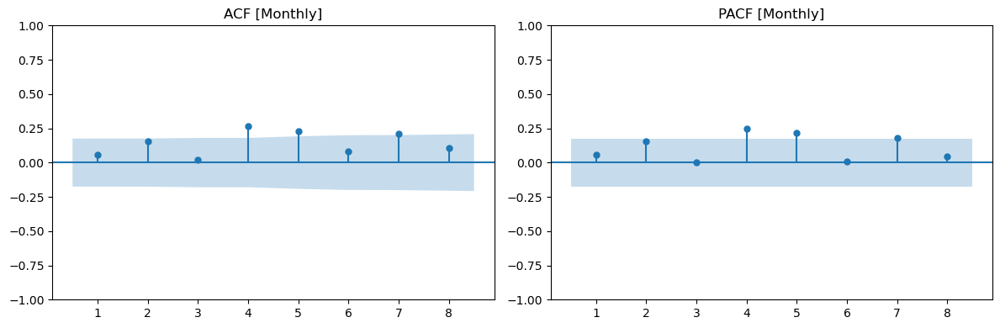

Ljung-Box Test [Monthly] (using lags [4, 8]):
     lb_stat  lb_pvalue
4  12.855337   0.012005
8  28.102738   0.000455



In [97]:
# Daily residual
residual_diagnostics(df_yhn_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_yhn_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_yhn_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Shidongkou plant

In [98]:
df_sdk_NASA = pd.read_csv('Huaneng_SO2/Shidongkou.csv')
df_sdk_NASA = cleaning_NASA_data(df_sdk_NASA,'SO2')
df_sdk_NASA

,date,SO2
0,2014-01-07,0.31
1,2014-01-14,0.35
2,2014-01-20,0.03
3,2014-01-21,0.31
4,2014-01-22,0.46
...,...,...
502,2025-06-04,0.03
503,2025-06-11,0.31
504,2025-06-13,0.28
505,2025-06-14,0.16


01:49:37 - cmdstanpy - INFO - Chain [1] start processing
01:49:37 - cmdstanpy - INFO - Chain [1] done processing
01:49:37 - cmdstanpy - INFO - Chain [1] start processing
01:49:37 - cmdstanpy - INFO - Chain [1] done processing
01:49:37 - cmdstanpy - INFO - Chain [1] start processing
01:49:37 - cmdstanpy - INFO - Chain [1] done processing
01:49:37 - cmdstanpy - INFO - Chain [1] start processing
01:49:37 - cmdstanpy - INFO - Chain [1] done processing
01:49:37 - cmdstanpy - INFO - Chain [1] start processing
01:49:37 - cmdstanpy - INFO - Chain [1] done processing
01:49:37 - cmdstanpy - INFO - Chain [1] start processing
01:49:37 - cmdstanpy - INFO - Chain [1] done processing
01:49:38 - cmdstanpy - INFO - Chain [1] start processing
01:49:38 - cmdstanpy - INFO - Chain [1] done processing
01:49:38 - cmdstanpy - INFO - Chain [1] start processing
01:49:38 - cmdstanpy - INFO - Chain [1] done processing
01:49:38 - cmdstanpy - INFO - Chain [1] start processing
01:49:38 - cmdstanpy - INFO - Chain [1]

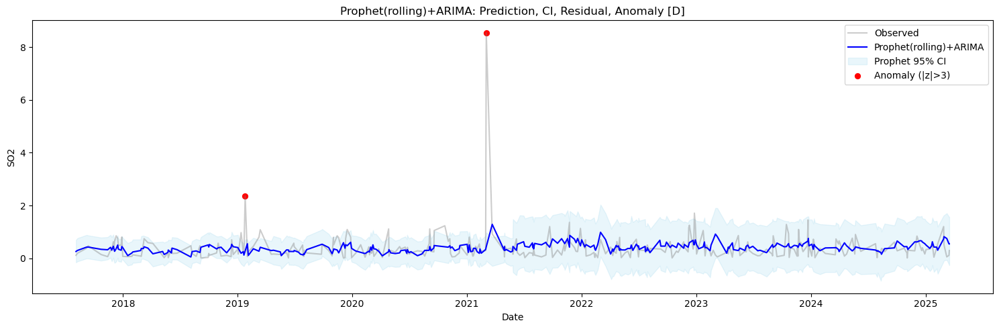

01:49:39 - cmdstanpy - INFO - Chain [1] start processing
01:49:39 - cmdstanpy - INFO - Chain [1] done processing
01:49:39 - cmdstanpy - INFO - Chain [1] start processing
01:49:39 - cmdstanpy - INFO - Chain [1] done processing
01:49:40 - cmdstanpy - INFO - Chain [1] start processing
01:49:40 - cmdstanpy - INFO - Chain [1] done processing
01:49:40 - cmdstanpy - INFO - Chain [1] start processing
01:49:40 - cmdstanpy - INFO - Chain [1] done processing
01:49:40 - cmdstanpy - INFO - Chain [1] start processing
01:49:40 - cmdstanpy - INFO - Chain [1] done processing
01:49:40 - cmdstanpy - INFO - Chain [1] start processing
01:49:40 - cmdstanpy - INFO - Chain [1] done processing
01:49:40 - cmdstanpy - INFO - Chain [1] start processing
01:49:41 - cmdstanpy - INFO - Chain [1] done processing
01:49:41 - cmdstanpy - INFO - Chain [1] start processing
01:49:41 - cmdstanpy - INFO - Chain [1] done processing
01:49:41 - cmdstanpy - INFO - Chain [1] start processing
01:49:41 - cmdstanpy - INFO - Chain [1]

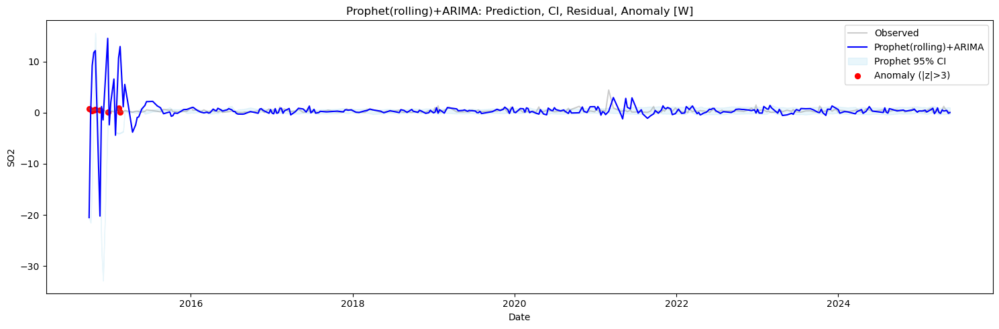

01:50:04 - cmdstanpy - INFO - Chain [1] start processing
01:50:04 - cmdstanpy - INFO - Chain [1] done processing
01:50:04 - cmdstanpy - INFO - Chain [1] start processing
01:50:04 - cmdstanpy - INFO - Chain [1] done processing
01:50:04 - cmdstanpy - INFO - Chain [1] start processing
01:50:09 - cmdstanpy - INFO - Chain [1] done processing
01:50:10 - cmdstanpy - INFO - Chain [1] start processing
01:50:13 - cmdstanpy - INFO - Chain [1] done processing
01:50:13 - cmdstanpy - INFO - Chain [1] start processing
01:50:16 - cmdstanpy - INFO - Chain [1] done processing
01:50:16 - cmdstanpy - INFO - Chain [1] start processing
01:50:19 - cmdstanpy - INFO - Chain [1] done processing
01:50:19 - cmdstanpy - INFO - Chain [1] start processing
01:50:19 - cmdstanpy - INFO - Chain [1] done processing
01:50:19 - cmdstanpy - INFO - Chain [1] start processing
01:50:19 - cmdstanpy - INFO - Chain [1] done processing
01:50:19 - cmdstanpy - INFO - Chain [1] start processing
01:50:20 - cmdstanpy - INFO - Chain [1]

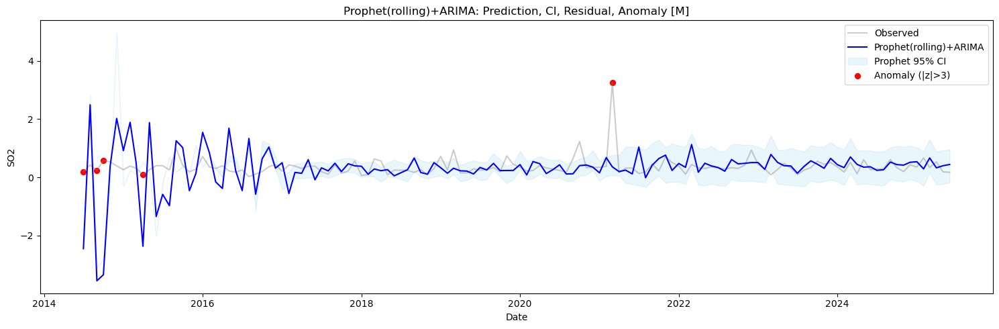

In [99]:
df_sdk_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sdk_NASA, freq='D',pollutant='SO2'), pollutant='SO2',
    train_steps=160, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_sdk_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sdk_NASA, freq='W',pollutant='SO2'), pollutant='SO2',
    train_steps=22, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_sdk_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_sdk_NASA, freq='M',pollutant='SO2'), pollutant='SO2',
    train_steps=5, test_steps=2, step=1, z_thresh=3, freq='M', plot=True
)

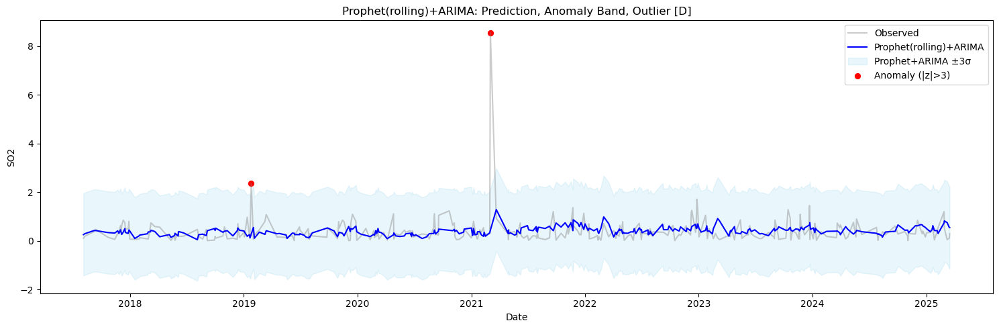

In [100]:
plot_arima_anomaly_band(df_sdk_daily_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='D')


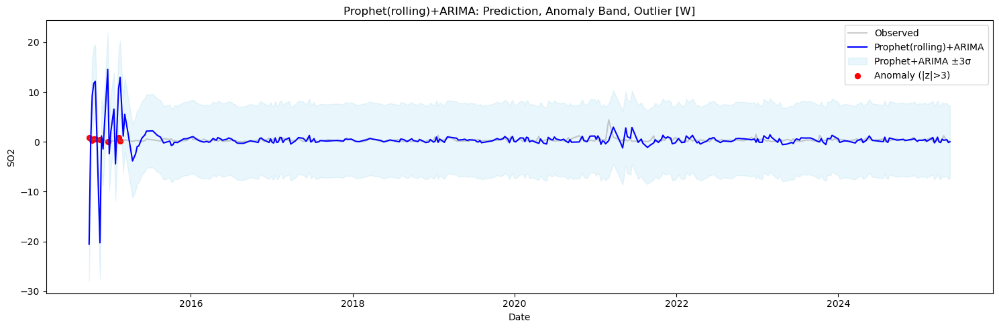

In [101]:
plot_arima_anomaly_band(df_sdk_weekly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='W')


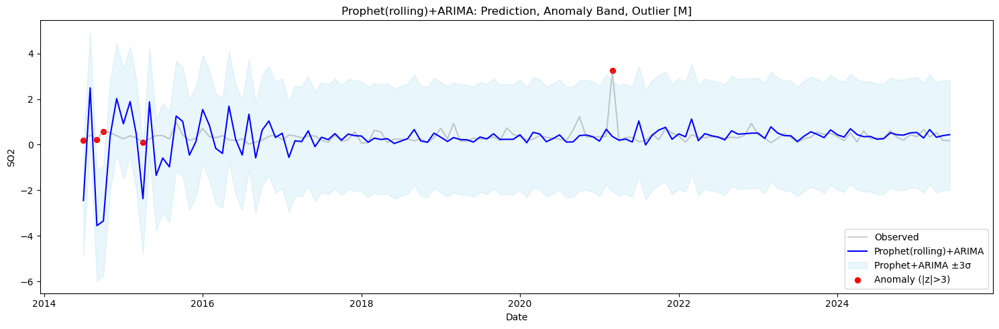

In [102]:
plot_arima_anomaly_band(df_sdk_monthly_result_nasa, pollutant='SO2', shading_k=3, z_thresh=3, freq='M')


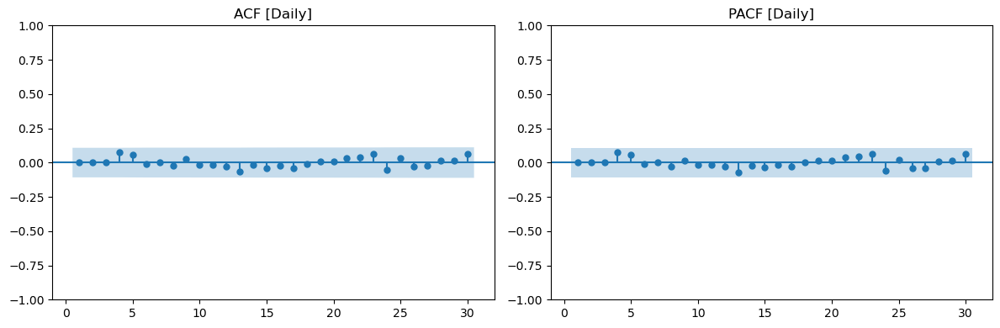

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   3.396304   0.970503
20   6.932022   0.996902
30  12.810841   0.997415



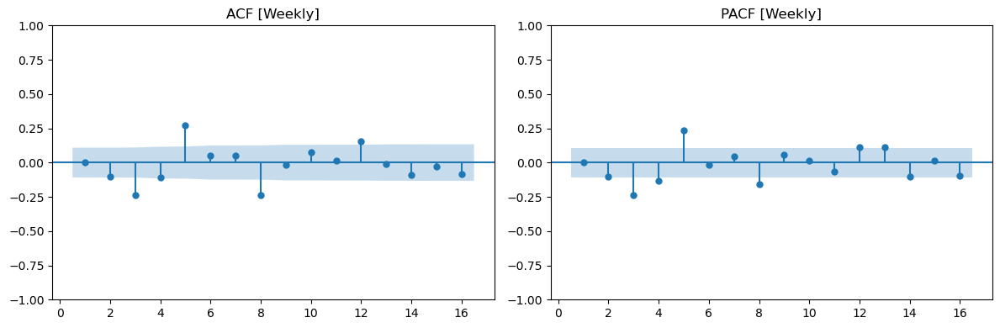

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   70.724917  3.524440e-12
12  80.788661  2.918395e-12
16  86.631710  1.039079e-11



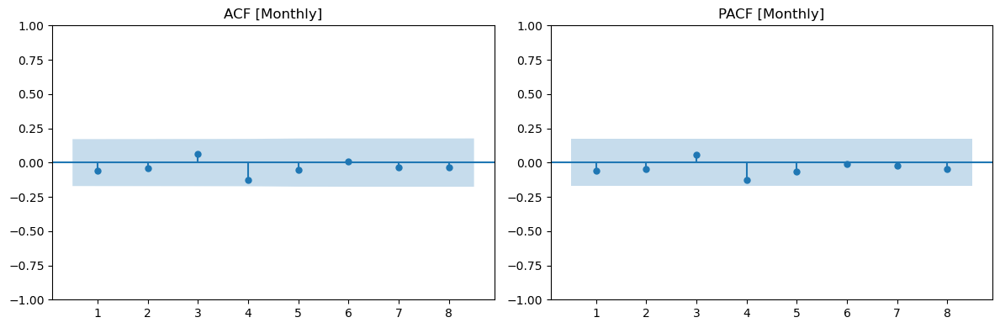

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  3.481291   0.480729
8  4.212690   0.837442



In [103]:
# Daily residual
residual_diagnostics(df_sdk_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_sdk_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_sdk_monthly_result_nasa, lags=[4,8], title='[Monthly]')